In [76]:
! wandb login 93f53574e05ef46db1636e673899f0d6ae9378dd

wandb: Appending key for api.wandb.ai to your netrc file: /Users/athenasaghi/.netrc
wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin


In [61]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Flatten, Concatenate, BatchNormalization, Dropout, LSTM, SpatialDropout1D
from tensorflow.keras.models import Model
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import KFold, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.utils import resample
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Attention, GlobalAveragePooling1D

import wandb
df = pd.read_pickle('/Users/athenasaghi/VSProjects/CognitiveFatigueDetection/processed_data_full.pkl')



X_raweeg = np.stack(df['raweeg'].values)
X_features = np.stack(df['features'].values)
Y_labels = df['label'].values

# Remove class 3
mask = Y_labels != 3
X_raweeg = X_raweeg[mask]
X_features = X_features[mask]
Y_labels = Y_labels[mask]

num_classes = len(np.unique(Y_labels))
Y_labels = to_categorical(Y_labels, num_classes=num_classes)

scaler = StandardScaler()
X_raweeg = scaler.fit_transform(X_raweeg.reshape(-1, X_raweeg.shape[-1])).reshape(X_raweeg.shape)
X_features = scaler.fit_transform(X_features.reshape(-1, X_features.shape[-1])).reshape(X_features.shape)

# Replace padding zeros with small noise to avoid learning issues
X_raweeg[X_raweeg == 0] = np.random.normal(loc=0, scale=1e-6, size=np.sum(X_raweeg == 0))

# Oversample minority classes
X_resampled, Y_resampled, Xf_resampled = [], [], []
labels = np.argmax(Y_labels, axis=1)
for cls in np.unique(labels):
    cls_indices = np.where(labels == cls)[0]
    X_cls_raweeg = X_raweeg[cls_indices]
    X_cls_features = X_features[cls_indices]
    Y_cls = Y_labels[cls_indices]
    X_cls_raweeg, Y_cls, X_cls_features = resample(X_cls_raweeg, Y_cls, X_cls_features, n_samples=max([len(np.where(labels == c)[0]) for c in np.unique(labels)]), random_state=42)
    X_resampled.append(X_cls_raweeg)
    Y_resampled.append(Y_cls)
    Xf_resampled.append(X_cls_features)

X_raweeg = np.vstack(X_resampled)
Y_labels = np.vstack(Y_resampled)
X_features = np.vstack(Xf_resampled)

# Split into train and test sets
X_train_raweeg, X_test_raweeg, X_train_features, X_test_features, Y_train, Y_test = train_test_split(
    X_raweeg, X_features, Y_labels, test_size=0.2, random_state=42, stratify=np.argmax(Y_labels, axis=1)
)


# two tower model

In [6]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Flatten, Concatenate, BatchNormalization, Dropout, LSTM, SpatialDropout1D
from tensorflow.keras.models import Model
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import KFold, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.utils import resample
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Attention, GlobalAveragePooling1D

import wandb
df = pd.read_pickle('/Users/athenasaghi/VSProjects/CognitiveFatigueDetection/processed_data_full.pkl')



X_raweeg = np.stack(df['raweeg'].values)
X_features = np.stack(df['features'].values)
Y_labels = df['label'].values

# Remove class 3
mask = Y_labels != 3
X_raweeg = X_raweeg[mask]
X_features = X_features[mask]
Y_labels = Y_labels[mask]

num_classes = len(np.unique(Y_labels))
Y_labels = to_categorical(Y_labels, num_classes=num_classes)

scaler = StandardScaler()
X_raweeg = scaler.fit_transform(X_raweeg.reshape(-1, X_raweeg.shape[-1])).reshape(X_raweeg.shape)
X_features = scaler.fit_transform(X_features.reshape(-1, X_features.shape[-1])).reshape(X_features.shape)

# Replace padding zeros with small noise to avoid learning issues
X_raweeg[X_raweeg == 0] = np.random.normal(loc=0, scale=1e-6, size=np.sum(X_raweeg == 0))

# Oversample minority classes
X_resampled, Y_resampled, Xf_resampled = [], [], []
labels = np.argmax(Y_labels, axis=1)
for cls in np.unique(labels):
    cls_indices = np.where(labels == cls)[0]
    X_cls_raweeg = X_raweeg[cls_indices]
    X_cls_features = X_features[cls_indices]
    Y_cls = Y_labels[cls_indices]
    X_cls_raweeg, Y_cls, X_cls_features = resample(X_cls_raweeg, Y_cls, X_cls_features, n_samples=max([len(np.where(labels == c)[0]) for c in np.unique(labels)]), random_state=42)
    X_resampled.append(X_cls_raweeg)
    Y_resampled.append(Y_cls)
    Xf_resampled.append(X_cls_features)

X_raweeg = np.vstack(X_resampled)
Y_labels = np.vstack(Y_resampled)
X_features = np.vstack(Xf_resampled)

# Split into train and test sets
X_train_raweeg, X_test_raweeg, X_train_features, X_test_features, Y_train, Y_test = train_test_split(
    X_raweeg, X_features, Y_labels, test_size=0.2, random_state=42, stratify=np.argmax(Y_labels, axis=1)
)

kf = KFold(n_splits=5, shuffle=True, random_state=42)


PROJECT_NAME = "FBCF-TwoTower-10fold"
GROUP_NAME = "Two-tower"+"experiment-" + wandb.util.generate_id()



X_test_list_kfold = []
y_test_list_kfold = []
test_loss_kfold = []
train_loss_kfold = []
test_acc_kfold = []
train_acc_kfold = []
test_auc_kfold = []
train_auc_kfold = []
val_acc_kfold = []
val_loss_kfold = []
val_auc_kfold = []


for fold, (train_index, val_index) in enumerate(kf.split(X_train_raweeg, np.argmax(Y_train, axis=1))):

    run_name = f"fold-{fold}"
    run = wandb.init(project=PROJECT_NAME, group=GROUP_NAME, name=run_name, job_type=run_name, config={"fold": fold})


    X_train_fold_raweeg, X_val_raweeg = X_train_raweeg[train_index], X_train_raweeg[val_index]
    X_train_fold_features, X_val_features = X_train_features[train_index], X_train_features[val_index]
    Y_train_fold, Y_val = Y_train[train_index], Y_train[val_index]

    # Calculate and print class distribution
    train_classes, train_counts = np.unique(np.argmax(Y_train_fold, axis=1), return_counts=True)
    val_classes, val_counts = np.unique(np.argmax(Y_val, axis=1), return_counts=True)
    # Y_train_fold = to_categorical(Y_train_fold)
    # Y_val = to_categorical(Y_val)

    # print("Train set class distribution:")
    # for c, count in zip(train_classes, train_counts):
    #     print(f"Class {c}: {count} samples")

    # print("Validation set class distribution:")
    # for c, count in zip(val_classes, val_counts):
    #     print(f"Class {c}: {count} samples")

    # Define the modelfrom tensorflow.keras.layers import Conv1D, MaxPooling1D, Attention, GlobalAveragePooling1D

    input_raweeg = Input(shape=(X_raweeg.shape[1], X_raweeg.shape[2]))
    x_raweeg = Conv1D(filters=64, kernel_size=3, activation='relu')(input_raweeg)
    x_raweeg = MaxPooling1D(pool_size=2)(x_raweeg)
    x_raweeg = LSTM(128, return_sequences=True)(x_raweeg)
    x_raweeg = SpatialDropout1D(0.5)(x_raweeg)
    x_raweeg = LSTM(128, return_sequences=True)(x_raweeg)
    x_raweeg = SpatialDropout1D(0.5)(x_raweeg)
    x_raweeg = GlobalAveragePooling1D()(x_raweeg)
    x_raweeg = Dense(256, activation='relu')(x_raweeg)
    x_raweeg = BatchNormalization()(x_raweeg)
    x_raweeg = Dropout(0.6)(x_raweeg)

    input_features = Input(shape=(X_features.shape[1], X_features.shape[2]))
    x_features = LSTM(128, return_sequences=True)(input_features)
    x_features = SpatialDropout1D(0.5)(x_features)
    x_features = LSTM(128, return_sequences=True)(x_features)
    x_features = SpatialDropout1D(0.5)(x_features)
    x_features = GlobalAveragePooling1D()(x_features)
    x_features = Dense(256, activation='relu')(x_features)
    x_features = BatchNormalization()(x_features)
    x_features = Dropout(0.6)(x_features)

    combined = Concatenate()([x_raweeg, x_features])
    output = Dense(num_classes, activation='softmax')(combined)

    model = Model(inputs=[input_raweeg, input_features], outputs=output)

    # Compile the model with a different optimizer and learning rate
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), 
                loss='categorical_crossentropy', 
                metrics=['accuracy', 'AUC'])

    # Add early stopping and learning rate reduction callbacks
    callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=10, restore_best_weights=True),
        tf.keras.callbacks.ReduceLROnPlateau(patience=5, factor=0.5)
    ]

    # Train the model
    history = model.fit(
        [X_train_fold_raweeg, X_train_fold_features],
        Y_train_fold,
        epochs=200,  # Reduce the number of epochs since we're using early stopping
        batch_size=32,  # Try a smaller batch size
        validation_data=([X_val_raweeg, X_val_features], Y_val),
        callbacks=callbacks
    )
    # train_acc_kfold.append(history.history['accuracy'])
    # train_loss_kfold.append(history.history['loss'])
    # train_auc_kfold.append(history.history['AUC'])
    # val_acc_kfold.append(history.history['val_accuracy'])
    # val_loss_kfold.append(history.history['val_loss'])
    # val_auc_kfold.append(history.history['val_AUC'])



loss, accuracy, auc = model.evaluate([X_test_raweeg, X_test_features], Y_test)
print(f'Test Loss: {loss:.4f}')
print(f'Test Accuracy: {accuracy:.4f}')

# np.save('train_loss2_kfold', train_loss_kfold)
# np.save('val_loss2_kfold', val_loss_kfold)
# np.save('train_acc2_kfold', train_acc_kfold)
# np.save('val_acc2_kfold', val_acc_kfold)
# np.save('train_auc2_kfold', train_auc_kfold)
# np.save('val_auc2_kfold', val_auc_kfold)

Error in callback <bound method _WandbInit._resume_backend of <wandb.sdk.wandb_init._WandbInit object at 0x36336a1d0>> (for pre_run_cell), with arguments args (<ExecutionInfo object at 120bb1d90, raw_cell="import numpy as np
import pandas as pd
import tens.." store_history=True silent=False shell_futures=True cell_id=vscode-notebook-cell:/Users/athenasaghi/VSProjects/CognitiveFatigueDetection/Modeling/Final.ipynb#W0sZmlsZQ%3D%3D>,),kwargs {}:


BrokenPipeError: [Errno 32] Broken pipe

Epoch 1/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - AUC: 0.4404 - accuracy: 0.2687 - loss: 2.0671 - val_AUC: 0.6107 - val_accuracy: 0.4167 - val_loss: 1.0911 - learning_rate: 1.0000e-04
Epoch 2/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - AUC: 0.6435 - accuracy: 0.4558 - loss: 1.3919 - val_AUC: 0.6263 - val_accuracy: 0.4167 - val_loss: 1.0881 - learning_rate: 1.0000e-04
Epoch 3/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - AUC: 0.5593 - accuracy: 0.4108 - loss: 1.7739 - val_AUC: 0.6788 - val_accuracy: 0.4583 - val_loss: 1.0849 - learning_rate: 1.0000e-04
Epoch 4/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - AUC: 0.5146 - accuracy: 0.4020 - loss: 2.0748 - val_AUC: 0.7027 - val_accuracy: 0.5833 - val_loss: 1.0826 - learning_rate: 1.0000e-04
Epoch 5/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - AUC: 0.3808 - accuracy: 0.1988 - loss: 2.3976 - val_AUC: 0.7083 - val_accuracy: 0.5833 - val_loss: 1.0802 - learning_rate: 1.0000e-04
Epoch 6/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - AUC: 0.4961 - accuracy: 0.3337

BrokenPipeError: [Errno 32] Broken pipe

In [8]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, LSTM, SpatialDropout1D, LayerNormalization, MultiHeadAttention, GlobalAveragePooling1D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.utils import resample

df = pd.read_pickle('/Users/athenasaghi/VSProjects/CognitiveFatigueDetection/processed_data_full.pkl')

X_raweeg = np.stack(df['raweeg'].values)
X_features = np.stack(df['features'].values)
Y_labels = df['label'].values

mask = Y_labels != 3
X_raweeg = X_raweeg[mask]
X_features = X_features[mask]
Y_labels = Y_labels[mask]

num_classes = len(np.unique(Y_labels))
Y_labels = to_categorical(Y_labels, num_classes=num_classes)

scaler = StandardScaler()
X_raweeg = scaler.fit_transform(X_raweeg.reshape(-1, X_raweeg.shape[-1])).reshape(X_raweeg.shape)
X_features = scaler.fit_transform(X_features.reshape(-1, X_features.shape[-1])).reshape(X_features.shape)

X_raweeg[X_raweeg == 0] = np.random.normal(loc=0, scale=1e-6, size=np.sum(X_raweeg == 0))

X_resampled, Y_resampled, Xf_resampled = [], [], []
labels = np.argmax(Y_labels, axis=1)
for cls in np.unique(labels):
    cls_indices = np.where(labels == cls)[0]
    X_cls_raweeg = X_raweeg[cls_indices]
    X_cls_features = X_features[cls_indices]
    Y_cls = Y_labels[cls_indices]
    X_cls_raweeg, Y_cls, X_cls_features = resample(
        X_cls_raweeg, Y_cls, X_cls_features,
        n_samples=max([len(np.where(labels == c)[0]) for c in np.unique(labels)]),
        random_state=42
    )
    X_resampled.append(X_cls_raweeg)
    Y_resampled.append(Y_cls)
    Xf_resampled.append(X_cls_features)

X_raweeg = np.vstack(X_resampled)
Y_labels = np.vstack(Y_resampled)
X_features = np.vstack(Xf_resampled)

X_train_raweeg, X_test_raweeg, X_train_features, X_test_features, Y_train, Y_test = train_test_split(
    X_raweeg, X_features, Y_labels, test_size=0.2, random_state=42, stratify=np.argmax(Y_labels, axis=1)
)
from tensorflow.keras.layers import Dense, Multiply, Lambda, Softmax
import tensorflow.keras.backend as K

def attention_pooling(inputs):
    score = Dense(1, activation='tanh')(inputs)
    weights = Softmax(axis=1)(score)  # <- this is the key fix
    weighted = Multiply()([inputs, weights])
    return Lambda(lambda x: K.sum(x, axis=1))(weighted)


def gated_fusion(x1, x2):
    gate = Dense(1, activation='sigmoid')(tf.keras.layers.Concatenate()([x1, x2]))
    return gate * x1 + (1 - gate) * x2

def build_model(input_shape_raweeg, input_shape_features, num_classes):
    input_raweeg = Input(shape=input_shape_raweeg)
    x1 = LayerNormalization()(input_raweeg)
    x1 = LSTM(128, return_sequences=True)(x1)
    x1 = SpatialDropout1D(0.3)(x1)
    x1 = LSTM(128, return_sequences=True)(x1)
    x1 = MultiHeadAttention(num_heads=4, key_dim=64)(x1, x1)
    x1 = attention_pooling(x1)
    x1 = Dense(256, activation='swish')(x1)
    x1 = Dropout(0.6)(x1)

    input_features = Input(shape=input_shape_features)
    x2 = LayerNormalization()(input_features)
    x2 = LSTM(128, return_sequences=True)(x2)
    x2 = SpatialDropout1D(0.3)(x2)
    x2 = LSTM(128, return_sequences=True)(x2)
    x2 = MultiHeadAttention(num_heads=4, key_dim=64)(x2, x2)
    x2 = attention_pooling(x2)
    x2 = Dense(256, activation='swish')(x2)
    x2 = Dropout(0.6)(x2)

    fused = gated_fusion(x1, x2)
    output = Dense(num_classes, activation='softmax')(fused)

    model = Model(inputs=[input_raweeg, input_features], outputs=output)
    model.compile(optimizer=Adam(learning_rate=1e-4),
                  loss='categorical_crossentropy',
                  metrics=['accuracy', 'AUC'])
    return model

model = build_model(X_train_raweeg.shape[1:], X_train_features.shape[1:], num_classes)

callbacks = [
    tf.keras.callbacks.EarlyStopping(patience=10, restore_best_weights=True),
    tf.keras.callbacks.ReduceLROnPlateau(patience=5, factor=0.5)
]

history = model.fit(
    [X_train_raweeg, X_train_features], Y_train,
    epochs=200,
    batch_size=32,
    validation_split=0.2,
    callbacks=callbacks
)

loss, accuracy, auc = model.evaluate([X_test_raweeg, X_test_features], Y_test)
print(f'Test Loss: {loss:.4f}')
print(f'Test Accuracy: {accuracy:.4f}')
print(f'Test AUC: {auc:.4f}')


Epoch 1/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 23s 7s/step - AUC: 0.5622 - accuracy: 0.3542 - loss: 1.0975 - val_AUC: 0.4792 - val_accuracy: 0.4167 - val_loss: 1.0989 - learning_rate: 1.0000e-04
Epoch 2/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 19s 6s/step - AUC: 0.5390 - accuracy: 0.4592 - loss: 1.0966 - val_AUC: 0.5716 - val_accuracy: 0.2500 - val_loss: 1.0986 - learning_rate: 1.0000e-04
Epoch 3/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 18s 6s/step - AUC: 0.5837 - accuracy: 0.4787 - loss: 1.0961 - val_AUC: 0.5226 - val_accuracy: 0.2917 - val_loss: 1.0982 - learning_rate: 1.0000e-04
Epoch 4/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 20s 7s/step - AUC: 0.6685 - accuracy: 0.5037 - loss: 1.0936 - val_AUC: 0.5191 - val_accuracy: 0.3333 - val_loss: 1.0976 - learning_rate: 1.0000e-04
Epoch 5/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 18s 6s/step - AUC: 0.6223 - accuracy: 0.4656 - loss: 1.0937 - val_AUC: 0.5694 - val_accuracy: 0.3333 - val_loss: 1.0970 - learning_rate: 1.0000e-04
Epoch 6/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 16s 5s/step - AUC: 0.5875 - accuracy: 

In [11]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, LSTM, SpatialDropout1D, LayerNormalization, Dropout, Concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.utils import resample
import pandas as pd

# Load and preprocess data
df = pd.read_pickle('/Users/athenasaghi/VSProjects/CognitiveFatigueDetection/processed_data_full.pkl')
X_raweeg = np.stack(df['raweeg'].values)
X_features = np.stack(df['features'].values)
Y_labels = df['label'].values

# Remove class 3
mask = Y_labels != 3
X_raweeg = X_raweeg[mask]
X_features = X_features[mask]
Y_labels = Y_labels[mask]

# One-hot encode
num_classes = len(np.unique(Y_labels))
Y_labels_cat = to_categorical(Y_labels, num_classes=num_classes)

# Normalize
scaler = StandardScaler()
X_raweeg = scaler.fit_transform(X_raweeg.reshape(-1, X_raweeg.shape[-1])).reshape(X_raweeg.shape)
X_features = scaler.fit_transform(X_features.reshape(-1, X_features.shape[-1])).reshape(X_features.shape)
X_raweeg[X_raweeg == 0] = np.random.normal(loc=0, scale=1e-6, size=np.sum(X_raweeg == 0))

# Oversample
X_resampled, Y_resampled, Xf_resampled = [], [], []
labels = Y_labels
for cls in np.unique(labels):
    cls_indices = np.where(labels == cls)[0]
    X_cls_raweeg = X_raweeg[cls_indices]
    X_cls_features = X_features[cls_indices]
    Y_cls = Y_labels_cat[cls_indices]
    X_cls_raweeg, Y_cls, X_cls_features = resample(
        X_cls_raweeg, Y_cls, X_cls_features,
        n_samples=max([len(np.where(labels == c)[0]) for c in np.unique(labels)]),
        random_state=42
    )
    X_resampled.append(X_cls_raweeg)
    Y_resampled.append(Y_cls)
    Xf_resampled.append(X_cls_features)

X_raweeg = np.vstack(X_resampled)
X_features = np.vstack(Xf_resampled)
Y_labels_cat = np.vstack(Y_resampled)
Y_labels_raw = np.argmax(Y_labels_cat, axis=1)

# Model builder
def build_model(input_shape_raweeg, input_shape_features, num_classes):
    input_raweeg = Input(shape=input_shape_raweeg)
    x1 = LayerNormalization()(input_raweeg)
    x1 = LSTM(128, return_sequences=False)(x1)
    x1 = Dropout(0.3)(x1)
    x1 = Dense(128, activation='swish')(x1)

    input_features = Input(shape=input_shape_features)
    x2 = LayerNormalization()(input_features)
    x2 = LSTM(128, return_sequences=False)(x2)
    x2 = Dropout(0.3)(x2)
    x2 = Dense(128, activation='swish')(x2)

    fused = Concatenate()([x1, x2])
    fused = Dense(128, activation='swish')(fused)
    fused = Dropout(0.3)(fused)
    output = Dense(num_classes, activation='softmax')(fused)

    model = Model(inputs=[input_raweeg, input_features], outputs=output)
    model.compile(optimizer=Adam(learning_rate=1e-4),
                  loss=tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.1),
                  metrics=['accuracy', 'AUC'])
    return model

# K-Fold Cross-Validation
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

acc_scores = []
auc_scores = []

for fold, (train_idx, test_idx) in enumerate(kfold.split(X_raweeg, Y_labels_raw)):
    print(f"\n🌀 Fold {fold+1}/5")

    X_train_raweeg, X_test_raweeg = X_raweeg[train_idx], X_raweeg[test_idx]
    X_train_features, X_test_features = X_features[train_idx], X_features[test_idx]
    Y_train, Y_test = Y_labels_cat[train_idx], Y_labels_cat[test_idx]

    model = build_model(X_raweeg.shape[1:], X_features.shape[1:], num_classes)

    callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=10, restore_best_weights=True),
        tf.keras.callbacks.ReduceLROnPlateau(patience=5, factor=0.5)
    ]

    history = model.fit(
        [X_train_raweeg, X_train_features], Y_train,
        epochs=200,
        batch_size=32,
        validation_split=0.2,
        callbacks=callbacks,
        verbose=0
    )

    loss, accuracy, auc = model.evaluate([X_test_raweeg, X_test_features], Y_test, verbose=0)
    print(f"✅ Fold {fold+1} — Test Accuracy: {accuracy:.4f}, AUC: {auc:.4f}")
    acc_scores.append(accuracy)
    auc_scores.append(auc)

# Results
print("\n📊 K-Fold Results:")
print(f"Average Accuracy: {np.mean(acc_scores):.4f} ± {np.std(acc_scores):.4f}")
print(f"Average AUC:      {np.mean(auc_scores):.4f} ± {np.std(auc_scores):.4f}")



🌀 Fold 1/5
✅ Fold 1 — Test Accuracy: 0.3667, AUC: 0.6442

🌀 Fold 2/5
✅ Fold 2 — Test Accuracy: 0.4333, AUC: 0.6022

🌀 Fold 3/5
✅ Fold 3 — Test Accuracy: 0.2759, AUC: 0.4902

🌀 Fold 4/5
✅ Fold 4 — Test Accuracy: 0.4483, AUC: 0.5913

🌀 Fold 5/5
✅ Fold 5 — Test Accuracy: 0.3448, AUC: 0.4614

📊 K-Fold Results:
Average Accuracy: 0.3738 ± 0.0626
Average AUC:      0.5578 ± 0.0699


In [16]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, LSTM, GlobalAveragePooling1D, Dropout, LayerNormalization, Concatenate, Lambda
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import StandardScaler
from sklearn.utils import resample
from sklearn.model_selection import train_test_split
import tensorflow.keras.backend as K
import pandas as pd

# Load and preprocess
df = pd.read_pickle('/Users/athenasaghi/VSProjects/CognitiveFatigueDetection/processed_data_full.pkl')
X_raweeg = np.stack(df['raweeg'].values)
X_features = np.stack(df['features'].values)
Y_labels = df['label'].values

mask = Y_labels != 3
X_raweeg = X_raweeg[mask]
X_features = X_features[mask]
Y_labels = Y_labels[mask]
Y_labels_cat = to_categorical(Y_labels)
num_classes = Y_labels_cat.shape[1]

scaler = StandardScaler()
X_raweeg = scaler.fit_transform(X_raweeg.reshape(-1, X_raweeg.shape[-1])).reshape(X_raweeg.shape)
X_features = scaler.fit_transform(X_features.reshape(-1, X_features.shape[-1])).reshape(X_features.shape)
X_raweeg[X_raweeg == 0] = np.random.normal(loc=0, scale=1e-6, size=np.sum(X_raweeg == 0))

# Oversample
X_resampled, Y_resampled, Xf_resampled = [], [], []
labels = np.argmax(Y_labels_cat, axis=1)
for cls in np.unique(labels):
    cls_indices = np.where(labels == cls)[0]
    X_cls_r, Y_cls, X_cls_f = X_raweeg[cls_indices], Y_labels_cat[cls_indices], X_features[cls_indices]
    X_cls_r, Y_cls, X_cls_f = resample(X_cls_r, Y_cls, X_cls_f, n_samples=max(np.bincount(labels)), random_state=42)
    X_resampled.append(X_cls_r)
    Y_resampled.append(Y_cls)
    Xf_resampled.append(X_cls_f)

X_raweeg = np.vstack(X_resampled)
Y_labels_cat = np.vstack(Y_resampled)
X_features = np.vstack(Xf_resampled)

X_train_r, X_test_r, X_train_f, X_test_f, Y_train, Y_test = train_test_split(
    X_raweeg, X_features, Y_labels_cat, test_size=0.2, random_state=42, stratify=np.argmax(Y_labels_cat, axis=1)
)

# Encoder
def create_encoder(input_shape):
    inp = Input(shape=input_shape)
    x = LayerNormalization()(inp)
    x = LSTM(128, return_sequences=True)(x)
    x = GlobalAveragePooling1D()(x)
    x = Dense(128, activation='swish')(x)
    x = Lambda(lambda t: K.l2_normalize(t, axis=1))(x)
    return Model(inp, x)

# Contrastive loss
def contrastive_loss(temperature=0.1):
    def loss(z1, z2):
        z1 = tf.math.l2_normalize(z1, axis=1)
        z2 = tf.math.l2_normalize(z2, axis=1)
        batch_size = tf.shape(z1)[0]
        sim = tf.matmul(z1, z2, transpose_b=True) / temperature
        labels = tf.range(batch_size)
        return tf.reduce_mean(tf.keras.losses.sparse_categorical_crossentropy(labels, sim, from_logits=True))
    return loss

# Pretraining model
# New model returns concatenated embeddings
z_r = encoder_r(in_r)
z_f = encoder_f(in_f)
merged = Concatenate(axis=0)([z_r, z_f])  # shape: [2N, dim]

# Create a dummy output (same as input, placeholder)
pretrain_model = Model([in_r, in_f], merged)

# Custom contrastive loss expects 2N inputs (paired: z1, z2, ... zN, zN+1, ...)
def nt_xent_loss(temperature=0.1):
    def loss(_, y_pred):
        y_pred = tf.math.l2_normalize(y_pred, axis=1)
        batch_size = tf.shape(y_pred)[0] // 2

        z1, z2 = y_pred[:batch_size], y_pred[batch_size:]
        representations = tf.concat([z1, z2], axis=0)
        similarity_matrix = tf.matmul(representations, representations, transpose_b=True)

        # remove self-similarity
        logits = similarity_matrix / temperature
        mask = tf.eye(tf.shape(logits)[0])
        logits = logits - 1e9 * mask

        # construct targets: each i in [0, N-1] matches with i+N
        targets = tf.range(batch_size)
        targets = tf.concat([targets + batch_size, targets], axis=0)

        return tf.keras.losses.sparse_categorical_crossentropy(targets, logits, from_logits=True)
    return loss


pretrain_model.compile(optimizer=Adam(1e-4), loss=nt_xent_loss())

# Dummy labels
dummy_labels = np.zeros((X_train_r.shape[0], 1))

# Pretrain
pretrain_model.fit([X_train_r, X_train_f], dummy_labels, epochs=100, batch_size=128)

# Freeze encoders (optional)
for layer in encoder_r.layers:
    layer.trainable = False
for layer in encoder_f.layers:
    layer.trainable = False

# Classification head
z_r = encoder_r(in_r)
z_f = encoder_f(in_f)
z = Concatenate()([z_r, z_f])
x = Dense(128, activation='swish')(z)
x = Dropout(0.3)(x)
out = Dense(num_classes, activation='softmax')(x)
clf_model = Model(inputs=[in_r, in_f], outputs=out)
clf_model.compile(optimizer=Adam(1e-4), loss='categorical_crossentropy', metrics=['accuracy', 'AUC'])

clf_model.fit([X_train_r, X_train_f], Y_train, validation_split=0.2,
              epochs=100, batch_size=32,
              callbacks=[
                  tf.keras.callbacks.EarlyStopping(patience=10, restore_best_weights=True),
                  tf.keras.callbacks.ReduceLROnPlateau(patience=5)
              ])

loss, acc, auc = clf_model.evaluate([X_test_r, X_test_f], Y_test)
print(f"Test Accuracy: {acc:.4f}, Test AUC: {auc:.4f}")


Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 8.9547
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 8.8481
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 8.7440
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 8.6422
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 8.5426
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 8.4452
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 8.3500
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 8.2568
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 8.1657
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 8.0767
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 7.9897
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 7.9048
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 7.8218
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 7.7409
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 7.6619
Epoch 16/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step 

In [21]:
# First split off the unseen test set
X_temp_r, X_test_r, X_temp_f, X_test_f, Y_temp, Y_test = train_test_split(
    X_raweeg, X_features, Y_labels, test_size=0.2, random_state=42, stratify=np.argmax(Y_labels, axis=1)
)

# Then split the remaining into train and validation
X_train_r, X_val_r, X_train_f, X_val_f, Y_train, Y_val = train_test_split(
    X_temp_r, X_temp_f, Y_temp, test_size=0.1, random_state=42, stratify=np.argmax(Y_temp, axis=1)
)


In [23]:
# Freeze or unfreeze encoders based on your strategy
encoder_r.trainable = True
encoder_f.trainable = True

# Inputs
in_r = Input(shape=X_train_r.shape[1:])
in_f = Input(shape=X_train_f.shape[1:])

# Get embeddings
z_r = encoder_r(in_r)
z_f = encoder_f(in_f)

# Combine both embeddings
combined = tf.keras.layers.Concatenate()([z_r, z_f])

# Classifier
x = Dense(128, activation='relu')(combined)
x = Dropout(0.5)(x)
output = Dense(num_classes, activation='softmax')(x)

# Final model
clf_model = Model([in_r, in_f], output)
clf_model.compile(optimizer=Adam(1e-4),
                  loss='categorical_crossentropy',
                  metrics=['accuracy', 'AUC'])

# Train with labels
clf_model.fit([X_train_r, X_train_f], Y_train,
              validation_data=([X_val_r, X_val_f], Y_val),
              epochs=100, batch_size=32)


Epoch 1/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 381ms/step - AUC: 0.5012 - accuracy: 0.3635 - loss: 1.1050 - val_AUC: 0.3993 - val_accuracy: 0.4167 - val_loss: 1.1107
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 353ms/step - AUC: 0.5271 - accuracy: 0.3972 - loss: 1.0970 - val_AUC: 0.4080 - val_accuracy: 0.4167 - val_loss: 1.1098
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 278ms/step - AUC: 0.5096 - accuracy: 0.3486 - loss: 1.1033 - val_AUC: 0.4184 - val_accuracy: 0.3333 - val_loss: 1.1088
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 286ms/step - AUC: 0.5977 - accuracy: 0.4395 - loss: 1.0813 - val_AUC: 0.4410 - val_accuracy: 0.3333 - val_loss: 1.1077
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 265ms/step - AUC: 0.5548 - accuracy: 0.4190 - loss: 1.0916 - val_AUC: 0.4653 - val_accuracy: 0.3333 - val_loss: 1.1067
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 267ms/step - AUC: 0.5026 - accuracy: 0.3541 - loss: 1.1022 - val_AUC: 0.4497 - val_accuracy: 0.3333 - val_loss: 1.1059
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 266ms/

In [24]:
from sklearn.model_selection import StratifiedKFold
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, LSTM, Dropout, Concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.utils import to_categorical
import numpy as np

# Load your actual data here
X_raweeg = np.stack(df['raweeg'].values)
X_features = np.stack(df['features'].values)
Y_labels = df['label'].values

# Remove class 3 if needed
mask = Y_labels != 3
X_raweeg = X_raweeg[mask]
X_features = X_features[mask]
Y_labels = Y_labels[mask]

# One-hot encode labels
num_classes = len(np.unique(Y_labels))
Y_labels = to_categorical(Y_labels, num_classes=num_classes)

# K-Fold Cross-Validation
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
labels = np.argmax(Y_labels, axis=1)
accs, aucs = [], []

for fold, (train_idx, val_idx) in enumerate(kf.split(X_raweeg, labels)):
    X_train_r, X_val_r = X_raweeg[train_idx], X_raweeg[val_idx]
    X_train_f, X_val_f = X_features[train_idx], X_features[val_idx]
    Y_train, Y_val = Y_labels[train_idx], Y_labels[val_idx]

    # Encoder definition
    def build_encoder(input_shape):
        inp = Input(shape=input_shape)
        x = LSTM(64, return_sequences=False)(inp)
        x = Dense(64, activation='relu')(x)
        return Model(inp, x)

    encoder_r = build_encoder(X_train_r.shape[1:])
    encoder_f = build_encoder(X_train_f.shape[1:])

    # Classification head
    in_r = Input(shape=X_train_r.shape[1:])
    in_f = Input(shape=X_train_f.shape[1:])
    z_r = encoder_r(in_r)
    z_f = encoder_f(in_f)
    combined = Concatenate()([z_r, z_f])
    x = Dense(128, activation='relu')(combined)
    x = Dropout(0.5)(x)
    out = Dense(num_classes, activation='softmax')(x)
    clf_model = Model(inputs=[in_r, in_f], outputs=out)

    clf_model.compile(optimizer=Adam(1e-4),
                      loss='categorical_crossentropy',
                      metrics=['accuracy', 'AUC'])

    callbacks = [
        EarlyStopping(patience=10, restore_best_weights=True),
        ReduceLROnPlateau(patience=5, factor=0.5)
    ]

    clf_model.fit([X_train_r, X_train_f], Y_train,
                  validation_data=([X_val_r, X_val_f], Y_val),
                  epochs=100, batch_size=32, callbacks=callbacks, verbose=0)

    loss, acc, auc = clf_model.evaluate([X_val_r, X_val_f], Y_val, verbose=0)
    print(f"Fold {fold+1} — Accuracy: {acc:.4f}, AUC: {auc:.4f}")
    accs.append(acc)
    aucs.append(auc)

print("\n📊 K-Fold Results:")
print(f"Average Accuracy: {np.mean(accs):.4f} ± {np.std(accs):.4f}")
print(f"Average AUC:      {np.mean(aucs):.4f} ± {np.std(aucs):.4f}")


Fold 1 — Accuracy: 0.6250, AUC: 0.7900
Fold 2 — Accuracy: 0.6250, AUC: 0.6748
Fold 3 — Accuracy: 0.5625, AUC: 0.7891
Fold 4 — Accuracy: 0.6667, AUC: 0.7256
Fold 5 — Accuracy: 0.6667, AUC: 0.8222

📊 K-Fold Results:
Average Accuracy: 0.6292 ± 0.0382
Average AUC:      0.7603 ± 0.0530


# CLIP

In [72]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dropout, Dense, BatchNormalization
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import AdamW
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.optimizers.schedules import ExponentialDecay

from tensorflow.keras.layers import Conv1D, MaxPooling1D, GlobalAveragePooling1D

# Set aside a test set before any training

# print("Max raw EEG:", np.max(X_train_raweeg))
# print("Min raw EEG:", np.min(X_train_raweeg))
# print("Max features:", np.max(X_train_features))
# print("Min features:", np.min(X_train_features))


scaler_raweeg = MinMaxScaler()
scaler_features = MinMaxScaler()

X_train_raweeg = scaler_raweeg.fit_transform(X_train_raweeg.reshape(-1, X_train_raweeg.shape[-1])).reshape(X_train_raweeg.shape)
X_test_raweeg = scaler_raweeg.transform(X_test_raweeg.reshape(-1, X_test_raweeg.shape[-1])).reshape(X_test_raweeg.shape)

X_train_features = scaler_features.fit_transform(X_train_features.reshape(-1, X_train_features.shape[-1])).reshape(X_train_features.shape)
X_test_features = scaler_features.transform(X_test_features.reshape(-1, X_test_features.shape[-1])).reshape(X_test_features.shape)

print(X_train_raweeg.shape, X_train_features.shape, Y_train.shape)
print(X_test_raweeg.shape, X_test_features.shape, Y_test.shape)

def add_noise(data, noise_level=0.05):
    return data + noise_level * np.random.randn(*data.shape)

X_train_raweeg = add_noise(X_train_raweeg, noise_level=0.005)
X_train_features = add_noise(X_train_features, noise_level=0.01)


# Encoder function with L2 normalization before output
def create_cnn_encoder(input_shape):
    inputs = Input(shape=input_shape)
    x = Conv1D(16, kernel_size=3, activation='relu')(inputs)
    x = MaxPooling1D(pool_size=2)(x)
    x = Conv1D(32, kernel_size=3, activation='relu')(x)
    x = GlobalAveragePooling1D()(x)
    x = Dense(32, activation=None)(x)
    model = Model(inputs=inputs, outputs=x)
    return model


def create_lstm_encoder(input_shape):
    inputs = Input(shape=input_shape)
    x = LSTM(32, return_sequences=False, kernel_regularizer=l2(1e-4))(inputs)
    x = Dropout(0.5)(x)
    x = Dense(32, activation=None, kernel_regularizer=l2(1e-4))(x)
    model = Model(inputs=inputs, outputs=x)
    return model


encoder_raweeg = create_cnn_encoder(X_train_raweeg.shape[1:])
encoder_features = create_cnn_encoder(X_train_features.shape[1:])


def contrastive_loss(z_raweeg, z_features, temperature=0.2):
    epsilon = 1e-6
    z_raweeg = tf.math.l2_normalize(z_raweeg + epsilon, axis=1)
    z_features = tf.math.l2_normalize(z_features + epsilon, axis=1)
    logits = tf.matmul(z_raweeg, z_features, transpose_b=True) / temperature
    batch_size = tf.shape(logits)[0]
    labels = tf.range(batch_size)
    loss = tf.keras.losses.sparse_categorical_crossentropy(labels, logits, from_logits=True)
    return tf.reduce_mean(loss)



lr_schedule = ExponentialDecay(
    initial_learning_rate=1e-4,
    decay_steps=1000,
    decay_rate=0.96,
    staircase=True
)

optimizer = AdamW(learning_rate=lr_schedule, weight_decay=1e-3, clipnorm=0.6)
epochs = 400
batch_size = 64 


for epoch in range(epochs):
    idx = np.random.permutation(len(X_train_raweeg))
    X_raweeg_shuffled = X_train_raweeg[idx]
    X_features_shuffled = X_train_features[idx]
    losses = []

    # print(len(X_train_raweeg) - batch_size + 1, batch_size)
    for i in range(0, len(X_train_raweeg) - batch_size + 1, batch_size):  # Ensure full batches
        x_r_batch = X_raweeg_shuffled[i:i+batch_size]
        x_f_batch = X_features_shuffled[i:i+batch_size]
        with tf.GradientTape() as tape:
            z_r = encoder_raweeg(x_r_batch, training=True)
            z_f = encoder_features(x_f_batch, training=True)
            loss = contrastive_loss(z_r, z_f)

        grads = tape.gradient(loss, encoder_raweeg.trainable_variables + encoder_features.trainable_variables)

        # Check for NaN in gradients
        if any(tf.math.reduce_any(tf.math.is_nan(g)) for g in grads if g is not None):
            print("NaN detected in gradients! Stopping training.")
            break

        optimizer.apply_gradients(zip(grads, encoder_raweeg.trainable_variables + encoder_features.trainable_variables))
        losses.append(loss.numpy())

    print(f"Epoch {epoch+1}/{epochs}, Contrastive Loss: {np.mean(losses):.4f}")

# Check if embeddings are meaningful (should have variance)
z_r_sample = encoder_raweeg.predict(X_train_raweeg[:10])
print("Encoder Output - Mean:", np.mean(z_r_sample), "Std Dev:", np.std(z_r_sample))


(117, 1854, 4) (117, 202, 16) (117, 3)
(30, 1854, 4) (30, 202, 16) (30, 3)
Epoch 1/400, Contrastive Loss: 4.1708
Epoch 2/400, Contrastive Loss: 4.1704
Epoch 3/400, Contrastive Loss: 4.1653
Epoch 4/400, Contrastive Loss: 4.1652
Epoch 5/400, Contrastive Loss: 4.1654
Epoch 6/400, Contrastive Loss: 4.1660
Epoch 7/400, Contrastive Loss: 4.1650
Epoch 8/400, Contrastive Loss: 4.1648
Epoch 9/400, Contrastive Loss: 4.1625
Epoch 10/400, Contrastive Loss: 4.1619
Epoch 11/400, Contrastive Loss: 4.1628
Epoch 12/400, Contrastive Loss: 4.1624
Epoch 13/400, Contrastive Loss: 4.1621
Epoch 14/400, Contrastive Loss: 4.1619
Epoch 15/400, Contrastive Loss: 4.1617
Epoch 16/400, Contrastive Loss: 4.1621
Epoch 17/400, Contrastive Loss: 4.1615
Epoch 18/400, Contrastive Loss: 4.1612
Epoch 19/400, Contrastive Loss: 4.1606
Epoch 20/400, Contrastive Loss: 4.1595
Epoch 21/400, Contrastive Loss: 4.1602
Epoch 22/400, Contrastive Loss: 4.1610
Epoch 23/400, Contrastive Loss: 4.1605
Epoch 24/400, Contrastive Loss: 4.159

In [73]:
from tensorflow.keras.layers import Concatenate
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score

k = 8
epochs = 400
kf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)
num_classes = Y_labels.shape[1]

metrics_all = { 'loss': [], 'val_loss': [], 'accuracy': [], 'val_accuracy': [], 'auc': [], 'val_auc': [],
                'precision': [], 'val_precision': [], 'recall': [], 'val_recall': [],
                'f1': [], 'val_f1': [], 'specificity': [], 'val_specificity': [], 'confusion_matrix': []}

metrics_per_class = { f'{metric}_class_{i}': [] for i in range(num_classes)
                      for metric in ['precision', 'recall', 'f1', 'specificity',
                                     'val_precision', 'val_recall', 'val_f1', 'val_specificity','val_acc'] }

true_labels = []
pred_labels = []

for fold, (train_idx, val_idx) in enumerate(kf.split(X_train_raweeg, np.argmax(Y_train, axis=1))):
    print(f"\n--------------- Fold {fold + 1}/{k}")

    X_train_raweeg_fold, X_val_raweeg_fold = X_train_raweeg[train_idx], X_train_raweeg[val_idx]
    X_train_features_fold, X_val_features_fold = X_train_features[train_idx], X_train_features[val_idx]
    Y_train_fold, Y_val_fold = Y_train[train_idx], Y_train[val_idx]

    input_raweeg = Input(shape=(X_train_raweeg.shape[1], X_train_raweeg.shape[2]))
    input_features = Input(shape=(X_train_features.shape[1], X_train_features.shape[2]))

    z_raweeg = encoder_raweeg(input_raweeg)
    z_features = encoder_features(input_features)

    combined = Concatenate()([z_raweeg, z_features])
    output = Dense(num_classes, activation='softmax')(combined)

    classifier = Model(inputs=[input_raweeg, input_features], outputs=output)
    classifier.compile(optimizer=AdamW(learning_rate=1e-3, weight_decay=1e-4),
                       loss='categorical_crossentropy',
                       metrics=['accuracy', tf.keras.metrics.AUC(name='auc'),
                                tf.keras.metrics.Precision(name='precision'),
                                tf.keras.metrics.Recall(name='recall'),
                                tf.keras.metrics.SpecificityAtSensitivity(0.5, name='specificity')] +
                                [tf.keras.metrics.Precision(name=f'precision_class_{i}', class_id=i) for i in range(num_classes)] +
                                [tf.keras.metrics.Recall(name=f'recall_class_{i}', class_id=i) for i in range(num_classes)])


    history = classifier.fit([X_train_raweeg_fold, X_train_features_fold], Y_train_fold,
                             validation_data=([X_val_raweeg_fold, X_val_features_fold], Y_val_fold),
                             epochs=epochs, batch_size=128, verbose=1,
                             callbacks=[ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)])



    for metric in metrics_all.keys():
        # print(metric)
        if metric in history.history:
            metrics_all[metric].append(history.history[metric])

    y_pred = classifier.predict([X_val_raweeg_fold, X_val_features_fold])
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(Y_val_fold, axis=1)

    true_labels.extend(y_true_classes)
    pred_labels.extend(y_pred_classes)

    cm = confusion_matrix(y_true_classes, y_pred_classes)
    cm_dict = {f"row_{i}": row.tolist() for i, row in enumerate(cm)}

    metrics_all['confusion_matrix'] = cm_dict

    for i in range(num_classes):
            metrics_per_class[f'precision_class_{i}'].append(history.history[f'precision_class_{i}'])
            metrics_per_class[f'recall_class_{i}'].append(history.history[f'recall_class_{i}'])
            f1_class = f1_score(y_true_classes, y_pred_classes, average=None)[i]
            metrics_per_class[f'f1_class_{i}'].append(f1_class)
            mask = (y_true_classes == i)
            metrics_per_class[f'val_acc_class_{i}'].append(accuracy_score(y_true_classes[mask], y_pred_classes[mask]))



--------------- Fold 1/8
Epoch 1/400
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.3627 - auc: 0.4961 - loss: 1.0986 - precision: 0.0000e+00 - precision_class_0: 0.0000e+00 - precision_class_1: 0.0000e+00 - precision_class_2: 0.0000e+00 - recall: 0.0000e+00 - recall_class_0: 0.0000e+00 - recall_class_1: 0.0000e+00 - recall_class_2: 0.0000e+00 - specificity: 0.3725 - val_accuracy: 0.3333 - val_auc: 0.5844 - val_loss: 1.0920 - val_precision: 0.0000e+00 - val_precision_class_0: 0.0000e+00 - val_precision_class_1: 0.0000e+00 - val_precision_class_2: 0.0000e+00 - val_recall: 0.0000e+00 - val_recall_class_0: 0.0000e+00 - val_recall_class_1: 0.0000e+00 - val_recall_class_2: 0.0000e+00 - val_specificity: 0.5000 - learning_rate: 0.0010
Epoch 2/400
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - accuracy: 0.3725 - auc: 0.5222 - loss: 1.0952 - precision: 0.0000e+00 - precision_class_0: 0.0000e+00 - precision_class_1: 0.0000e+00 - precision_class_2: 0.0000e+00 - recall: 0.0000e+00 - recall_class_0: 

In [74]:
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix
# with more noise 0.005 + scheduler
y_pred_test = classifier.predict([X_test_raweeg, X_test_features])
y_pred_classes_test = np.argmax(y_pred_test, axis=1)
y_true_classes_test = np.argmax(Y_test, axis=1)

test_accuracy = accuracy_score(y_true_classes_test, y_pred_classes_test)
test_auc = roc_auc_score(Y_test, y_pred_test, multi_class='ovr')
conf_matrix = confusion_matrix(y_true_classes_test, y_pred_classes_test)

print(f"\nTest Accuracy: {test_accuracy:.4f}")
print(f"Test AUC: {test_auc:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step

Test Accuracy: 0.9667
Test AUC: 1.0000


In [75]:
print(y_pred_classes_test)
print(y_true_classes_test)

[1 1 2 0 2 1 1 0 2 2 2 0 0 1 2 0 1 0 2 0 1 2 0 0 1 1 2 2 2 1]
[1 1 2 0 2 1 1 0 2 2 0 0 0 1 2 0 1 0 2 0 1 2 0 0 1 1 2 2 2 1]


In [66]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dropout, Dense, BatchNormalization
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import AdamW
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.optimizers.schedules import ExponentialDecay

from tensorflow.keras.layers import Conv1D, MaxPooling1D, GlobalAveragePooling1D

# Set aside a test set before any training

# print("Max raw EEG:", np.max(X_train_raweeg))
# print("Min raw EEG:", np.min(X_train_raweeg))
# print("Max features:", np.max(X_train_features))
# print("Min features:", np.min(X_train_features))


scaler_raweeg = MinMaxScaler()
scaler_features = MinMaxScaler()

X_train_raweeg = scaler_raweeg.fit_transform(X_train_raweeg.reshape(-1, X_train_raweeg.shape[-1])).reshape(X_train_raweeg.shape)
X_test_raweeg = scaler_raweeg.transform(X_test_raweeg.reshape(-1, X_test_raweeg.shape[-1])).reshape(X_test_raweeg.shape)

X_train_features = scaler_features.fit_transform(X_train_features.reshape(-1, X_train_features.shape[-1])).reshape(X_train_features.shape)
X_test_features = scaler_features.transform(X_test_features.reshape(-1, X_test_features.shape[-1])).reshape(X_test_features.shape)

print(X_train_raweeg.shape, X_train_features.shape, Y_train.shape)
print(X_test_raweeg.shape, X_test_features.shape, Y_test.shape)

def add_noise(data, noise_level=0.05):
    return data + noise_level * np.random.randn(*data.shape)

X_train_raweeg = add_noise(X_train_raweeg, noise_level=0.01)
X_train_features = add_noise(X_train_features, noise_level=0.01)
# Encoder function with L2 normalization before output
def create_cnn_encoder(input_shape):
    inputs = Input(shape=input_shape)
    x = Conv1D(16, kernel_size=3, activation='relu')(inputs)
    x = MaxPooling1D(pool_size=2)(x)
    x = Conv1D(32, kernel_size=3, activation='relu')(x)
    x = GlobalAveragePooling1D()(x)
    x = Dense(32, activation=None)(x)
    model = Model(inputs=inputs, outputs=x)
    return model


def create_lstm_encoder(input_shape):
    inputs = Input(shape=input_shape)
    x = LSTM(32, return_sequences=False, kernel_regularizer=l2(1e-4))(inputs)
    x = Dropout(0.5)(x)
    x = Dense(32, activation=None, kernel_regularizer=l2(1e-4))(x)
    model = Model(inputs=inputs, outputs=x)
    return model


encoder_raweeg = create_cnn_encoder(X_train_raweeg.shape[1:])
encoder_features = create_cnn_encoder(X_train_features.shape[1:])


def contrastive_loss(z_raweeg, z_features, temperature=0.2):
    epsilon = 1e-6
    z_raweeg = tf.math.l2_normalize(z_raweeg + epsilon, axis=1)
    z_features = tf.math.l2_normalize(z_features + epsilon, axis=1)
    logits = tf.matmul(z_raweeg, z_features, transpose_b=True) / temperature
    batch_size = tf.shape(logits)[0]
    labels = tf.range(batch_size)
    loss = tf.keras.losses.sparse_categorical_crossentropy(labels, logits, from_logits=True)
    return tf.reduce_mean(loss)



lr_schedule = ExponentialDecay(
    initial_learning_rate=1e-4,
    decay_steps=1000,
    decay_rate=0.96,
    staircase=True
)

optimizer = AdamW(learning_rate=lr_schedule, weight_decay=1e-5)
epochs = 300
batch_size = 64  # Increased batch size


for epoch in range(epochs):
    idx = np.random.permutation(len(X_train_raweeg))
    X_raweeg_shuffled = X_train_raweeg[idx]
    X_features_shuffled = X_train_features[idx]
    losses = []

    # print(len(X_train_raweeg) - batch_size + 1, batch_size)
    for i in range(0, len(X_train_raweeg) - batch_size + 1, batch_size):  # Ensure full batches
        x_r_batch = X_raweeg_shuffled[i:i+batch_size]
        x_f_batch = X_features_shuffled[i:i+batch_size]
        with tf.GradientTape() as tape:
            z_r = encoder_raweeg(x_r_batch, training=True)
            z_f = encoder_features(x_f_batch, training=True)
            loss = contrastive_loss(z_r, z_f)

        grads = tape.gradient(loss, encoder_raweeg.trainable_variables + encoder_features.trainable_variables)

        # Check for NaN in gradients
        if any(tf.math.reduce_any(tf.math.is_nan(g)) for g in grads if g is not None):
            print("NaN detected in gradients! Stopping training.")
            break

        optimizer.apply_gradients(zip(grads, encoder_raweeg.trainable_variables + encoder_features.trainable_variables))
        losses.append(loss.numpy())

    print(f"Epoch {epoch+1}/{epochs}, Contrastive Loss: {np.mean(losses):.4f}")

# Check if embeddings are meaningful (should have variance)
z_r_sample = encoder_raweeg.predict(X_train_raweeg[:10])
print("Encoder Output - Mean:", np.mean(z_r_sample), "Std Dev:", np.std(z_r_sample))


(117, 1854, 4) (117, 202, 16) (117, 3)
(30, 1854, 4) (30, 202, 16) (30, 3)
Epoch 1/300, Contrastive Loss: 4.1890
Epoch 2/300, Contrastive Loss: 4.1803
Epoch 3/300, Contrastive Loss: 4.1841
Epoch 4/300, Contrastive Loss: 4.1789
Epoch 5/300, Contrastive Loss: 4.1817
Epoch 6/300, Contrastive Loss: 4.1814
Epoch 7/300, Contrastive Loss: 4.1784
Epoch 8/300, Contrastive Loss: 4.1788
Epoch 9/300, Contrastive Loss: 4.1735
Epoch 10/300, Contrastive Loss: 4.1731
Epoch 11/300, Contrastive Loss: 4.1761
Epoch 12/300, Contrastive Loss: 4.1714
Epoch 13/300, Contrastive Loss: 4.1692
Epoch 14/300, Contrastive Loss: 4.1701
Epoch 15/300, Contrastive Loss: 4.1692
Epoch 16/300, Contrastive Loss: 4.1688
Epoch 17/300, Contrastive Loss: 4.1678
Epoch 18/300, Contrastive Loss: 4.1661
Epoch 19/300, Contrastive Loss: 4.1669
Epoch 20/300, Contrastive Loss: 4.1673
Epoch 21/300, Contrastive Loss: 4.1662
Epoch 22/300, Contrastive Loss: 4.1658
Epoch 23/300, Contrastive Loss: 4.1635
Epoch 24/300, Contrastive Loss: 4.165

In [67]:
from tensorflow.keras.layers import Concatenate
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score

k = 8
epochs = 400
kf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)
num_classes = Y_labels.shape[1]

metrics_all = { 'loss': [], 'val_loss': [], 'accuracy': [], 'val_accuracy': [], 'auc': [], 'val_auc': [],
                'precision': [], 'val_precision': [], 'recall': [], 'val_recall': [],
                'f1': [], 'val_f1': [], 'specificity': [], 'val_specificity': [], 'confusion_matrix': []}

metrics_per_class = { f'{metric}_class_{i}': [] for i in range(num_classes)
                      for metric in ['precision', 'recall', 'f1', 'specificity',
                                     'val_precision', 'val_recall', 'val_f1', 'val_specificity','val_acc'] }

true_labels = []
pred_labels = []

for fold, (train_idx, val_idx) in enumerate(kf.split(X_train_raweeg, np.argmax(Y_train, axis=1))):
    print(f"\n--------------- Fold {fold + 1}/{k}")

    X_train_raweeg_fold, X_val_raweeg_fold = X_train_raweeg[train_idx], X_train_raweeg[val_idx]
    X_train_features_fold, X_val_features_fold = X_train_features[train_idx], X_train_features[val_idx]
    Y_train_fold, Y_val_fold = Y_train[train_idx], Y_train[val_idx]

    input_raweeg = Input(shape=(X_train_raweeg.shape[1], X_train_raweeg.shape[2]))
    input_features = Input(shape=(X_train_features.shape[1], X_train_features.shape[2]))

    z_raweeg = encoder_raweeg(input_raweeg)
    z_features = encoder_features(input_features)

    combined = Concatenate()([z_raweeg, z_features])
    output = Dense(num_classes, activation='softmax')(combined)

    classifier = Model(inputs=[input_raweeg, input_features], outputs=output)
    classifier.compile(optimizer=AdamW(learning_rate=1e-3, weight_decay=1e-4),
                       loss='categorical_crossentropy',
                       metrics=['accuracy', tf.keras.metrics.AUC(name='auc'),
                                tf.keras.metrics.Precision(name='precision'),
                                tf.keras.metrics.Recall(name='recall'),
                                tf.keras.metrics.SpecificityAtSensitivity(0.5, name='specificity')] +
                                [tf.keras.metrics.Precision(name=f'precision_class_{i}', class_id=i) for i in range(num_classes)] +
                                [tf.keras.metrics.Recall(name=f'recall_class_{i}', class_id=i) for i in range(num_classes)])


    history = classifier.fit([X_train_raweeg_fold, X_train_features_fold], Y_train_fold,
                             validation_data=([X_val_raweeg_fold, X_val_features_fold], Y_val_fold),
                             epochs=epochs, batch_size=128, verbose=1,
                             callbacks=[ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-5)])



    for metric in metrics_all.keys():
        # print(metric)
        if metric in history.history:
            metrics_all[metric].append(history.history[metric])

    y_pred = classifier.predict([X_val_raweeg_fold, X_val_features_fold])
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(Y_val_fold, axis=1)

    true_labels.extend(y_true_classes)
    pred_labels.extend(y_pred_classes)

    cm = confusion_matrix(y_true_classes, y_pred_classes)
    cm_dict = {f"row_{i}": row.tolist() for i, row in enumerate(cm)}

    metrics_all['confusion_matrix'] = cm_dict

    for i in range(num_classes):
            metrics_per_class[f'precision_class_{i}'].append(history.history[f'precision_class_{i}'])
            metrics_per_class[f'recall_class_{i}'].append(history.history[f'recall_class_{i}'])
            f1_class = f1_score(y_true_classes, y_pred_classes, average=None)[i]
            metrics_per_class[f'f1_class_{i}'].append(f1_class)
            mask = (y_true_classes == i)
            metrics_per_class[f'val_acc_class_{i}'].append(accuracy_score(y_true_classes[mask], y_pred_classes[mask]))



--------------- Fold 1/8
Epoch 1/400
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.3039 - auc: 0.4298 - loss: 1.1018 - precision: 0.0000e+00 - precision_class_0: 0.0000e+00 - precision_class_1: 0.0000e+00 - precision_class_2: 0.0000e+00 - recall: 0.0000e+00 - recall_class_0: 0.0000e+00 - recall_class_1: 0.0000e+00 - recall_class_2: 0.0000e+00 - specificity: 0.4118 - val_accuracy: 0.1333 - val_auc: 0.4256 - val_loss: 1.1017 - val_precision: 0.0000e+00 - val_precision_class_0: 0.0000e+00 - val_precision_class_1: 0.0000e+00 - val_precision_class_2: 0.0000e+00 - val_recall: 0.0000e+00 - val_recall_class_0: 0.0000e+00 - val_recall_class_1: 0.0000e+00 - val_recall_class_2: 0.0000e+00 - val_specificity: 0.3333 - learning_rate: 0.0010
Epoch 2/400
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - accuracy: 0.2353 - auc: 0.4659 - loss: 1.0994 - precision: 0.0000e+00 - precision_class_0: 0.0000e+00 - precision_class_1: 0.0000e+00 - precision_class_2: 0.0000e+00 - recall: 0.0000e+00 - recall_class_0: 

In [68]:
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix
# with more noise 0.005 + scheduler
y_pred_test = classifier.predict([X_test_raweeg, X_test_features])
y_pred_classes_test = np.argmax(y_pred_test, axis=1)
y_true_classes_test = np.argmax(Y_test, axis=1)

test_accuracy = accuracy_score(y_true_classes_test, y_pred_classes_test)
test_auc = roc_auc_score(Y_test, y_pred_test, multi_class='ovr')
conf_matrix = confusion_matrix(y_true_classes_test, y_pred_classes_test)

print(f"\nTest Accuracy: {test_accuracy:.4f}")
print(f"Test AUC: {test_auc:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step

Test Accuracy: 0.6667
Test AUC: 0.8000


In [69]:
y_true_classes_test , y_pred_classes_test


(array([1, 1, 2, 0, 2, 1, 1, 0, 2, 2, 0, 0, 0, 1, 2, 0, 1, 0, 2, 0, 1, 2,
        0, 0, 1, 1, 2, 2, 2, 1]),
 array([1, 0, 2, 0, 2, 1, 2, 1, 2, 2, 0, 0, 0, 1, 2, 0, 0, 0, 1, 1, 1, 1,
        0, 0, 0, 1, 2, 2, 1, 2]))

# CLIP 2

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dropout, Dense, BatchNormalization
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import AdamW
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.optimizers.schedules import ExponentialDecay

from tensorflow.keras.layers import Conv1D, MaxPooling1D, GlobalAveragePooling1D


scaler_raweeg = MinMaxScaler()
scaler_features = MinMaxScaler()

X_train_raweeg = scaler_raweeg.fit_transform(X_train_raweeg.reshape(-1, X_train_raweeg.shape[-1])).reshape(X_train_raweeg.shape)
X_test_raweeg = scaler_raweeg.transform(X_test_raweeg.reshape(-1, X_test_raweeg.shape[-1])).reshape(X_test_raweeg.shape)

X_train_features = scaler_features.fit_transform(X_train_features.reshape(-1, X_train_features.shape[-1])).reshape(X_train_features.shape)
X_test_features = scaler_features.transform(X_test_features.reshape(-1, X_test_features.shape[-1])).reshape(X_test_features.shape)

print(X_train_raweeg.shape, X_train_features.shape, Y_train.shape)
print(X_test_raweeg.shape, X_test_features.shape, Y_test.shape)

def add_noise(data, noise_level=0.05):
    return data + noise_level * np.random.randn(*data.shape)

# X_train_raweeg = add_noise(X_train_raweeg, noise_level=0.001)
# X_train_features = add_noise(X_train_features, noise_level=0.01)


# Encoder function with L2 normalization before output
def create_cnn_encoder(input_shape):
    inputs = Input(shape=input_shape)
    x = Conv1D(16, kernel_size=3, activation='relu')(inputs)
    x = MaxPooling1D(pool_size=2)(x)
    x = Conv1D(32, kernel_size=3, activation='relu')(x)
    x = GlobalAveragePooling1D()(x)
    x = Dense(32, activation=None)(x)
    model = Model(inputs=inputs, outputs=x)
    return model


def create_lstm_encoder(input_shape):
    inputs = Input(shape=input_shape)
    x = LSTM(32, return_sequences=False, kernel_regularizer=l2(1e-4))(inputs)
    x = Dropout(0.5)(x)
    x = Dense(32, activation=None, kernel_regularizer=l2(1e-4))(x)
    model = Model(inputs=inputs, outputs=x)
    return model


encoder_raweeg = create_cnn_encoder(X_train_raweeg.shape[1:])
encoder_features = create_cnn_encoder(X_train_features.shape[1:])


def contrastive_loss(z_raweeg, z_features, temperature=0.2):
    epsilon = 1e-6
    z_raweeg = tf.math.l2_normalize(z_raweeg + epsilon, axis=1)
    z_features = tf.math.l2_normalize(z_features + epsilon, axis=1)
    logits = tf.matmul(z_raweeg, z_features, transpose_b=True) / temperature
    batch_size = tf.shape(logits)[0]
    labels = tf.range(batch_size)
    loss = tf.keras.losses.sparse_categorical_crossentropy(labels, logits, from_logits=True)
    return tf.reduce_mean(loss)



lr_schedule = ExponentialDecay(
    initial_learning_rate=1e-2,
    decay_steps=1000,
    decay_rate=0.96,
    staircase=True
)

optimizer = AdamW(learning_rate=lr_schedule, weight_decay=1e-3, clipnorm=0.6)
epochs = 500
batch_size = 64 


for epoch in range(epochs):
    idx = np.random.permutation(len(X_train_raweeg))
    X_raweeg_shuffled = X_train_raweeg[idx]
    X_features_shuffled = X_train_features[idx]
    losses = []

    # print(len(X_train_raweeg) - batch_size + 1, batch_size)
    for i in range(0, len(X_train_raweeg) - batch_size + 1, batch_size):  # Ensure full batches
        x_r_batch = X_raweeg_shuffled[i:i+batch_size]
        x_f_batch = X_features_shuffled[i:i+batch_size]
        with tf.GradientTape() as tape:
            z_r = encoder_raweeg(x_r_batch, training=True)
            z_f = encoder_features(x_f_batch, training=True)
            loss = contrastive_loss(z_r, z_f)

        grads = tape.gradient(loss, encoder_raweeg.trainable_variables + encoder_features.trainable_variables)

        # Check for NaN in gradients
        if any(tf.math.reduce_any(tf.math.is_nan(g)) for g in grads if g is not None):
            print("NaN detected in gradients! Stopping training.")
            break

        optimizer.apply_gradients(zip(grads, encoder_raweeg.trainable_variables + encoder_features.trainable_variables))
        losses.append(loss.numpy())

    print(f"Epoch {epoch+1}/{epochs}, Contrastive Loss: {np.mean(losses):.4f}")

# Check if embeddings are meaningful (should have variance)
z_r_sample = encoder_raweeg.predict(X_train_raweeg[:10])
print("Encoder Output - Mean:", np.mean(z_r_sample), "Std Dev:", np.std(z_r_sample))


(117, 1854, 4) (117, 202, 16) (117, 3)
(30, 1854, 4) (30, 202, 16) (30, 3)
Epoch 1/500, Contrastive Loss: 4.1628
Epoch 2/500, Contrastive Loss: 4.1659
Epoch 3/500, Contrastive Loss: 4.1602
Epoch 4/500, Contrastive Loss: 4.1586
Epoch 5/500, Contrastive Loss: 4.1591
Epoch 6/500, Contrastive Loss: 4.1585
Epoch 7/500, Contrastive Loss: 4.1588
Epoch 8/500, Contrastive Loss: 4.1585
Epoch 9/500, Contrastive Loss: 4.1585
Epoch 10/500, Contrastive Loss: 4.1582
Epoch 11/500, Contrastive Loss: 4.1583
Epoch 12/500, Contrastive Loss: 4.1581
Epoch 13/500, Contrastive Loss: 4.1576
Epoch 14/500, Contrastive Loss: 4.1571
Epoch 15/500, Contrastive Loss: 4.1569
Epoch 16/500, Contrastive Loss: 4.1558
Epoch 17/500, Contrastive Loss: 4.1553
Epoch 18/500, Contrastive Loss: 4.1539
Epoch 19/500, Contrastive Loss: 4.1506
Epoch 20/500, Contrastive Loss: 4.1446
Epoch 21/500, Contrastive Loss: 4.1385
Epoch 22/500, Contrastive Loss: 4.1041
Epoch 23/500, Contrastive Loss: 4.1210
Epoch 24/500, Contrastive Loss: 4.090

In [139]:
from tensorflow.keras.layers import Concatenate
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score

k = 8
epochs = 400
kf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)
num_classes = Y_labels.shape[1]

metrics_all = { 'loss': [], 'val_loss': [], 'accuracy': [], 'val_accuracy': [], 'auc': [], 'val_auc': [],
                'precision': [], 'val_precision': [], 'recall': [], 'val_recall': [],
                'f1': [], 'val_f1': [], 'specificity': [], 'val_specificity': [], 'confusion_matrix': []}

metrics_per_class = { f'{metric}_class_{i}': [] for i in range(num_classes)
                      for metric in ['precision', 'recall', 'f1', 'specificity',
                                     'val_precision', 'val_recall', 'val_f1', 'val_specificity','val_acc'] }

true_labels = []
pred_labels = []

for fold, (train_idx, val_idx) in enumerate(kf.split(X_train_raweeg, np.argmax(Y_train, axis=1))):
    print(f"\n--------------- Fold {fold + 1}/{k}")

    X_train_raweeg_fold, X_val_raweeg_fold = X_train_raweeg[train_idx], X_train_raweeg[val_idx]
    X_train_features_fold, X_val_features_fold = X_train_features[train_idx], X_train_features[val_idx]
    Y_train_fold, Y_val_fold = Y_train[train_idx], Y_train[val_idx]

    input_raweeg = Input(shape=(X_train_raweeg.shape[1], X_train_raweeg.shape[2]))
    input_features = Input(shape=(X_train_features.shape[1], X_train_features.shape[2]))

    z_raweeg = encoder_raweeg(input_raweeg)
    z_features = encoder_features(input_features)

    combined = Concatenate()([z_raweeg, z_features])
    output = Dense(num_classes, activation='softmax')(combined)

    classifier = Model(inputs=[input_raweeg, input_features], outputs=output)
    classifier.compile(optimizer=AdamW(learning_rate=1e-3, weight_decay=1e-4),
                       loss='categorical_crossentropy',
                       metrics=['accuracy', tf.keras.metrics.AUC(name='auc'),
                                tf.keras.metrics.Precision(name='precision'),
                                tf.keras.metrics.Recall(name='recall'),
                                tf.keras.metrics.SpecificityAtSensitivity(0.5, name='specificity')] +
                                [tf.keras.metrics.Precision(name=f'precision_class_{i}', class_id=i) for i in range(num_classes)] +
                                [tf.keras.metrics.Recall(name=f'recall_class_{i}', class_id=i) for i in range(num_classes)])


    history = classifier.fit([X_train_raweeg_fold, X_train_features_fold], Y_train_fold,
                             validation_data=([X_val_raweeg_fold, X_val_features_fold], Y_val_fold),
                             epochs=epochs, batch_size=128, verbose=1,
                             callbacks=[ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)])



    for metric in metrics_all.keys():
        # print(metric)
        if metric in history.history:
            metrics_all[metric].append(history.history[metric])

    y_pred = classifier.predict([X_val_raweeg_fold, X_val_features_fold])
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(Y_val_fold, axis=1)

    true_labels.extend(y_true_classes)
    pred_labels.extend(y_pred_classes)

    cm = confusion_matrix(y_true_classes, y_pred_classes)
    cm_dict = {f"row_{i}": row.tolist() for i, row in enumerate(cm)}

    metrics_all['confusion_matrix'] = cm_dict

    for i in range(num_classes):
            metrics_per_class[f'precision_class_{i}'].append(history.history[f'precision_class_{i}'])
            metrics_per_class[f'recall_class_{i}'].append(history.history[f'recall_class_{i}'])
            f1_class = f1_score(y_true_classes, y_pred_classes, average=None)[i]
            metrics_per_class[f'f1_class_{i}'].append(f1_class)
            mask = (y_true_classes == i)
            metrics_per_class[f'val_acc_class_{i}'].append(accuracy_score(y_true_classes[mask], y_pred_classes[mask]))



--------------- Fold 1/8
Epoch 1/400
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.3235 - auc: 0.4742 - loss: 1.1599 - precision: 0.5000 - precision_class_0: 0.5000 - precision_class_1: 0.0000e+00 - precision_class_2: 0.0000e+00 - recall: 0.0392 - recall_class_0: 0.1176 - recall_class_1: 0.0000e+00 - recall_class_2: 0.0000e+00 - specificity: 0.5196 - val_accuracy: 0.4667 - val_auc: 0.5144 - val_loss: 1.1136 - val_precision: 1.0000 - val_precision_class_0: 1.0000 - val_precision_class_1: 0.0000e+00 - val_precision_class_2: 0.0000e+00 - val_recall: 0.0667 - val_recall_class_0: 0.2000 - val_recall_class_1: 0.0000e+00 - val_recall_class_2: 0.0000e+00 - val_specificity: 0.2667 - learning_rate: 0.0010
Epoch 2/400
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - accuracy: 0.2843 - auc: 0.4823 - loss: 1.1473 - precision: 0.5714 - precision_class_0: 0.5714 - precision_class_1: 0.0000e+00 - precision_class_2: 0.0000e+00 - recall: 0.0392 - recall_class_0: 0.1176 - recall_class_1: 0.0000e+00 - recall

In [ ]:
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix

y_pred_test = classifier.predict([X_test_raweeg, X_test_features])
y_pred_classes_test = np.argmax(y_pred_test, axis=1)
y_true_classes_test = np.argmax(Y_test, axis=1)

test_accuracy = accuracy_score(y_true_classes_test, y_pred_classes_test)
test_auc = roc_auc_score(Y_test, y_pred_test, multi_class='ovr')
conf_matrix = confusion_matrix(y_true_classes_test, y_pred_classes_test)

print(f"\nTest Accuracy: {test_accuracy:.4f}")
print(f"Test AUC: {test_auc:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step

Test Accuracy: 0.9667
Test AUC: 0.9517


In [ ]:
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix

y_pred_test = classifier.predict([X_test_raweeg, X_test_features])
y_pred_classes_test = np.argmax(y_pred_test, axis=1)
y_true_classes_test = np.argmax(Y_test, axis=1)

test_accuracy = accuracy_score(y_true_classes_test, y_pred_classes_test)
test_auc = roc_auc_score(Y_test, y_pred_test, multi_class='ovr')
conf_matrix = confusion_matrix(y_true_classes_test, y_pred_classes_test)

print(f"\nTest Accuracy: {test_accuracy:.4f}")
print(f"Test AUC: {test_auc:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step

Test Accuracy: 0.9333
Test AUC: 0.9967


In [97]:
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix
## First run 
y_pred_test = classifier.predict([X_test_raweeg, X_test_features])
y_pred_classes_test = np.argmax(y_pred_test, axis=1)
y_true_classes_test = np.argmax(Y_test, axis=1)

test_accuracy = accuracy_score(y_true_classes_test, y_pred_classes_test)
test_auc = roc_auc_score(Y_test, y_pred_test, multi_class='ovr')
conf_matrix = confusion_matrix(y_true_classes_test, y_pred_classes_test)

print(f"\nTest Accuracy: {test_accuracy:.4f}")
print(f"Test AUC: {test_auc:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step

Test Accuracy: 0.8667
Test AUC: 0.9250


In [ ]:
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix
## first-re run 
y_pred_test = classifier.predict([X_test_raweeg, X_test_features])
y_pred_classes_test = np.argmax(y_pred_test, axis=1)
y_true_classes_test = np.argmax(Y_test, axis=1)

test_accuracy = accuracy_score(y_true_classes_test, y_pred_classes_test)
test_auc = roc_auc_score(Y_test, y_pred_test, multi_class='ovr')
conf_matrix = confusion_matrix(y_true_classes_test, y_pred_classes_test)

print(f"\nTest Accuracy: {test_accuracy:.4f}")
print(f"Test AUC: {test_auc:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step

Test Accuracy: 0.9333
Test AUC: 0.9183


In [106]:
temp1 =  [X_test_raweeg, X_test_features]

In [ ]:
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix
## second run of classifier
y_pred_test = classifier.predict([X_test_raweeg, X_test_features])
y_pred_classes_test = np.argmax(y_pred_test, axis=1)
y_true_classes_test = np.argmax(Y_test, axis=1)

test_accuracy = accuracy_score(y_true_classes_test, y_pred_classes_test)
test_auc = roc_auc_score(Y_test, y_pred_test, multi_class='ovr')
conf_matrix = confusion_matrix(y_true_classes_test, y_pred_classes_test)

print(f"\nTest Accuracy: {test_accuracy:.4f}")
print(f"Test AUC: {test_auc:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step

Test Accuracy: 0.9333
Test AUC: 0.9533


In [112]:
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix
## second run of classifier
y_pred_test = classifier.predict([X_test_raweeg, X_test_features])
y_pred_classes_test = np.argmax(y_pred_test, axis=1)
y_true_classes_test = np.argmax(Y_test, axis=1)

test_accuracy = accuracy_score(y_true_classes_test, y_pred_classes_test)
test_auc = roc_auc_score(Y_test, y_pred_test, multi_class='ovr')
conf_matrix = confusion_matrix(y_true_classes_test, y_pred_classes_test)

print(f"\nTest Accuracy: {test_accuracy:.4f}")
print(f"Test AUC: {test_auc:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step

Test Accuracy: 0.9000
Test AUC: 0.9467


In [113]:
temp2 = [X_test_raweeg, X_test_features]

In [114]:
temp1, temp2

([array([[[0.50894631, 0.48722989, 0.49266859, 0.5034826 ],
          [0.5       , 0.48722989, 0.49266859, 0.50149254],
          [0.5029821 , 0.48821219, 0.36754644, 0.51044779],
          ...,
          [0.        , 0.        , 0.        , 0.        ],
          [0.        , 0.        , 0.        , 0.        ],
          [0.        , 0.        , 0.        , 0.        ]],
  
         [[0.49502981, 0.47544204, 0.41642226, 0.51243781],
          [0.49005963, 0.47642438, 0.54154445, 0.50746272],
          [0.49304177, 0.48133595, 0.66666664, 0.50248758],
          ...,
          [0.        , 0.        , 0.        , 0.        ],
          [0.        , 0.        , 0.        , 0.        ],
          [0.        , 0.        , 0.        , 0.        ]],
  
         [[0.49502981, 0.49017684, 0.50439882, 0.50447761],
          [0.49502981, 0.49017684, 0.50537633, 0.50746272],
          [0.50198808, 0.49115914, 0.50537633, 0.51044779],
          ...,
          [0.        , 0.        , 0.        , 

In [118]:
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix
## second run of classifier
y_pred_test = classifier.predict([X_test_raweeg, X_test_features])
y_pred_classes_test = np.argmax(y_pred_test, axis=1)
y_true_classes_test = np.argmax(Y_test, axis=1)

test_accuracy = accuracy_score(y_true_classes_test, y_pred_classes_test)
test_auc = roc_auc_score(Y_test, y_pred_test, multi_class='ovr')
conf_matrix = confusion_matrix(y_true_classes_test, y_pred_classes_test)

print(f"\nTest Accuracy: {test_accuracy:.4f}")
print(f"Test AUC: {test_auc:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step

Test Accuracy: 0.9000
Test AUC: 0.8983


In [119]:
temp3 = [X_test_raweeg, X_test_features]

In [ ]:
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix

y_pred_test = classifier.predict([X_test_raweeg, X_test_features])
y_pred_classes_test = np.argmax(y_pred_test, axis=1)
y_true_classes_test = np.argmax(Y_test, axis=1)

test_accuracy = accuracy_score(y_true_classes_test, y_pred_classes_test)
test_auc = roc_auc_score(Y_test, y_pred_test, multi_class='ovr')
conf_matrix = confusion_matrix(y_true_classes_test, y_pred_classes_test)

print(f"\nTest Accuracy: {test_accuracy:.4f}")
print(f"Test AUC: {test_auc:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step

Test Accuracy: 0.9333
Test AUC: 0.9317


In [124]:
temp4 = [X_test_raweeg, X_test_features]


In [127]:
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix

y_pred_test = classifier.predict([X_test_raweeg, X_test_features])
y_pred_classes_test = np.argmax(y_pred_test, axis=1)
y_true_classes_test = np.argmax(Y_test, axis=1)

test_accuracy = accuracy_score(y_true_classes_test, y_pred_classes_test)
test_auc = roc_auc_score(Y_test, y_pred_test, multi_class='ovr')
conf_matrix = confusion_matrix(y_true_classes_test, y_pred_classes_test)

print(f"\nTest Accuracy: {test_accuracy:.4f}")
print(f"Test AUC: {test_auc:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step

Test Accuracy: 0.9000
Test AUC: 0.9200


In [130]:
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix

y_pred_test = classifier.predict([X_test_raweeg, X_test_features])
y_pred_classes_test = np.argmax(y_pred_test, axis=1)
y_true_classes_test = np.argmax(Y_test, axis=1)

test_accuracy = accuracy_score(y_true_classes_test, y_pred_classes_test)
test_auc = roc_auc_score(Y_test, y_pred_test, multi_class='ovr')
conf_matrix = confusion_matrix(y_true_classes_test, y_pred_classes_test)

print(f"\nTest Accuracy: {test_accuracy:.4f}")
print(f"Test AUC: {test_auc:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step

Test Accuracy: 0.8667
Test AUC: 0.9433


In [136]:
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix

y_pred_test = classifier.predict([X_test_raweeg, X_test_features])
y_pred_classes_test = np.argmax(y_pred_test, axis=1)
y_true_classes_test = np.argmax(Y_test, axis=1)

test_accuracy = accuracy_score(y_true_classes_test, y_pred_classes_test)
test_auc = roc_auc_score(Y_test, y_pred_test, multi_class='ovr')
conf_matrix = confusion_matrix(y_true_classes_test, y_pred_classes_test)

print(f"\nTest Accuracy: {test_accuracy:.4f}")
print(f"Test AUC: {test_auc:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step

Test Accuracy: 0.9333
Test AUC: 0.9408


In [140]:
temp5 = [X_test_raweeg, X_test_features]

# grid search

In [143]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dropout, Dense, BatchNormalization, Conv1D, MaxPooling1D, GlobalAveragePooling1D, Concatenate
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import AdamW
from tensorflow.keras.optimizers.schedules import ExponentialDecay
from tensorflow.keras.callbacks import ReduceLROnPlateau
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score, roc_auc_score, f1_score, confusion_matrix


def scale_data(X_train_raweeg, X_test_raweeg, X_train_features, X_test_features):
    scaler_raweeg = MinMaxScaler()
    scaler_features = MinMaxScaler()

    X_train_raweeg = scaler_raweeg.fit_transform(X_train_raweeg.reshape(-1, X_train_raweeg.shape[-1])).reshape(X_train_raweeg.shape)
    X_test_raweeg = scaler_raweeg.transform(X_test_raweeg.reshape(-1, X_test_raweeg.shape[-1])).reshape(X_test_raweeg.shape)

    X_train_features = scaler_features.fit_transform(X_train_features.reshape(-1, X_train_features.shape[-1])).reshape(X_train_features.shape)
    X_test_features = scaler_features.transform(X_test_features.reshape(-1, X_test_features.shape[-1])).reshape(X_test_features.shape)

    return X_train_raweeg, X_test_raweeg, X_train_features, X_test_features


def add_noise(data, noise_level=0.05):
    return data + noise_level * np.random.randn(*data.shape)


def create_cnn_encoder(input_shape, dropout_rate=0.5):
    inputs = Input(shape=input_shape)
    x = Conv1D(16, kernel_size=3, activation='relu')(inputs)
    x = MaxPooling1D(pool_size=2)(x)
    x = Conv1D(32, kernel_size=3, activation='relu')(x)
    x = GlobalAveragePooling1D()(x)
    x = Dropout(dropout_rate)(x)
    x = Dense(32, activation=None)(x)
    model = Model(inputs=inputs, outputs=x)
    return model


def contrastive_loss(z_raweeg, z_features, temperature=0.2):
    epsilon = 1e-6
    z_raweeg = tf.math.l2_normalize(z_raweeg + epsilon, axis=1)
    z_features = tf.math.l2_normalize(z_features + epsilon, axis=1)
    logits = tf.matmul(z_raweeg, z_features, transpose_b=True) / temperature
    batch_size = tf.shape(logits)[0]
    labels = tf.range(batch_size)
    loss = tf.keras.losses.sparse_categorical_crossentropy(labels, logits, from_logits=True)
    return tf.reduce_mean(loss)


def pretrain_encoders(X_train_raweeg, X_train_features, encoder_raweeg, encoder_features, lr, batch_size, pretrain_epochs):
    lr_schedule = ExponentialDecay(initial_learning_rate=lr, decay_steps=1000, decay_rate=0.96, staircase=True)
    optimizer = AdamW(learning_rate=lr_schedule, weight_decay=1e-3, clipnorm=0.6)

    for epoch in range(pretrain_epochs):
        idx = np.random.permutation(len(X_train_raweeg))
        X_raweeg_shuffled = X_train_raweeg[idx]
        X_features_shuffled = X_train_features[idx]
        losses = []

        for i in range(0, len(X_train_raweeg) - batch_size + 1, batch_size):
            x_r_batch = X_raweeg_shuffled[i:i + batch_size]
            x_f_batch = X_features_shuffled[i:i + batch_size]
            with tf.GradientTape() as tape:
                z_r = encoder_raweeg(x_r_batch, training=True)
                z_f = encoder_features(x_f_batch, training=True)
                loss = contrastive_loss(z_r, z_f)

            grads = tape.gradient(loss, encoder_raweeg.trainable_variables + encoder_features.trainable_variables)
            optimizer.apply_gradients(zip(grads, encoder_raweeg.trainable_variables + encoder_features.trainable_variables))
            losses.append(loss.numpy())

        if (epoch + 1) % 100 == 0:
            print(f"Epoch {epoch + 1}/{pretrain_epochs}, Contrastive Loss: {np.mean(losses):.4f}")


def train_and_evaluate(X_train_raweeg, X_train_features, Y_train, X_test_raweeg, X_test_features, Y_test, encoder_raweeg, encoder_features, lr, batch_size, epochs, num_classes):
    input_raweeg = Input(shape=X_train_raweeg.shape[1:])
    input_features = Input(shape=X_train_features.shape[1:])

    z_raweeg = encoder_raweeg(input_raweeg)
    z_features = encoder_features(input_features)

    combined = Concatenate()([z_raweeg, z_features])
    output = Dense(num_classes, activation='softmax')(combined)

    classifier = Model(inputs=[input_raweeg, input_features], outputs=output)
    classifier.compile(optimizer=AdamW(learning_rate=lr, weight_decay=1e-4),
                       loss='categorical_crossentropy',
                       metrics=['accuracy', tf.keras.metrics.AUC(name='auc')])

    classifier.fit([X_train_raweeg, X_train_features], Y_train,
                   epochs=epochs, batch_size=batch_size, verbose=0,
                   callbacks=[ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)])

    y_pred_test = classifier.predict([X_test_raweeg, X_test_features])
    y_pred_classes_test = np.argmax(y_pred_test, axis=1)
    y_true_classes_test = np.argmax(Y_test, axis=1)

    test_accuracy = accuracy_score(y_true_classes_test, y_pred_classes_test)
    test_auc = roc_auc_score(Y_test, y_pred_test, multi_class='ovr')

    return test_accuracy, test_auc


def grid_search(X_train_raweeg, X_train_features, Y_train, X_test_raweeg, X_test_features, Y_test, param_grid):
    best_params = None
    best_accuracy = 0
    best_auc = 0

    for params in param_grid:
        print(f"Testing params: {params}")
        X_train_raweeg_noisy = add_noise(X_train_raweeg, noise_level=params['noise_level'])
        X_train_features_noisy = add_noise(X_train_features, noise_level=params['noise_level'])

        encoder_raweeg = create_cnn_encoder(X_train_raweeg.shape[1:], dropout_rate=params['dropout_rate'])
        encoder_features = create_cnn_encoder(X_train_features.shape[1:], dropout_rate=params['dropout_rate'])

        pretrain_encoders(X_train_raweeg_noisy, X_train_features_noisy, encoder_raweeg, encoder_features,
                          params['lr'], params['batch_size'], params['pretrain_epochs'])

        accuracy, auc = train_and_evaluate(X_train_raweeg, X_train_features, Y_train, X_test_raweeg, X_test_features, Y_test,
                                           encoder_raweeg, encoder_features, params['lr'], params['batch_size'], params['epochs'], Y_train.shape[1])

        if accuracy > best_accuracy or (accuracy == best_accuracy or auc > best_auc):
            best_accuracy = accuracy
            best_auc = auc
            best_params = params

    print(f"Best params: {best_params}")
    print(f"Best Test Accuracy: {best_accuracy:.4f}")
    print(f"Best Test AUC: {best_auc:.4f}")
    return best_params, best_accuracy, best_auc


# Define 10 different parameter variations
param_grid = [
    {'lr': 1e-3, 'batch_size': 64, 'pretrain_epochs': 400, 'epochs': 400, 'noise_level': 0.001, 'dropout_rate': 0.4},
    {'lr': 1e-4, 'batch_size': 128, 'pretrain_epochs': 450, 'epochs': 500, 'noise_level': 0.005, 'dropout_rate': 0.5},
    {'lr': 5e-4, 'batch_size': 32, 'pretrain_epochs': 400, 'epochs': 450, 'noise_level': 0.01, 'dropout_rate': 0.4},
    {'lr': 1e-3, 'batch_size': 64, 'pretrain_epochs': 500, 'epochs': 500, 'noise_level': 0.002, 'dropout_rate': 0.3},
    {'lr': 1e-4, 'batch_size': 128, 'pretrain_epochs': 400, 'epochs': 400, 'noise_level': 0.01, 'dropout_rate': 0.5},
    {'lr': 5e-4, 'batch_size': 64, 'pretrain_epochs': 450, 'epochs': 450, 'noise_level': 0.005, 'dropout_rate': 0.3},
    {'lr': 1e-3, 'batch_size': 32, 'pretrain_epochs': 400, 'epochs': 400, 'noise_level': 0.001, 'dropout_rate': 0.4},
    {'lr': 1e-4, 'batch_size': 64, 'pretrain_epochs': 450, 'epochs': 500, 'noise_level': 0.002, 'dropout_rate': 0.5},
    {'lr': 5e-4, 'batch_size': 128, 'pretrain_epochs': 400, 'epochs': 400, 'noise_level': 0.01, 'dropout_rate': 0.3},
    {'lr': 1e-3, 'batch_size': 32, 'pretrain_epochs': 500, 'epochs': 500, 'noise_level': 0.002, 'dropout_rate': 0.4}
]

# Call the grid search
best_params, best_accuracy, best_auc = grid_search(X_train_raweeg, X_train_features, Y_train, X_test_raweeg, X_test_features, Y_test, param_grid)


Testing params: {'lr': 0.001, 'batch_size': 64, 'pretrain_epochs': 400, 'epochs': 400, 'noise_level': 0.001, 'dropout_rate': 0.4}
Epoch 100/400, Contrastive Loss: 4.1461
Epoch 200/400, Contrastive Loss: 4.1347
Epoch 300/400, Contrastive Loss: 4.2025
Epoch 400/400, Contrastive Loss: 4.0622


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,auc,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
Testing params: {'lr': 0.0001, 'batch_size': 128, 'pretrain_epochs': 450, 'epochs': 500, 'noise_level': 0.005, 'dropout_rate': 0.5}
Epoch 100/450, Contrastive Loss: nan


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


Epoch 200/450, Contrastive Loss: nan
Epoch 300/450, Contrastive Loss: nan
Epoch 400/450, Contrastive Loss: nan


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,auc,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
Testing params: {'lr': 0.0005, 'batch_size': 32, 'pretrain_epochs': 400, 'epochs': 450, 'noise_level': 0.01, 'dropout_rate': 0.4}
Epoch 100/400, Contrastive Loss: 3.4627
Epoch 200/400, Contrastive Loss: 3.4503
Epoch 300/400, Contrastive Loss: 3.1603
Epoch 400/400, Contrastive Loss: 2.8570


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,auc,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
Testing params: {'lr': 0.001, 'batch_size': 64, 'pretrain_epochs': 500, 'epochs': 500, 'noise_level': 0.002, 'dropout_rate': 0.3}
Epoch 100/500, Contrastive Loss: 4.1624
Epoch 200/500, Contrastive Loss: 4.1036
Epoch 300/500, Contrastive Loss: 3.6287
Epoch 400/500, Contrastive Loss: 3.6049
Epoch 500/500, Contrastive Loss: 3.4105


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,auc,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
Testing params: {'lr': 0.0001, 'batch_size': 128, 'pretrain_epochs': 400, 'epochs': 400, 'noise_level': 0.01, 'dropout_rate': 0.5}
Epoch 100/400, Contrastive Loss: nan
Epoch 200/400, Contrastive Loss: nan


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


Epoch 300/400, Contrastive Loss: nan
Epoch 400/400, Contrastive Loss: nan


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,auc,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
Testing params: {'lr': 0.0005, 'batch_size': 64, 'pretrain_epochs': 450, 'epochs': 450, 'noise_level': 0.005, 'dropout_rate': 0.3}
Epoch 100/450, Contrastive Loss: 4.1577
Epoch 200/450, Contrastive Loss: 4.1563
Epoch 300/450, Contrastive Loss: 3.9284
Epoch 400/450, Contrastive Loss: 3.5641


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,auc,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
Testing params: {'lr': 0.001, 'batch_size': 32, 'pretrain_epochs': 400, 'epochs': 400, 'noise_level': 0.001, 'dropout_rate': 0.4}
Epoch 100/400, Contrastive Loss: 3.4670
Epoch 200/400, Contrastive Loss: 3.4692
Epoch 300/400, Contrastive Loss: 3.0642
Epoch 400/400, Contrastive Loss: 2.9206


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,auc,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
Testing params: {'lr': 0.0001, 'batch_size': 64, 'pretrain_epochs': 450, 'epochs': 500, 'noise_level': 0.002, 'dropout_rate': 0.5}
Epoch 100/450, Contrastive Loss: 4.2575
Epoch 200/450, Contrastive Loss: 4.2184
Epoch 300/450, Contrastive Loss: 4.2414
Epoch 400/450, Contrastive Loss: 4.1527


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,auc,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
Testing params: {'lr': 0.0005, 'batch_size': 128, 'pretrain_epochs': 400, 'epochs': 400, 'noise_level': 0.01, 'dropout_rate': 0.3}
Epoch 100/400, Contrastive Loss: nan
Epoch 200/400, Contrastive Loss: nan


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


Epoch 300/400, Contrastive Loss: nan
Epoch 400/400, Contrastive Loss: nan


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,auc,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
Testing params: {'lr': 0.001, 'batch_size': 32, 'pretrain_epochs': 500, 'epochs': 500, 'noise_level': 0.002, 'dropout_rate': 0.4}
Epoch 100/500, Contrastive Loss: 3.4535
Epoch 200/500, Contrastive Loss: 2.8884
Epoch 300/500, Contrastive Loss: 2.8004
Epoch 400/500, Contrastive Loss: 2.7320
Epoch 500/500, Contrastive Loss: 2.6971


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,auc,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
Best params: {'lr': 0.001, 'batch_size': 64, 'pretrain_epochs': 500, 'epochs': 500, 'noise_level': 0.002, 'dropout_rate': 0.3}
Best Test Accuracy: 0.9333
Best Test AUC: 0.9500


In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dropout, Dense, BatchNormalization, Conv1D, MaxPooling1D, GlobalAveragePooling1D, Concatenate
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import AdamW
from tensorflow.keras.optimizers.schedules import ExponentialDecay
from tensorflow.keras.callbacks import ReduceLROnPlateau
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score, roc_auc_score, f1_score, confusion_matrix




def scale_data(X_train_raweeg, X_test_raweeg, X_train_features, X_test_features):
    scaler_raweeg = MinMaxScaler()
    scaler_features = MinMaxScaler()

    X_train_raweeg = scaler_raweeg.fit_transform(X_train_raweeg.reshape(-1, X_train_raweeg.shape[-1])).reshape(X_train_raweeg.shape)
    X_test_raweeg = scaler_raweeg.transform(X_test_raweeg.reshape(-1, X_test_raweeg.shape[-1])).reshape(X_test_raweeg.shape)

    X_train_features = scaler_features.fit_transform(X_train_features.reshape(-1, X_train_features.shape[-1])).reshape(X_train_features.shape)
    X_test_features = scaler_features.transform(X_test_features.reshape(-1, X_test_features.shape[-1])).reshape(X_test_features.shape)

    return X_train_raweeg, X_test_raweeg, X_train_features, X_test_features


def add_noise(data, noise_level=0.05):
    return data + noise_level * np.random.randn(*data.shape)


def create_cnn_encoder(input_shape, dropout_rate=0.5):
    inputs = Input(shape=input_shape)
    x = Conv1D(16, kernel_size=3, activation='relu')(inputs)
    x = MaxPooling1D(pool_size=2)(x)
    x = Conv1D(32, kernel_size=3, activation='relu')(x)
    x = GlobalAveragePooling1D()(x)
    x = Dropout(dropout_rate)(x)
    x = Dense(32, activation=None)(x)
    model = Model(inputs=inputs, outputs=x)
    return model


def contrastive_loss(z_raweeg, z_features, temperature=0.2):
    epsilon = 1e-6
    z_raweeg = tf.math.l2_normalize(z_raweeg + epsilon, axis=1)
    z_features = tf.math.l2_normalize(z_features + epsilon, axis=1)
    logits = tf.matmul(z_raweeg, z_features, transpose_b=True) / temperature
    batch_size = tf.shape(logits)[0]
    labels = tf.range(batch_size)
    loss = tf.keras.losses.sparse_categorical_crossentropy(labels, logits, from_logits=True)
    return tf.reduce_mean(loss)


def pretrain_encoders(X_train_raweeg, X_train_features, encoder_raweeg, encoder_features, lr, batch_size, pretrain_epochs):
    lr_schedule = ExponentialDecay(initial_learning_rate=lr, decay_steps=1000, decay_rate=0.96, staircase=True)
    optimizer = AdamW(learning_rate=lr_schedule, weight_decay=1e-3, clipnorm=0.6)

    for epoch in range(pretrain_epochs):
        idx = np.random.permutation(len(X_train_raweeg))
        X_raweeg_shuffled = X_train_raweeg[idx]
        X_features_shuffled = X_train_features[idx]
        losses = []

        for i in range(0, len(X_train_raweeg) - batch_size + 1, batch_size):
            x_r_batch = X_raweeg_shuffled[i:i + batch_size]
            x_f_batch = X_features_shuffled[i:i + batch_size]
            with tf.GradientTape() as tape:
                z_r = encoder_raweeg(x_r_batch, training=True)
                z_f = encoder_features(x_f_batch, training=True)
                loss = contrastive_loss(z_r, z_f)

            grads = tape.gradient(loss, encoder_raweeg.trainable_variables + encoder_features.trainable_variables)
            optimizer.apply_gradients(zip(grads, encoder_raweeg.trainable_variables + encoder_features.trainable_variables))
            losses.append(loss.numpy())

        if (epoch + 1) % 100 == 0:
            print(f"Epoch {epoch + 1}/{pretrain_epochs}, Contrastive Loss: {np.mean(losses):.4f}")


def train_and_evaluate(X_train_raweeg, X_train_features, Y_train, X_test_raweeg, X_test_features, Y_test, encoder_raweeg, encoder_features, lr, batch_size, epochs, num_classes):
    input_raweeg = Input(shape=X_train_raweeg.shape[1:])
    input_features = Input(shape=X_train_features.shape[1:])

    z_raweeg = encoder_raweeg(input_raweeg)
    z_features = encoder_features(input_features)

    combined = Concatenate()([z_raweeg, z_features])
    output = Dense(num_classes, activation='softmax')(combined)

    classifier = Model(inputs=[input_raweeg, input_features], outputs=output)
    classifier.compile(optimizer=AdamW(learning_rate=lr, weight_decay=1e-4),
                       loss='categorical_crossentropy',
                       metrics=['accuracy', tf.keras.metrics.AUC(name='auc')])

    classifier.fit([X_train_raweeg, X_train_features], Y_train,
                   epochs=epochs, batch_size=batch_size, verbose=0,
                   callbacks=[ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)])

    y_pred_test = classifier.predict([X_test_raweeg, X_test_features])
    y_pred_classes_test = np.argmax(y_pred_test, axis=1)
    y_true_classes_test = np.argmax(Y_test, axis=1)

    test_accuracy = accuracy_score(y_true_classes_test, y_pred_classes_test)
    test_auc = roc_auc_score(Y_test, y_pred_test, multi_class='ovr')

    return test_accuracy, test_auc


def grid_search(X_train_raweeg, X_train_features, Y_train, X_test_raweeg, X_test_features, Y_test, param_grid):
    best_params = None
    best_accuracy = 0
    best_auc = 0

    for params in param_grid:
        print(f"Testing params: {params}")
        X_train_raweeg_noisy = add_noise(X_train_raweeg, noise_level=params['noise_level'])
        X_train_features_noisy = add_noise(X_train_features, noise_level=params['noise_level'])

        encoder_raweeg = create_cnn_encoder(X_train_raweeg.shape[1:], dropout_rate=params['dropout_rate'])
        encoder_features = create_cnn_encoder(X_train_features.shape[1:], dropout_rate=params['dropout_rate'])

        pretrain_encoders(X_train_raweeg_noisy, X_train_features_noisy, encoder_raweeg, encoder_features,
                          params['lr'], params['batch_size'], params['pretrain_epochs'])

        accuracy, auc = train_and_evaluate(X_train_raweeg, X_train_features, Y_train, X_test_raweeg, X_test_features, Y_test,
                                           encoder_raweeg, encoder_features, params['lr'], params['batch_size'], params['epochs'], Y_train.shape[1])

        if accuracy > best_accuracy or (accuracy == best_accuracy or auc > best_auc):
            best_accuracy = accuracy
            best_auc = auc
            best_params = params

    print(f"Best params: {best_params}")
    print(f"Best Test Accuracy: {best_accuracy:.4f}")
    print(f"Best Test AUC: {best_auc:.4f}")
    return best_params, best_accuracy, best_auc


# Define 10 different parameter variations
param_grid = [
    {'lr': 1e-3, 'batch_size': 64, 'pretrain_epochs': 400, 'epochs': 400, 'noise_level': 0.001, 'dropout_rate': 0.4},
    {'lr': 1e-4, 'batch_size': 128, 'pretrain_epochs': 450, 'epochs': 500, 'noise_level': 0.005, 'dropout_rate': 0.5},
    {'lr': 5e-4, 'batch_size': 32, 'pretrain_epochs': 400, 'epochs': 450, 'noise_level': 0.01, 'dropout_rate': 0.4},
    {'lr': 1e-3, 'batch_size': 64, 'pretrain_epochs': 500, 'epochs': 500, 'noise_level': 0.002, 'dropout_rate': 0.3},
    {'lr': 1e-4, 'batch_size': 128, 'pretrain_epochs': 400, 'epochs': 400, 'noise_level': 0.01, 'dropout_rate': 0.5},
    {'lr': 5e-4, 'batch_size': 64, 'pretrain_epochs': 450, 'epochs': 450, 'noise_level': 0.005, 'dropout_rate': 0.3},
    {'lr': 1e-3, 'batch_size': 32, 'pretrain_epochs': 400, 'epochs': 400, 'noise_level': 0.001, 'dropout_rate': 0.4},
    {'lr': 1e-4, 'batch_size': 64, 'pretrain_epochs': 450, 'epochs': 500, 'noise_level': 0.002, 'dropout_rate': 0.5},
    {'lr': 5e-4, 'batch_size': 128, 'pretrain_epochs': 400, 'epochs': 400, 'noise_level': 0.01, 'dropout_rate': 0.3},
    {'lr': 1e-3, 'batch_size': 32, 'pretrain_epochs': 500, 'epochs': 500, 'noise_level': 0.002, 'dropout_rate': 0.4}
]

# Call the grid search
best_params, best_accuracy, best_auc = grid_search(X_train_raweeg, X_train_features, Y_train, X_test_raweeg, X_test_features, Y_test, param_grid)


In [144]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dropout, Dense, BatchNormalization, Conv1D, MaxPooling1D, GlobalAveragePooling1D, Concatenate
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import AdamW
from tensorflow.keras.optimizers.schedules import ExponentialDecay
from tensorflow.keras.callbacks import ReduceLROnPlateau
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score, roc_auc_score, f1_score, confusion_matrix



import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Flatten, Concatenate, BatchNormalization, Dropout, LSTM, SpatialDropout1D
from tensorflow.keras.models import Model
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import KFold, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.utils import resample
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Attention, GlobalAveragePooling1D

import wandb
df = pd.read_pickle('/Users/athenasaghi/VSProjects/CognitiveFatigueDetection/processed_data_full.pkl')



X_raweeg = np.stack(df['raweeg'].values)
X_features = np.stack(df['features'].values)
Y_labels = df['label'].values

# Remove class 3
mask = Y_labels != 3
X_raweeg = X_raweeg[mask]
X_features = X_features[mask]
Y_labels = Y_labels[mask]

num_classes = len(np.unique(Y_labels))
Y_labels = to_categorical(Y_labels, num_classes=num_classes)

scaler = StandardScaler()
X_raweeg = scaler.fit_transform(X_raweeg.reshape(-1, X_raweeg.shape[-1])).reshape(X_raweeg.shape)
X_features = scaler.fit_transform(X_features.reshape(-1, X_features.shape[-1])).reshape(X_features.shape)

# Replace padding zeros with small noise to avoid learning issues
X_raweeg[X_raweeg == 0] = np.random.normal(loc=0, scale=1e-6, size=np.sum(X_raweeg == 0))

# Oversample minority classes
X_resampled, Y_resampled, Xf_resampled = [], [], []
labels = np.argmax(Y_labels, axis=1)
for cls in np.unique(labels):
    cls_indices = np.where(labels == cls)[0]
    X_cls_raweeg = X_raweeg[cls_indices]
    X_cls_features = X_features[cls_indices]
    Y_cls = Y_labels[cls_indices]
    X_cls_raweeg, Y_cls, X_cls_features = resample(X_cls_raweeg, Y_cls, X_cls_features, n_samples=max([len(np.where(labels == c)[0]) for c in np.unique(labels)]), random_state=42)
    X_resampled.append(X_cls_raweeg)
    Y_resampled.append(Y_cls)
    Xf_resampled.append(X_cls_features)

X_raweeg = np.vstack(X_resampled)
Y_labels = np.vstack(Y_resampled)
X_features = np.vstack(Xf_resampled)

# Split into train and test sets
X_train_raweeg, X_test_raweeg, X_train_features, X_test_features, Y_train, Y_test = train_test_split(
    X_raweeg, X_features, Y_labels, test_size=0.3, random_state=42, stratify=np.argmax(Y_labels, axis=1)
)



def scale_data(X_train_raweeg, X_test_raweeg, X_train_features, X_test_features):
    scaler_raweeg = MinMaxScaler()
    scaler_features = MinMaxScaler()

    X_train_raweeg = scaler_raweeg.fit_transform(X_train_raweeg.reshape(-1, X_train_raweeg.shape[-1])).reshape(X_train_raweeg.shape)
    X_test_raweeg = scaler_raweeg.transform(X_test_raweeg.reshape(-1, X_test_raweeg.shape[-1])).reshape(X_test_raweeg.shape)

    X_train_features = scaler_features.fit_transform(X_train_features.reshape(-1, X_train_features.shape[-1])).reshape(X_train_features.shape)
    X_test_features = scaler_features.transform(X_test_features.reshape(-1, X_test_features.shape[-1])).reshape(X_test_features.shape)

    return X_train_raweeg, X_test_raweeg, X_train_features, X_test_features


def add_noise(data, noise_level=0.05):
    return data + noise_level * np.random.randn(*data.shape)


def create_cnn_encoder(input_shape, dropout_rate=0.5):
    inputs = Input(shape=input_shape)
    x = Conv1D(16, kernel_size=3, activation='relu')(inputs)
    x = MaxPooling1D(pool_size=2)(x)
    x = Conv1D(32, kernel_size=3, activation='relu')(x)
    x = GlobalAveragePooling1D()(x)
    x = Dropout(dropout_rate)(x)
    x = Dense(32, activation=None)(x)
    model = Model(inputs=inputs, outputs=x)
    return model


def contrastive_loss(z_raweeg, z_features, temperature=0.2):
    epsilon = 1e-6
    z_raweeg = tf.math.l2_normalize(z_raweeg + epsilon, axis=1)
    z_features = tf.math.l2_normalize(z_features + epsilon, axis=1)
    logits = tf.matmul(z_raweeg, z_features, transpose_b=True) / temperature
    batch_size = tf.shape(logits)[0]
    labels = tf.range(batch_size)
    loss = tf.keras.losses.sparse_categorical_crossentropy(labels, logits, from_logits=True)
    return tf.reduce_mean(loss)


def pretrain_encoders(X_train_raweeg, X_train_features, encoder_raweeg, encoder_features, lr, batch_size, pretrain_epochs):
    lr_schedule = ExponentialDecay(initial_learning_rate=lr, decay_steps=1000, decay_rate=0.96, staircase=True)
    optimizer = AdamW(learning_rate=lr_schedule, weight_decay=1e-3, clipnorm=0.6)

    for epoch in range(pretrain_epochs):
        idx = np.random.permutation(len(X_train_raweeg))
        X_raweeg_shuffled = X_train_raweeg[idx]
        X_features_shuffled = X_train_features[idx]
        losses = []

        for i in range(0, len(X_train_raweeg) - batch_size + 1, batch_size):
            x_r_batch = X_raweeg_shuffled[i:i + batch_size]
            x_f_batch = X_features_shuffled[i:i + batch_size]
            with tf.GradientTape() as tape:
                z_r = encoder_raweeg(x_r_batch, training=True)
                z_f = encoder_features(x_f_batch, training=True)
                loss = contrastive_loss(z_r, z_f)

            grads = tape.gradient(loss, encoder_raweeg.trainable_variables + encoder_features.trainable_variables)
            optimizer.apply_gradients(zip(grads, encoder_raweeg.trainable_variables + encoder_features.trainable_variables))
            losses.append(loss.numpy())

        if (epoch + 1) % 100 == 0:
            print(f"Epoch {epoch + 1}/{pretrain_epochs}, Contrastive Loss: {np.mean(losses):.4f}")


def train_and_evaluate(X_train_raweeg, X_train_features, Y_train, X_test_raweeg, X_test_features, Y_test, encoder_raweeg, encoder_features, lr, batch_size, epochs, num_classes):
    input_raweeg = Input(shape=X_train_raweeg.shape[1:])
    input_features = Input(shape=X_train_features.shape[1:])

    z_raweeg = encoder_raweeg(input_raweeg)
    z_features = encoder_features(input_features)

    combined = Concatenate()([z_raweeg, z_features])
    output = Dense(num_classes, activation='softmax')(combined)

    classifier = Model(inputs=[input_raweeg, input_features], outputs=output)
    classifier.compile(optimizer=AdamW(learning_rate=lr, weight_decay=1e-4),
                       loss='categorical_crossentropy',
                       metrics=['accuracy', tf.keras.metrics.AUC(name='auc')])

    classifier.fit([X_train_raweeg, X_train_features], Y_train,
                   epochs=epochs, batch_size=batch_size, verbose=0,
                   callbacks=[ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)])

    y_pred_test = classifier.predict([X_test_raweeg, X_test_features])
    y_pred_classes_test = np.argmax(y_pred_test, axis=1)
    y_true_classes_test = np.argmax(Y_test, axis=1)

    test_accuracy = accuracy_score(y_true_classes_test, y_pred_classes_test)
    test_auc = roc_auc_score(Y_test, y_pred_test, multi_class='ovr')

    return test_accuracy, test_auc


def grid_search(X_train_raweeg, X_train_features, Y_train, X_test_raweeg, X_test_features, Y_test, param_grid):
    best_params = None
    best_accuracy = 0
    best_auc = 0

    for params in param_grid:
        print(f"Testing params: {params}")
        X_train_raweeg_noisy = add_noise(X_train_raweeg, noise_level=params['noise_level'])
        X_train_features_noisy = add_noise(X_train_features, noise_level=params['noise_level'])

        encoder_raweeg = create_cnn_encoder(X_train_raweeg.shape[1:], dropout_rate=params['dropout_rate'])
        encoder_features = create_cnn_encoder(X_train_features.shape[1:], dropout_rate=params['dropout_rate'])

        pretrain_encoders(X_train_raweeg_noisy, X_train_features_noisy, encoder_raweeg, encoder_features,
                          params['lr'], params['batch_size'], params['pretrain_epochs'])

        accuracy, auc = train_and_evaluate(X_train_raweeg, X_train_features, Y_train, X_test_raweeg, X_test_features, Y_test,
                                           encoder_raweeg, encoder_features, params['lr'], params['batch_size'], params['epochs'], Y_train.shape[1])

        if accuracy > best_accuracy or (accuracy == best_accuracy or auc > best_auc):
            best_accuracy = accuracy
            best_auc = auc
            best_params = params

    print(f"Best params: {best_params}")
    print(f"Best Test Accuracy: {best_accuracy:.4f}")
    print(f"Best Test AUC: {best_auc:.4f}")
    return best_params, best_accuracy, best_auc


# Define 10 different parameter variations
param_grid = [
    {'lr': 1e-3, 'batch_size': 64, 'pretrain_epochs': 400, 'epochs': 400, 'noise_level': 0.001, 'dropout_rate': 0.4},
    {'lr': 1e-4, 'batch_size': 128, 'pretrain_epochs': 450, 'epochs': 500, 'noise_level': 0.005, 'dropout_rate': 0.5},
    {'lr': 5e-4, 'batch_size': 32, 'pretrain_epochs': 400, 'epochs': 450, 'noise_level': 0.01, 'dropout_rate': 0.4},
    {'lr': 1e-3, 'batch_size': 64, 'pretrain_epochs': 500, 'epochs': 500, 'noise_level': 0.002, 'dropout_rate': 0.3},
    {'lr': 1e-4, 'batch_size': 128, 'pretrain_epochs': 400, 'epochs': 400, 'noise_level': 0.01, 'dropout_rate': 0.5},
    {'lr': 5e-4, 'batch_size': 64, 'pretrain_epochs': 450, 'epochs': 450, 'noise_level': 0.005, 'dropout_rate': 0.3},
    {'lr': 1e-3, 'batch_size': 32, 'pretrain_epochs': 400, 'epochs': 400, 'noise_level': 0.001, 'dropout_rate': 0.4},
    {'lr': 1e-4, 'batch_size': 64, 'pretrain_epochs': 450, 'epochs': 500, 'noise_level': 0.002, 'dropout_rate': 0.5},
    {'lr': 5e-4, 'batch_size': 128, 'pretrain_epochs': 400, 'epochs': 400, 'noise_level': 0.01, 'dropout_rate': 0.3},
    {'lr': 1e-3, 'batch_size': 32, 'pretrain_epochs': 500, 'epochs': 500, 'noise_level': 0.002, 'dropout_rate': 0.4}
]

# Call the grid search
best_params, best_accuracy, best_auc = grid_search(X_train_raweeg, X_train_features, Y_train, X_test_raweeg, X_test_features, Y_test, param_grid)


Testing params: {'lr': 0.001, 'batch_size': 64, 'pretrain_epochs': 400, 'epochs': 400, 'noise_level': 0.001, 'dropout_rate': 0.4}
Epoch 100/400, Contrastive Loss: 4.0306
Epoch 200/400, Contrastive Loss: 3.5828
Epoch 300/400, Contrastive Loss: 3.4174
Epoch 400/400, Contrastive Loss: 3.2843


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,auc,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
Testing params: {'lr': 0.0001, 'batch_size': 128, 'pretrain_epochs': 450, 'epochs': 500, 'noise_level': 0.005, 'dropout_rate': 0.5}
Epoch 100/450, Contrastive Loss: nan
Epoch 200/450, Contrastive Loss: nan


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


Epoch 300/450, Contrastive Loss: nan
Epoch 400/450, Contrastive Loss: nan


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,auc,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
Testing params: {'lr': 0.0005, 'batch_size': 32, 'pretrain_epochs': 400, 'epochs': 450, 'noise_level': 0.01, 'dropout_rate': 0.4}
Epoch 100/400, Contrastive Loss: 3.3748
Epoch 200/400, Contrastive Loss: 2.7873
Epoch 300/400, Contrastive Loss: 2.6737
Epoch 400/400, Contrastive Loss: 2.3530


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,auc,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
Testing params: {'lr': 0.001, 'batch_size': 64, 'pretrain_epochs': 500, 'epochs': 500, 'noise_level': 0.002, 'dropout_rate': 0.3}
Epoch 100/500, Contrastive Loss: 4.1108
Epoch 200/500, Contrastive Loss: 3.4351
Epoch 300/500, Contrastive Loss: 3.2128
Epoch 400/500, Contrastive Loss: 3.0226
Epoch 500/500, Contrastive Loss: 2.9986


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,auc,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
Testing params: {'lr': 0.0001, 'batch_size': 128, 'pretrain_epochs': 400, 'epochs': 400, 'noise_level': 0.01, 'dropout_rate': 0.5}
Epoch 100/400, Contrastive Loss: nan
Epoch 200/400, Contrastive Loss: nan


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


Epoch 300/400, Contrastive Loss: nan
Epoch 400/400, Contrastive Loss: nan


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,auc,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
Testing params: {'lr': 0.0005, 'batch_size': 64, 'pretrain_epochs': 450, 'epochs': 450, 'noise_level': 0.005, 'dropout_rate': 0.3}
Epoch 100/450, Contrastive Loss: 4.1195
Epoch 200/450, Contrastive Loss: 4.0242
Epoch 300/450, Contrastive Loss: 3.8486
Epoch 400/450, Contrastive Loss: 3.4973


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,auc,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
Testing params: {'lr': 0.001, 'batch_size': 32, 'pretrain_epochs': 400, 'epochs': 400, 'noise_level': 0.001, 'dropout_rate': 0.4}
Epoch 100/400, Contrastive Loss: 2.7749
Epoch 200/400, Contrastive Loss: 2.4199
Epoch 300/400, Contrastive Loss: 2.2200
Epoch 400/400, Contrastive Loss: 2.2133


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,auc,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
Testing params: {'lr': 0.0001, 'batch_size': 64, 'pretrain_epochs': 450, 'epochs': 500, 'noise_level': 0.002, 'dropout_rate': 0.5}
Epoch 100/450, Contrastive Loss: 4.3671
Epoch 200/450, Contrastive Loss: 4.2851
Epoch 300/450, Contrastive Loss: 4.1407
Epoch 400/450, Contrastive Loss: 4.1541


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,auc,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
Testing params: {'lr': 0.0005, 'batch_size': 128, 'pretrain_epochs': 400, 'epochs': 400, 'noise_level': 0.01, 'dropout_rate': 0.3}
Epoch 100/400, Contrastive Loss: nan
Epoch 200/400, Contrastive Loss: nan
Epoch 300/400, Contrastive Loss: nan
Epoch 400/400, Contrastive Loss: nan


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,auc,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
Testing params: {'lr': 0.001, 'batch_size': 32, 'pretrain_epochs': 500, 'epochs': 500, 'noise_level': 0.002, 'dropout_rate': 0.4}
Epoch 100/500, Contrastive Loss: 2.9713
Epoch 200/500, Contrastive Loss: 2.5476
Epoch 300/500, Contrastive Loss: 2.3004
Epoch 400/500, Contrastive Loss: 2.3647
Epoch 500/500, Contrastive Loss: 2.0718


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,auc,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
Best params: {'lr': 0.0005, 'batch_size': 64, 'pretrain_epochs': 450, 'epochs': 450, 'noise_level': 0.005, 'dropout_rate': 0.3}
Best Test Accuracy: 0.9778
Best Test AUC: 0.9956


In [145]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dropout, Dense, BatchNormalization, Conv1D, MaxPooling1D, GlobalAveragePooling1D, Concatenate
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import AdamW
from tensorflow.keras.optimizers.schedules import ExponentialDecay
from tensorflow.keras.callbacks import ReduceLROnPlateau
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score, roc_auc_score, f1_score, confusion_matrix



import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Flatten, Concatenate, BatchNormalization, Dropout, LSTM, SpatialDropout1D
from tensorflow.keras.models import Model
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import KFold, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.utils import resample
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Attention, GlobalAveragePooling1D

import wandb
df = pd.read_pickle('/Users/athenasaghi/VSProjects/CognitiveFatigueDetection/processed_data_full.pkl')



X_raweeg = np.stack(df['raweeg'].values)
X_features = np.stack(df['features'].values)
Y_labels = df['label'].values

# Remove class 3
mask = Y_labels != 3
X_raweeg = X_raweeg[mask]
X_features = X_features[mask]
Y_labels = Y_labels[mask]

num_classes = len(np.unique(Y_labels))
Y_labels = to_categorical(Y_labels, num_classes=num_classes)

scaler = StandardScaler()
X_raweeg = scaler.fit_transform(X_raweeg.reshape(-1, X_raweeg.shape[-1])).reshape(X_raweeg.shape)
X_features = scaler.fit_transform(X_features.reshape(-1, X_features.shape[-1])).reshape(X_features.shape)

# Replace padding zeros with small noise to avoid learning issues
X_raweeg[X_raweeg == 0] = np.random.normal(loc=0, scale=1e-6, size=np.sum(X_raweeg == 0))

# Oversample minority classes
X_resampled, Y_resampled, Xf_resampled = [], [], []
labels = np.argmax(Y_labels, axis=1)
for cls in np.unique(labels):
    cls_indices = np.where(labels == cls)[0]
    X_cls_raweeg = X_raweeg[cls_indices]
    X_cls_features = X_features[cls_indices]
    Y_cls = Y_labels[cls_indices]
    X_cls_raweeg, Y_cls, X_cls_features = resample(X_cls_raweeg, Y_cls, X_cls_features, n_samples=max([len(np.where(labels == c)[0]) for c in np.unique(labels)]), random_state=42)
    X_resampled.append(X_cls_raweeg)
    Y_resampled.append(Y_cls)
    Xf_resampled.append(X_cls_features)

X_raweeg = np.vstack(X_resampled)
Y_labels = np.vstack(Y_resampled)
X_features = np.vstack(Xf_resampled)

# Split into train and test sets
X_train_raweeg, X_test_raweeg, X_train_features, X_test_features, Y_train, Y_test = train_test_split(
    X_raweeg, X_features, Y_labels, test_size=0.3, random_state=42, stratify=np.argmax(Y_labels, axis=1)
)



def scale_data(X_train_raweeg, X_test_raweeg, X_train_features, X_test_features):
    scaler_raweeg = MinMaxScaler()
    scaler_features = MinMaxScaler()

    X_train_raweeg = scaler_raweeg.fit_transform(X_train_raweeg.reshape(-1, X_train_raweeg.shape[-1])).reshape(X_train_raweeg.shape)
    X_test_raweeg = scaler_raweeg.transform(X_test_raweeg.reshape(-1, X_test_raweeg.shape[-1])).reshape(X_test_raweeg.shape)

    X_train_features = scaler_features.fit_transform(X_train_features.reshape(-1, X_train_features.shape[-1])).reshape(X_train_features.shape)
    X_test_features = scaler_features.transform(X_test_features.reshape(-1, X_test_features.shape[-1])).reshape(X_test_features.shape)

    return X_train_raweeg, X_test_raweeg, X_train_features, X_test_features


def add_noise(data, noise_level=0.05):
    return data + noise_level * np.random.randn(*data.shape)


def create_cnn_encoder(input_shape, dropout_rate=0.5):
    inputs = Input(shape=input_shape)
    x = Conv1D(16, kernel_size=3, activation='relu')(inputs)
    x = MaxPooling1D(pool_size=2)(x)
    x = Conv1D(32, kernel_size=3, activation='relu')(x)
    x = GlobalAveragePooling1D()(x)
    x = Dropout(dropout_rate)(x)
    x = Dense(32, activation=None)(x)
    model = Model(inputs=inputs, outputs=x)
    return model


def contrastive_loss(z_raweeg, z_features, temperature=0.2):
    epsilon = 1e-6
    z_raweeg = tf.math.l2_normalize(z_raweeg + epsilon, axis=1)
    z_features = tf.math.l2_normalize(z_features + epsilon, axis=1)
    logits = tf.matmul(z_raweeg, z_features, transpose_b=True) / temperature
    batch_size = tf.shape(logits)[0]
    labels = tf.range(batch_size)
    loss = tf.keras.losses.sparse_categorical_crossentropy(labels, logits, from_logits=True)
    return tf.reduce_mean(loss)


def pretrain_encoders(X_train_raweeg, X_train_features, encoder_raweeg, encoder_features, lr, batch_size, pretrain_epochs):
    lr_schedule = ExponentialDecay(initial_learning_rate=lr, decay_steps=1000, decay_rate=0.96, staircase=True)
    optimizer = AdamW(learning_rate=lr_schedule, weight_decay=1e-3, clipnorm=0.6)

    for epoch in range(pretrain_epochs):
        idx = np.random.permutation(len(X_train_raweeg))
        X_raweeg_shuffled = X_train_raweeg[idx]
        X_features_shuffled = X_train_features[idx]
        losses = []

        for i in range(0, len(X_train_raweeg) - batch_size + 1, batch_size):
            x_r_batch = X_raweeg_shuffled[i:i + batch_size]
            x_f_batch = X_features_shuffled[i:i + batch_size]
            with tf.GradientTape() as tape:
                z_r = encoder_raweeg(x_r_batch, training=True)
                z_f = encoder_features(x_f_batch, training=True)
                loss = contrastive_loss(z_r, z_f)

            grads = tape.gradient(loss, encoder_raweeg.trainable_variables + encoder_features.trainable_variables)
            optimizer.apply_gradients(zip(grads, encoder_raweeg.trainable_variables + encoder_features.trainable_variables))
            losses.append(loss.numpy())

        if (epoch + 1) % 100 == 0:
            print(f"Epoch {epoch + 1}/{pretrain_epochs}, Contrastive Loss: {np.mean(losses):.4f}")


def train_and_evaluate(X_train_raweeg, X_train_features, Y_train, X_test_raweeg, X_test_features, Y_test, encoder_raweeg, encoder_features, lr, batch_size, epochs, num_classes):
    input_raweeg = Input(shape=X_train_raweeg.shape[1:])
    input_features = Input(shape=X_train_features.shape[1:])

    z_raweeg = encoder_raweeg(input_raweeg)
    z_features = encoder_features(input_features)

    combined = Concatenate()([z_raweeg, z_features])
    output = Dense(num_classes, activation='softmax')(combined)

    classifier = Model(inputs=[input_raweeg, input_features], outputs=output)
    classifier.compile(optimizer=AdamW(learning_rate=lr, weight_decay=1e-4),
                       loss='categorical_crossentropy',
                       metrics=['accuracy', tf.keras.metrics.AUC(name='auc')])

    classifier.fit([X_train_raweeg, X_train_features], Y_train,
                   epochs=epochs, batch_size=batch_size, verbose=0,
                   callbacks=[ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)])

    y_pred_test = classifier.predict([X_test_raweeg, X_test_features])
    y_pred_classes_test = np.argmax(y_pred_test, axis=1)
    y_true_classes_test = np.argmax(Y_test, axis=1)

    test_accuracy = accuracy_score(y_true_classes_test, y_pred_classes_test)
    test_auc = roc_auc_score(Y_test, y_pred_test, multi_class='ovr')

    return test_accuracy, test_auc


def grid_search(X_train_raweeg, X_train_features, Y_train, X_test_raweeg, X_test_features, Y_test, param_grid):
    best_params = None
    best_accuracy = 0
    best_auc = 0

    for params in param_grid:
        print(f"Testing params: {params}")
        X_train_raweeg_noisy = add_noise(X_train_raweeg, noise_level=params['noise_level'])
        X_train_features_noisy = add_noise(X_train_features, noise_level=params['noise_level'])

        encoder_raweeg = create_cnn_encoder(X_train_raweeg.shape[1:], dropout_rate=params['dropout_rate'])
        encoder_features = create_cnn_encoder(X_train_features.shape[1:], dropout_rate=params['dropout_rate'])

        pretrain_encoders(X_train_raweeg_noisy, X_train_features_noisy, encoder_raweeg, encoder_features,
                          params['lr'], params['batch_size'], params['pretrain_epochs'])

        accuracy, auc = train_and_evaluate(X_train_raweeg, X_train_features, Y_train, X_test_raweeg, X_test_features, Y_test,
                                           encoder_raweeg, encoder_features, params['lr'], params['batch_size'], params['epochs'], Y_train.shape[1])

        if accuracy > best_accuracy or (accuracy == best_accuracy or auc > best_auc):
            best_accuracy = accuracy
            best_auc = auc
            best_params = params

    print(f"Best params: {best_params}")
    print(f"Best Test Accuracy: {best_accuracy:.4f}")
    print(f"Best Test AUC: {best_auc:.4f}")
    return best_params, best_accuracy, best_auc


# Define 10 different parameter variations
param_grid = [
    {'lr': 1e-3, 'batch_size': 64, 'pretrain_epochs': 400, 'epochs': 400, 'noise_level': 0.001, 'dropout_rate': 0.4},
    {'lr': 1e-4, 'batch_size': 128, 'pretrain_epochs': 450, 'epochs': 500, 'noise_level': 0.005, 'dropout_rate': 0.5},
    {'lr': 5e-4, 'batch_size': 32, 'pretrain_epochs': 400, 'epochs': 450, 'noise_level': 0.01, 'dropout_rate': 0.4},
    {'lr': 1e-3, 'batch_size': 64, 'pretrain_epochs': 500, 'epochs': 500, 'noise_level': 0.002, 'dropout_rate': 0.3},
    {'lr': 1e-4, 'batch_size': 128, 'pretrain_epochs': 400, 'epochs': 400, 'noise_level': 0.01, 'dropout_rate': 0.5},
    {'lr': 5e-4, 'batch_size': 64, 'pretrain_epochs': 450, 'epochs': 450, 'noise_level': 0.005, 'dropout_rate': 0.3},
    {'lr': 1e-3, 'batch_size': 32, 'pretrain_epochs': 400, 'epochs': 400, 'noise_level': 0.001, 'dropout_rate': 0.4},
    {'lr': 1e-4, 'batch_size': 64, 'pretrain_epochs': 450, 'epochs': 500, 'noise_level': 0.002, 'dropout_rate': 0.5},
    {'lr': 5e-4, 'batch_size': 128, 'pretrain_epochs': 400, 'epochs': 400, 'noise_level': 0.01, 'dropout_rate': 0.3},
    {'lr': 1e-3, 'batch_size': 32, 'pretrain_epochs': 500, 'epochs': 500, 'noise_level': 0.002, 'dropout_rate': 0.4}
]

# Call the grid search
best_params, best_accuracy, best_auc = grid_search(X_train_raweeg, X_train_features, Y_train, X_test_raweeg, X_test_features, Y_test, param_grid)


Testing params: {'lr': 0.001, 'batch_size': 64, 'pretrain_epochs': 400, 'epochs': 400, 'noise_level': 0.001, 'dropout_rate': 0.4}
Epoch 100/400, Contrastive Loss: 4.0954
Epoch 200/400, Contrastive Loss: 4.0045
Epoch 300/400, Contrastive Loss: 3.4681
Epoch 400/400, Contrastive Loss: 3.4595


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,auc,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
Testing params: {'lr': 0.0001, 'batch_size': 128, 'pretrain_epochs': 450, 'epochs': 500, 'noise_level': 0.005, 'dropout_rate': 0.5}
Epoch 100/450, Contrastive Loss: nan
Epoch 200/450, Contrastive Loss: nan
Epoch 300/450, Contrastive Loss: nan
Epoch 400/450, Contrastive Loss: nan


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,auc,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
Testing params: {'lr': 0.0005, 'batch_size': 32, 'pretrain_epochs': 400, 'epochs': 450, 'noise_level': 0.01, 'dropout_rate': 0.4}
Epoch 100/400, Contrastive Loss: 3.3786
Epoch 200/400, Contrastive Loss: 2.8716
Epoch 300/400, Contrastive Loss: 2.7323
Epoch 400/400, Contrastive Loss: 2.6236


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,auc,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
Testing params: {'lr': 0.001, 'batch_size': 64, 'pretrain_epochs': 500, 'epochs': 500, 'noise_level': 0.002, 'dropout_rate': 0.3}
Epoch 100/500, Contrastive Loss: 4.0673
Epoch 200/500, Contrastive Loss: 3.4560
Epoch 300/500, Contrastive Loss: 3.2320
Epoch 400/500, Contrastive Loss: 3.0810
Epoch 500/500, Contrastive Loss: 2.9651


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,auc,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
Testing params: {'lr': 0.0001, 'batch_size': 128, 'pretrain_epochs': 400, 'epochs': 400, 'noise_level': 0.01, 'dropout_rate': 0.5}
Epoch 100/400, Contrastive Loss: nan
Epoch 200/400, Contrastive Loss: nan
Epoch 300/400, Contrastive Loss: nan
Epoch 400/400, Contrastive Loss: nan


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,auc,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
Testing params: {'lr': 0.0005, 'batch_size': 64, 'pretrain_epochs': 450, 'epochs': 450, 'noise_level': 0.005, 'dropout_rate': 0.3}
Epoch 100/450, Contrastive Loss: 4.1577
Epoch 200/450, Contrastive Loss: 3.6702
Epoch 300/450, Contrastive Loss: 3.3602
Epoch 400/450, Contrastive Loss: 3.2573


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,auc,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
Testing params: {'lr': 0.001, 'batch_size': 32, 'pretrain_epochs': 400, 'epochs': 400, 'noise_level': 0.001, 'dropout_rate': 0.4}
Epoch 100/400, Contrastive Loss: 2.7819
Epoch 200/400, Contrastive Loss: 2.5246
Epoch 300/400, Contrastive Loss: 2.3972
Epoch 400/400, Contrastive Loss: 2.4269


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,auc,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Testing params: {'lr': 0.0001, 'batch_size': 64, 'pretrain_epochs': 450, 'epochs': 500, 'noise_level': 0.002, 'dropout_rate': 0.5}
Epoch 100/450, Contrastive Loss: 4.3021
Epoch 200/450, Contrastive Loss: 4.2571
Epoch 300/450, Contrastive Loss: 4.2057
Epoch 400/450, Contrastive Loss: 4.2233


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,auc,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Testing params: {'lr': 0.0005, 'batch_size': 128, 'pretrain_epochs': 400, 'epochs': 400, 'noise_level': 0.01, 'dropout_rate': 0.3}
Epoch 100/400, Contrastive Loss: nan
Epoch 200/400, Contrastive Loss: nan
Epoch 300/400, Contrastive Loss: nan
Epoch 400/400, Contrastive Loss: nan


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,auc,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
Testing params: {'lr': 0.001, 'batch_size': 32, 'pretrain_epochs': 500, 'epochs': 500, 'noise_level': 0.002, 'dropout_rate': 0.4}
Epoch 100/500, Contrastive Loss: 3.1658
Epoch 200/500, Contrastive Loss: 2.5794
Epoch 300/500, Contrastive Loss: 2.5535
Epoch 400/500, Contrastive Loss: 2.3694
Epoch 500/500, Contrastive Loss: 2.4528


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,auc,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
Best params: {'lr': 0.001, 'batch_size': 32, 'pretrain_epochs': 500, 'epochs': 500, 'noise_level': 0.002, 'dropout_rate': 0.4}
Best Test Accuracy: 0.9556
Best Test AUC: 0.9678


# RAM, number of parameter and Time

Best params: {'lr': 0.0005, 'batch_size': 64, 'pretrain_epochs': 450, 'epochs': 450, 'noise_level': 0.005, 'dropout_rate': 0.3}


In [ ]:
import numpy as np
import tensorflow as tf
import time
import psutil
import os
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dropout, Dense, BatchNormalization
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import AdamW
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score, f1_score, precision_score, recall_score
from tensorflow.keras.optimizers.schedules import ExponentialDecay
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.layers import Conv1D, MaxPooling1D, GlobalAveragePooling1D, Concatenate



import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Flatten, Concatenate, BatchNormalization, Dropout, LSTM, SpatialDropout1D
from tensorflow.keras.models import Model
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import KFold, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.utils import resample
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Attention, GlobalAveragePooling1D

import wandb
df = pd.read_pickle('/Users/athenasaghi/VSProjects/CognitiveFatigueDetection/processed_data_full.pkl')
# df = pd.read_pickle('processed_data_full.pkl')



X_raweeg = np.stack(df['raweeg'].values)
X_features = np.stack(df['features'].values)
Y_labels = df['label'].values

# Remove class 3
mask = Y_labels != 3
X_raweeg = X_raweeg[mask]
X_features = X_features[mask]
Y_labels = Y_labels[mask]

num_classes = len(np.unique(Y_labels))
Y_labels = to_categorical(Y_labels, num_classes=num_classes)

scaler = StandardScaler()
X_raweeg = scaler.fit_transform(X_raweeg.reshape(-1, X_raweeg.shape[-1])).reshape(X_raweeg.shape)
X_features = scaler.fit_transform(X_features.reshape(-1, X_features.shape[-1])).reshape(X_features.shape)

# Replace padding zeros with small noise to avoid learning issues
X_raweeg[X_raweeg == 0] = np.random.normal(loc=0, scale=1e-6, size=np.sum(X_raweeg == 0))

# Oversample minority classes
X_resampled, Y_resampled, Xf_resampled = [], [], []
labels = np.argmax(Y_labels, axis=1)
for cls in np.unique(labels):
    cls_indices = np.where(labels == cls)[0]
    X_cls_raweeg = X_raweeg[cls_indices]
    X_cls_features = X_features[cls_indices]
    Y_cls = Y_labels[cls_indices]
    X_cls_raweeg, Y_cls, X_cls_features = resample(X_cls_raweeg, Y_cls, X_cls_features, n_samples=max([len(np.where(labels == c)[0]) for c in np.unique(labels)]), random_state=42)
    X_resampled.append(X_cls_raweeg)
    Y_resampled.append(Y_cls)
    Xf_resampled.append(X_cls_features)

X_raweeg = np.vstack(X_resampled)
Y_labels = np.vstack(Y_resampled)
X_features = np.vstack(Xf_resampled)

# Split into train and test sets
X_train_raweeg, X_test_raweeg, X_train_features, X_test_features, Y_train, Y_test = train_test_split(
    X_raweeg, X_features, Y_labels, test_size=0.2, random_state=42, stratify=np.argmax(Y_labels, axis=1)
)



def add_noise(data, noise_level=0.05):
    return data + noise_level * np.random.randn(*data.shape)


def create_cnn_encoder(input_shape):
    inputs = Input(shape=input_shape)
    x = Conv1D(16, kernel_size=3, activation='relu')(inputs)
    x = MaxPooling1D(pool_size=2)(x)
    x = Conv1D(32, kernel_size=3, activation='relu')(x)
    x = GlobalAveragePooling1D()(x)
    x = Dense(32, activation=None)(x)
    model = Model(inputs=inputs, outputs=x)
    return model


def contrastive_loss(z_raweeg, z_features, temperature=0.2):
    epsilon = 1e-6
    z_raweeg = tf.math.l2_normalize(z_raweeg + epsilon, axis=1)
    z_features = tf.math.l2_normalize(z_features + epsilon, axis=1)
    logits = tf.matmul(z_raweeg, z_features, transpose_b=True) / temperature
    batch_size = tf.shape(logits)[0]
    labels = tf.range(batch_size)
    loss = tf.keras.losses.sparse_categorical_crossentropy(labels, logits, from_logits=True)
    return tf.reduce_mean(loss)


def calculate_specificity(cm):
    tn = np.sum(np.diag(cm)) - np.trace(cm)
    fp = np.sum(cm) - np.trace(cm)
    return tn / (tn + fp + 1e-6)


def get_memory_usage():
    process = psutil.Process(os.getpid())
    return process.memory_info().rss / (1024 * 1024)  


def run_experiment(params, X_train_raweeg, X_train_features, Y_train, X_test_raweeg, X_test_features, Y_test):
    lr_initial = params['lr_initial']
    weight_decay = params['weight_decay']
    batch_size = params['batch_size']
    epochs = params['epochs']


    scaler_raweeg = MinMaxScaler()
    scaler_features = MinMaxScaler()
    X_train_raweeg = scaler_raweeg.fit_transform(X_train_raweeg.reshape(-1, X_train_raweeg.shape[-1])).reshape(X_train_raweeg.shape)
    X_test_raweeg = scaler_raweeg.transform(X_test_raweeg.reshape(-1, X_test_raweeg.shape[-1])).reshape(X_test_raweeg.shape)
    X_train_features = scaler_features.fit_transform(X_train_features.reshape(-1, X_train_features.shape[-1])).reshape(X_train_features.shape)
    X_test_features = scaler_features.transform(X_test_features.reshape(-1, X_test_features.shape[-1])).reshape(X_test_features.shape)

   
    encoder_raweeg = create_cnn_encoder(X_train_raweeg.shape[1:])
    encoder_features = create_cnn_encoder(X_train_features.shape[1:])

    lr_schedule = ExponentialDecay(
        initial_learning_rate=lr_initial,
        decay_steps=1000,
        decay_rate=0.96,
        staircase=True
    )

    optimizer = AdamW(learning_rate=lr_schedule, weight_decay=weight_decay, clipnorm=0.6)

  
    total_params = np.sum([np.prod(v.shape) for v in encoder_raweeg.trainable_variables + encoder_features.trainable_variables])


    start_time = time.time()
    initial_ram = get_memory_usage()

    # Contrastive Pre-training
    for epoch in range(epochs):
        idx = np.random.permutation(len(X_train_raweeg))
        X_raweeg_shuffled = X_train_raweeg[idx]
        X_features_shuffled = X_train_features[idx]
        losses = []

        for i in range(0, len(X_train_raweeg) - batch_size + 1, batch_size):
            x_r_batch = X_raweeg_shuffled[i:i+batch_size]
            x_f_batch = X_features_shuffled[i:i+batch_size]
            with tf.GradientTape() as tape:
                z_r = encoder_raweeg(x_r_batch, training=True)
                z_f = encoder_features(x_f_batch, training=True)
                loss = contrastive_loss(z_r, z_f)

            grads = tape.gradient(loss, encoder_raweeg.trainable_variables + encoder_features.trainable_variables)
            if any(tf.math.reduce_any(tf.math.is_nan(g)) for g in grads if g is not None):
                print("NaN detected in gradients! Stopping training.")
                return None, None, None, None

            optimizer.apply_gradients(zip(grads, encoder_raweeg.trainable_variables + encoder_features.trainable_variables))
            losses.append(loss.numpy())

        print(f"Epoch {epoch+1}/{epochs}, Contrastive Loss: {np.mean(losses):.4f}")

    # K-Fold Classification
    k = 5
    kf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)
    num_classes = Y_train.shape[1]

    best_metrics = {'auc': 0, 'acc': 0, 'f1': 0, 'precision': 0, 'recall': 0, 'specificity': 0}
    
    for fold, (train_idx, val_idx) in enumerate(kf.split(X_train_raweeg, np.argmax(Y_train, axis=1))):
        print(f"\n--------------- Fold {fold + 1}/{k}")

        X_train_raweeg_fold, X_val_raweeg_fold = X_train_raweeg[train_idx], X_train_raweeg[val_idx]
        X_train_features_fold, X_val_features_fold = X_train_features[train_idx], X_train_features[val_idx]
        Y_train_fold, Y_val_fold = Y_train[train_idx], Y_train[val_idx]

        input_raweeg = Input(shape=(X_train_raweeg.shape[1], X_train_raweeg.shape[2]))
        input_features = Input(shape=(X_train_features.shape[1], X_train_features.shape[2]))

        z_raweeg = encoder_raweeg(input_raweeg)
        z_features = encoder_features(input_features)

        combined = Concatenate()([z_raweeg, z_features])
        output = Dense(num_classes, activation='softmax')(combined)

        classifier = Model(inputs=[input_raweeg, input_features], outputs=output)
        classifier.compile(optimizer=AdamW(learning_rate=1e-3, weight_decay=1e-4),
                           loss='categorical_crossentropy',
                           metrics=['accuracy', tf.keras.metrics.AUC(name='auc')])

        classifier.fit([X_train_raweeg_fold, X_train_features_fold], Y_train_fold,
                       validation_data=([X_val_raweeg_fold, X_val_features_fold], Y_val_fold),
                       epochs=500, batch_size=128, verbose=1,
                       callbacks=[ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)])

        y_pred_test = classifier.predict([X_test_raweeg, X_test_features])
        y_pred_classes_test = np.argmax(y_pred_test, axis=1)
        y_true_classes_test = np.argmax(Y_test, axis=1)

        test_accuracy = accuracy_score(y_true_classes_test, y_pred_classes_test)
        test_auc = roc_auc_score(Y_test, y_pred_test, multi_class='ovr')
        test_f1 = f1_score(y_true_classes_test, y_pred_classes_test, average='macro')
        test_precision = precision_score(y_true_classes_test, y_pred_classes_test, average='macro')
        test_recall = recall_score(y_true_classes_test, y_pred_classes_test, average='macro')
        test_specificity = calculate_specificity(confusion_matrix(y_true_classes_test, y_pred_classes_test))

        # Update best metrics
        if test_auc > best_metrics['auc']:
            best_metrics.update({
                'auc': test_auc, 'acc': test_accuracy, 'f1': test_f1,
                'precision': test_precision, 'recall': test_recall, 'specificity': test_specificity
            })

    # Report results
    total_time = time.time() - start_time
    final_ram_usage = get_memory_usage() - initial_ram

    print(f"\nFinal Test Accuracy: {best_metrics['acc']:.4f}")
    print(f"Final Test AUC: {best_metrics['auc']:.4f}")
    print(f"Final Test F1: {best_metrics['f1']:.4f}")
    print(f"Final Test Precision: {best_metrics['precision']:.4f}")
    print(f"Final Test Recall: {best_metrics['recall']:.4f}")
    print(f"Final Test Specificity: {best_metrics['specificity']:.4f}")
    print(f"Total Trainable Parameters: {total_params}")
    print(f"Total Training Time: {total_time:.2f} seconds")
    print(f"RAM Usage: {final_ram_usage:.2f} MB")

    return best_metrics, total_params, total_time, final_ram_usage


def grid_search(param_grid, X_train_raweeg, X_train_features, Y_train, X_test_raweeg, X_test_features, Y_test):
    best_params = None
    best_results = None
    best_auc = 0

    for lr_initial in param_grid['lr_initial']:
        for weight_decay in param_grid['weight_decay']:
            for batch_size in param_grid['batch_size']:
                for epochs in param_grid['epochs']:
                    params = {
                        'lr_initial': lr_initial,
                        'weight_decay': weight_decay,
                        'batch_size': batch_size,
                        'epochs': epochs
                    }
                    print(f"\nTesting Parameters: {params}")
                    metrics, params_count, time_taken, ram_usage = run_experiment(params, X_train_raweeg, X_train_features, Y_train, X_test_raweeg, X_test_features, Y_test)

                    if metrics and metrics['auc'] > best_auc:
                        best_auc = metrics['auc']
                        best_params = params
                        best_results = {
                            'metrics': metrics,
                            'params_count': params_count,
                            'time_taken': time_taken,
                            'ram_usage': ram_usage
                        }

    print(f"\nBest Parameters: {best_params}")
    print(f"Best Test Accuracy: {best_results['metrics']['acc']:.4f}")
    print(f"Best Test AUC: {best_results['metrics']['auc']:.4f}")
    print(f"Best Test F1: {best_results['metrics']['f1']:.4f}")
    print(f"Best Test Precision: {best_results['metrics']['precision']:.4f}")
    print(f"Best Test Recall: {best_results['metrics']['recall']:.4f}")
    print(f"Best Test Specificity: {best_results['metrics']['specificity']:.4f}")
    print(f"Trainable Parameters: {best_results['params_count']}")
    print(f"Training Time: {best_results['time_taken']:.2f} seconds")
    print(f"RAM Usage: {best_results['ram_usage']:.2f} MB")

    return best_params, best_results


# Expanded Parameter Grid
param_grid = {
    'lr_initial': [1e-4],
    'weight_decay': [1e-4],
    'batch_size': [32],
    'epochs': [500]
}

# Run Grid Search
best_params, best_results = grid_search(param_grid, X_train_raweeg, X_train_features, Y_train, X_test_raweeg, X_test_features, Y_test)



Testing Parameters: {'lr_initial': 0.0001, 'weight_decay': 0.0001, 'batch_size': 32, 'epochs': 500}
Epoch 1/500, Contrastive Loss: 3.4975
Epoch 2/500, Contrastive Loss: 3.4889
Epoch 3/500, Contrastive Loss: 3.4791
Epoch 4/500, Contrastive Loss: 3.4728
Epoch 5/500, Contrastive Loss: 3.4703
Epoch 6/500, Contrastive Loss: 3.4677
Epoch 7/500, Contrastive Loss: 3.4686
Epoch 8/500, Contrastive Loss: 3.4673
Epoch 9/500, Contrastive Loss: 3.4664
Epoch 10/500, Contrastive Loss: 3.4672
Epoch 11/500, Contrastive Loss: 3.4652
Epoch 12/500, Contrastive Loss: 3.4635
Epoch 13/500, Contrastive Loss: 3.4640
Epoch 14/500, Contrastive Loss: 3.4621
Epoch 15/500, Contrastive Loss: 3.4633
Epoch 16/500, Contrastive Loss: 3.4615
Epoch 17/500, Contrastive Loss: 3.4629
Epoch 18/500, Contrastive Loss: 3.4616
Epoch 19/500, Contrastive Loss: 3.4619
Epoch 20/500, Contrastive Loss: 3.4625
Epoch 21/500, Contrastive Loss: 3.4588
Epoch 22/500, Contrastive Loss: 3.4578
Epoch 23/500, Contrastive Loss: 3.4588
Epoch 24/50

In [11]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dropout, Dense, BatchNormalization, Conv1D, MaxPooling1D, GlobalAveragePooling1D, Concatenate
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import AdamW
from tensorflow.keras.optimizers.schedules import ExponentialDecay
from tensorflow.keras.callbacks import ReduceLROnPlateau
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score, roc_auc_score, f1_score, confusion_matrix



import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Flatten, Concatenate, BatchNormalization, Dropout, LSTM, SpatialDropout1D
from tensorflow.keras.models import Model
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import KFold, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.utils import resample
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Attention, GlobalAveragePooling1D

import wandb
df = pd.read_pickle('/Users/athenasaghi/VSProjects/CognitiveFatigueDetection/processed_data_full.pkl')



X_raweeg = np.stack(df['raweeg'].values)
X_features = np.stack(df['features'].values)
Y_labels = df['label'].values

# Remove class 3
mask = Y_labels != 3
X_raweeg = X_raweeg[mask]
X_features = X_features[mask]
Y_labels = Y_labels[mask]

num_classes = len(np.unique(Y_labels))
Y_labels = to_categorical(Y_labels, num_classes=num_classes)

scaler = StandardScaler()
X_raweeg = scaler.fit_transform(X_raweeg.reshape(-1, X_raweeg.shape[-1])).reshape(X_raweeg.shape)
X_features = scaler.fit_transform(X_features.reshape(-1, X_features.shape[-1])).reshape(X_features.shape)

# Replace padding zeros with small noise to avoid learning issues
X_raweeg[X_raweeg == 0] = np.random.normal(loc=0, scale=1e-6, size=np.sum(X_raweeg == 0))

# Oversample minority classes
X_resampled, Y_resampled, Xf_resampled = [], [], []
labels = np.argmax(Y_labels, axis=1)
for cls in np.unique(labels):
    cls_indices = np.where(labels == cls)[0]
    X_cls_raweeg = X_raweeg[cls_indices]
    X_cls_features = X_features[cls_indices]
    Y_cls = Y_labels[cls_indices]
    X_cls_raweeg, Y_cls, X_cls_features = resample(X_cls_raweeg, Y_cls, X_cls_features, n_samples=max([len(np.where(labels == c)[0]) for c in np.unique(labels)]), random_state=42)
    X_resampled.append(X_cls_raweeg)
    Y_resampled.append(Y_cls)
    Xf_resampled.append(X_cls_features)

X_raweeg = np.vstack(X_resampled)
Y_labels = np.vstack(Y_resampled)
X_features = np.vstack(Xf_resampled)

# Split into train and test sets
X_train_raweeg, X_test_raweeg, X_train_features, X_test_features, Y_train, Y_test = train_test_split(
    X_raweeg, X_features, Y_labels, test_size=0.3, random_state=42, stratify=np.argmax(Y_labels, axis=1)
)



def scale_data(X_train_raweeg, X_test_raweeg, X_train_features, X_test_features):
    scaler_raweeg = MinMaxScaler()
    scaler_features = MinMaxScaler()

    X_train_raweeg = scaler_raweeg.fit_transform(X_train_raweeg.reshape(-1, X_train_raweeg.shape[-1])).reshape(X_train_raweeg.shape)
    X_test_raweeg = scaler_raweeg.transform(X_test_raweeg.reshape(-1, X_test_raweeg.shape[-1])).reshape(X_test_raweeg.shape)

    X_train_features = scaler_features.fit_transform(X_train_features.reshape(-1, X_train_features.shape[-1])).reshape(X_train_features.shape)
    X_test_features = scaler_features.transform(X_test_features.reshape(-1, X_test_features.shape[-1])).reshape(X_test_features.shape)

    return X_train_raweeg, X_test_raweeg, X_train_features, X_test_features


def add_noise(data, noise_level=0.05):
    return data + noise_level * np.random.randn(*data.shape)


def create_cnn_encoder(input_shape, dropout_rate=0.5):
    inputs = Input(shape=input_shape)
    x = Conv1D(16, kernel_size=3, activation='relu')(inputs)
    x = MaxPooling1D(pool_size=2)(x)
    x = Conv1D(32, kernel_size=3, activation='relu')(x)
    x = GlobalAveragePooling1D()(x)
    x = Dropout(dropout_rate)(x)
    x = Dense(32, activation=None)(x)
    model = Model(inputs=inputs, outputs=x)
    return model


def contrastive_loss(z_raweeg, z_features, temperature=0.2):
    epsilon = 1e-6
    z_raweeg = tf.math.l2_normalize(z_raweeg + epsilon, axis=1)
    z_features = tf.math.l2_normalize(z_features + epsilon, axis=1)
    logits = tf.matmul(z_raweeg, z_features, transpose_b=True) / temperature
    batch_size = tf.shape(logits)[0]
    labels = tf.range(batch_size)
    loss = tf.keras.losses.sparse_categorical_crossentropy(labels, logits, from_logits=True)
    return tf.reduce_mean(loss)


def pretrain_encoders(X_train_raweeg, X_train_features, encoder_raweeg, encoder_features, lr, batch_size, pretrain_epochs):
    lr_schedule = ExponentialDecay(initial_learning_rate=lr, decay_steps=1000, decay_rate=0.96, staircase=True)
    optimizer = AdamW(learning_rate=lr_schedule, weight_decay=1e-3, clipnorm=0.6)

    for epoch in range(pretrain_epochs):
        idx = np.random.permutation(len(X_train_raweeg))
        X_raweeg_shuffled = X_train_raweeg[idx]
        X_features_shuffled = X_train_features[idx]
        losses = []

        for i in range(0, len(X_train_raweeg) - batch_size + 1, batch_size):
            x_r_batch = X_raweeg_shuffled[i:i + batch_size]
            x_f_batch = X_features_shuffled[i:i + batch_size]
            with tf.GradientTape() as tape:
                z_r = encoder_raweeg(x_r_batch, training=True)
                z_f = encoder_features(x_f_batch, training=True)
                loss = contrastive_loss(z_r, z_f)

            grads = tape.gradient(loss, encoder_raweeg.trainable_variables + encoder_features.trainable_variables)
            optimizer.apply_gradients(zip(grads, encoder_raweeg.trainable_variables + encoder_features.trainable_variables))
            losses.append(loss.numpy())

        if (epoch + 1) % 100 == 0:
            print(f"Epoch {epoch + 1}/{pretrain_epochs}, Contrastive Loss: {np.mean(losses):.4f}")


def train_and_evaluate(X_train_raweeg, X_train_features, Y_train, X_test_raweeg, X_test_features, Y_test, encoder_raweeg, encoder_features, lr, batch_size, epochs, num_classes):
    input_raweeg = Input(shape=X_train_raweeg.shape[1:])
    input_features = Input(shape=X_train_features.shape[1:])

    z_raweeg = encoder_raweeg(input_raweeg)
    z_features = encoder_features(input_features)

    combined = Concatenate()([z_raweeg, z_features])
    output = Dense(num_classes, activation='softmax')(combined)

    classifier = Model(inputs=[input_raweeg, input_features], outputs=output)
    classifier.compile(optimizer=AdamW(learning_rate=lr, weight_decay=1e-4),
                       loss='categorical_crossentropy',
                       metrics=['accuracy', tf.keras.metrics.AUC(name='auc')])

    classifier.fit([X_train_raweeg, X_train_features], Y_train,
                   epochs=epochs, batch_size=batch_size, verbose=0,
                   callbacks=[ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)])

    y_pred_test = classifier.predict([X_test_raweeg, X_test_features])
    y_pred_classes_test = np.argmax(y_pred_test, axis=1)
    y_true_classes_test = np.argmax(Y_test, axis=1)

    test_accuracy = accuracy_score(y_true_classes_test, y_pred_classes_test)
    test_auc = roc_auc_score(Y_test, y_pred_test, multi_class='ovr')

    return test_accuracy, test_auc


def grid_search(X_train_raweeg, X_train_features, Y_train, X_test_raweeg, X_test_features, Y_test, param_grid):
    best_params = None
    best_accuracy = 0
    best_auc = 0

    for params in param_grid:
        print(f"Testing params: {params}")
        X_train_raweeg_noisy = add_noise(X_train_raweeg, noise_level=params['noise_level'])
        X_train_features_noisy = add_noise(X_train_features, noise_level=params['noise_level'])

        encoder_raweeg = create_cnn_encoder(X_train_raweeg.shape[1:], dropout_rate=params['dropout_rate'])
        encoder_features = create_cnn_encoder(X_train_features.shape[1:], dropout_rate=params['dropout_rate'])

        pretrain_encoders(X_train_raweeg_noisy, X_train_features_noisy, encoder_raweeg, encoder_features,
                          params['lr'], params['batch_size'], params['pretrain_epochs'])

        accuracy, auc = train_and_evaluate(X_train_raweeg, X_train_features, Y_train, X_test_raweeg, X_test_features, Y_test,
                                           encoder_raweeg, encoder_features, params['lr'], params['batch_size'], params['epochs'], Y_train.shape[1])

        if accuracy > best_accuracy or (accuracy == best_accuracy or auc > best_auc):
            best_accuracy = accuracy
            best_auc = auc
            best_params = params

    print(f"Best params: {best_params}")
    print(f"Best Test Accuracy: {best_accuracy:.4f}")
    print(f"Best Test AUC: {best_auc:.4f}")
    return best_params, best_accuracy, best_auc


param_grid = [
    {'lr': 1e-3, 'batch_size': 64, 'pretrain_epochs': 400, 'epochs': 400, 'noise_level': 0.001, 'dropout_rate': 0.4},
    {'lr': 5e-4, 'batch_size': 32, 'pretrain_epochs': 400, 'epochs': 450, 'noise_level': 0.01, 'dropout_rate': 0.4},
    {'lr': 1e-3, 'batch_size': 64, 'pretrain_epochs': 500, 'epochs': 500, 'noise_level': 0.002, 'dropout_rate': 0.3},
    {'lr': 5e-4, 'batch_size': 64, 'pretrain_epochs': 450, 'epochs': 450, 'noise_level': 0.005, 'dropout_rate': 0.3},
    {'lr': 1e-3, 'batch_size': 32, 'pretrain_epochs': 400, 'epochs': 400, 'noise_level': 0.001, 'dropout_rate': 0.4},
    {'lr': 1e-4, 'batch_size': 64, 'pretrain_epochs': 450, 'epochs': 500, 'noise_level': 0.002, 'dropout_rate': 0.5},
    {'lr': 1e-3, 'batch_size': 32, 'pretrain_epochs': 500, 'epochs': 500, 'noise_level': 0.002, 'dropout_rate': 0.4}
]

# Call the grid search
best_params, best_accuracy, best_auc = grid_search(X_train_raweeg, X_train_features, Y_train, X_test_raweeg, X_test_features, Y_test, param_grid)


Testing params: {'lr': 0.001, 'batch_size': 64, 'pretrain_epochs': 400, 'epochs': 400, 'noise_level': 0.001, 'dropout_rate': 0.4}
Epoch 100/400, Contrastive Loss: 4.1140
Epoch 200/400, Contrastive Loss: 3.6548
Epoch 300/400, Contrastive Loss: 3.3258
Epoch 400/400, Contrastive Loss: 3.2408


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,auc,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Testing params: {'lr': 0.0005, 'batch_size': 32, 'pretrain_epochs': 400, 'epochs': 450, 'noise_level': 0.01, 'dropout_rate': 0.4}
Epoch 100/400, Contrastive Loss: 3.1104
Epoch 200/400, Contrastive Loss: 2.7900
Epoch 300/400, Contrastive Loss: 2.4807
Epoch 400/400, Contrastive Loss: 2.4358


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,auc,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Testing params: {'lr': 0.001, 'batch_size': 64, 'pretrain_epochs': 500, 'epochs': 500, 'noise_level': 0.002, 'dropout_rate': 0.3}
Epoch 100/500, Contrastive Loss: 4.1297
Epoch 200/500, Contrastive Loss: 3.4499
Epoch 300/500, Contrastive Loss: 3.2960
Epoch 400/500, Contrastive Loss: 3.0152
Epoch 500/500, Contrastive Loss: 2.7885


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,auc,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
Testing params: {'lr': 0.0005, 'batch_size': 64, 'pretrain_epochs': 450, 'epochs': 450, 'noise_level': 0.005, 'dropout_rate': 0.3}
Epoch 100/450, Contrastive Loss: 4.1827
Epoch 200/450, Contrastive Loss: 4.0466
Epoch 300/450, Contrastive Loss: 3.5466
Epoch 400/450, Contrastive Loss: 3.3469


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,auc,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
Testing params: {'lr': 0.001, 'batch_size': 32, 'pretrain_epochs': 400, 'epochs': 400, 'noise_level': 0.001, 'dropout_rate': 0.4}
Epoch 100/400, Contrastive Loss: 2.8822
Epoch 200/400, Contrastive Loss: 2.6994
Epoch 300/400, Contrastive Loss: 2.3687
Epoch 400/400, Contrastive Loss: 2.2676


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,auc,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
Testing params: {'lr': 0.0001, 'batch_size': 64, 'pretrain_epochs': 450, 'epochs': 500, 'noise_level': 0.002, 'dropout_rate': 0.5}
Epoch 100/450, Contrastive Loss: 4.3256
Epoch 200/450, Contrastive Loss: 4.1746
Epoch 300/450, Contrastive Loss: 4.1702
Epoch 400/450, Contrastive Loss: 4.1519


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,auc,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
Testing params: {'lr': 0.001, 'batch_size': 32, 'pretrain_epochs': 500, 'epochs': 500, 'noise_level': 0.002, 'dropout_rate': 0.4}
Epoch 100/500, Contrastive Loss: 2.9674
Epoch 200/500, Contrastive Loss: 2.4923
Epoch 300/500, Contrastive Loss: 2.3385
Epoch 400/500, Contrastive Loss: 2.1684
Epoch 500/500, Contrastive Loss: 2.0470


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,auc,loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Best params: {'lr': 0.001, 'batch_size': 64, 'pretrain_epochs': 400, 'epochs': 400, 'noise_level': 0.001, 'dropout_rate': 0.4}
Best Test Accuracy: 0.9778
Best Test AUC: 0.9841


In [13]:
df = pd.read_pickle('/Users/athenasaghi/VSProjects/CognitiveFatigueDetection/processed_data_full.pkl')

X_raweeg = np.stack(df['raweeg'].values)
X_features = np.stack(df['features'].values)
Y_labels = df['label'].values

# Remove class 3
mask = Y_labels != 3
X_raweeg = X_raweeg[mask]
X_features = X_features[mask]
Y_labels = Y_labels[mask]

num_classes = len(np.unique(Y_labels))
Y_labels = to_categorical(Y_labels, num_classes=num_classes)

scaler = StandardScaler()
X_raweeg = scaler.fit_transform(X_raweeg.reshape(-1, X_raweeg.shape[-1])).reshape(X_raweeg.shape)
X_features = scaler.fit_transform(X_features.reshape(-1, X_features.shape[-1])).reshape(X_features.shape)

# Replace padding zeros with small noise to avoid learning issues
X_raweeg[X_raweeg == 0] = np.random.normal(loc=0, scale=1e-6, size=np.sum(X_raweeg == 0))

# Oversample minority classes
X_resampled, Y_resampled, Xf_resampled = [], [], []
labels = np.argmax(Y_labels, axis=1)
for cls in np.unique(labels):
    cls_indices = np.where(labels == cls)[0]
    X_cls_raweeg = X_raweeg[cls_indices]
    X_cls_features = X_features[cls_indices]
    Y_cls = Y_labels[cls_indices]
    X_cls_raweeg, Y_cls, X_cls_features = resample(X_cls_raweeg, Y_cls, X_cls_features, n_samples=max([len(np.where(labels == c)[0]) for c in np.unique(labels)]), random_state=42)
    X_resampled.append(X_cls_raweeg)
    Y_resampled.append(Y_cls)
    Xf_resampled.append(X_cls_features)

X_raweeg = np.vstack(X_resampled)
Y_labels = np.vstack(Y_resampled)
X_features = np.vstack(Xf_resampled)

# Split into train and test sets
X_train_raweeg, X_test_raweeg, X_train_features, X_test_features, Y_train, Y_test = train_test_split(
    X_raweeg, X_features, Y_labels, test_size=0.3, random_state=42, stratify=np.argmax(Y_labels, axis=1)
)

def scale_data(X_train_raweeg, X_test_raweeg, X_train_features, X_test_features):
    scaler_raweeg = MinMaxScaler()
    scaler_features = MinMaxScaler()

    X_train_raweeg = scaler_raweeg.fit_transform(X_train_raweeg.reshape(-1, X_train_raweeg.shape[-1])).reshape(X_train_raweeg.shape)
    X_test_raweeg = scaler_raweeg.transform(X_test_raweeg.reshape(-1, X_test_raweeg.shape[-1])).reshape(X_test_raweeg.shape)

    X_train_features = scaler_features.fit_transform(X_train_features.reshape(-1, X_train_features.shape[-1])).reshape(X_train_features.shape)
    X_test_features = scaler_features.transform(X_test_features.reshape(-1, X_test_features.shape[-1])).reshape(X_test_features.shape)

    return X_train_raweeg, X_test_raweeg, X_train_features, X_test_features


def add_noise(data, noise_level=0.05):
    return data + noise_level * np.random.randn(*data.shape)


def create_cnn_encoder(input_shape, dropout_rate=0.5):
    inputs = Input(shape=input_shape)
    x = Conv1D(16, kernel_size=3, activation='relu')(inputs)
    x = MaxPooling1D(pool_size=2)(x)
    x = Conv1D(32, kernel_size=3, activation='relu')(x)
    x = GlobalAveragePooling1D()(x)
    x = Dropout(dropout_rate)(x)
    x = Dense(32, activation=None)(x)
    model = Model(inputs=inputs, outputs=x)
    return model


def contrastive_loss(z_raweeg, z_features, temperature=0.2):
    epsilon = 1e-6
    z_raweeg = tf.math.l2_normalize(z_raweeg + epsilon, axis=1)
    z_features = tf.math.l2_normalize(z_features + epsilon, axis=1)
    logits = tf.matmul(z_raweeg, z_features, transpose_b=True) / temperature
    batch_size = tf.shape(logits)[0]
    labels = tf.range(batch_size)
    loss = tf.keras.losses.sparse_categorical_crossentropy(labels, logits, from_logits=True)
    return tf.reduce_mean(loss)


def pretrain_encoders(X_train_raweeg, X_train_features, encoder_raweeg, encoder_features, lr, batch_size, pretrain_epochs):
    lr_schedule = ExponentialDecay(initial_learning_rate=lr, decay_steps=1000, decay_rate=0.96, staircase=True)
    optimizer = AdamW(learning_rate=lr_schedule, weight_decay=1e-3, clipnorm=0.6)

    for epoch in range(pretrain_epochs):
        idx = np.random.permutation(len(X_train_raweeg))
        X_raweeg_shuffled = X_train_raweeg[idx]
        X_features_shuffled = X_train_features[idx]
        losses = []

        for i in range(0, len(X_train_raweeg) - batch_size + 1, batch_size):
            x_r_batch = X_raweeg_shuffled[i:i + batch_size]
            x_f_batch = X_features_shuffled[i:i + batch_size]
            with tf.GradientTape() as tape:
                z_r = encoder_raweeg(x_r_batch, training=True)
                z_f = encoder_features(x_f_batch, training=True)
                loss = contrastive_loss(z_r, z_f)

            grads = tape.gradient(loss, encoder_raweeg.trainable_variables + encoder_features.trainable_variables)
            optimizer.apply_gradients(zip(grads, encoder_raweeg.trainable_variables + encoder_features.trainable_variables))
            losses.append(loss.numpy())

        if (epoch + 1) % 100 == 0:
            print(f"Epoch {epoch + 1}/{pretrain_epochs}, Contrastive Loss: {np.mean(losses):.4f}")


def train_and_evaluate(X_train_raweeg, X_train_features, Y_train, X_test_raweeg, X_test_features, Y_test, encoder_raweeg, encoder_features, lr, batch_size, epochs, num_classes):
    input_raweeg = Input(shape=X_train_raweeg.shape[1:])
    input_features = Input(shape=X_train_features.shape[1:])

    z_raweeg = encoder_raweeg(input_raweeg)
    z_features = encoder_features(input_features)

    combined = Concatenate()([z_raweeg, z_features])
    output = Dense(num_classes, activation='softmax')(combined)

    classifier = Model(inputs=[input_raweeg, input_features], outputs=output)
    classifier.compile(optimizer=AdamW(learning_rate=1e-3, weight_decay=1e-4),
                       loss='categorical_crossentropy',
                       metrics=['accuracy', tf.keras.metrics.AUC(name='auc'),
                                tf.keras.metrics.Precision(name='precision'),
                                tf.keras.metrics.Recall(name='recall'),
                                tf.keras.metrics.SpecificityAtSensitivity(0.5, name='specificity')] +
                                [tf.keras.metrics.Precision(name=f'precision_class_{i}', class_id=i) for i in range(num_classes)] +
                                [tf.keras.metrics.Recall(name=f'recall_class_{i}', class_id=i) for i in range(num_classes)])

    classifier.fit([X_train_raweeg, X_train_features], Y_train,
                   epochs=epochs, batch_size=batch_size, verbose=0,
                   callbacks=[ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)])

    y_pred_test = classifier.predict([X_test_raweeg, X_test_features])
    y_pred_classes_test = np.argmax(y_pred_test, axis=1)
    y_true_classes_test = np.argmax(Y_test, axis=1)

    test_accuracy = accuracy_score(y_true_classes_test, y_pred_classes_test)
    test_auc = roc_auc_score(Y_test, y_pred_test, multi_class='ovr')

    return test_accuracy, test_auc


def grid_search(X_train_raweeg, X_train_features, Y_train, X_test_raweeg, X_test_features, Y_test, param_grid):
    best_params = None
    best_accuracy = 0
    best_auc = 0

    for params in param_grid:
        print(f"Testing params: {params}")
        X_train_raweeg_noisy = add_noise(X_train_raweeg, noise_level=params['noise_level'])
        X_train_features_noisy = add_noise(X_train_features, noise_level=params['noise_level'])

        encoder_raweeg = create_cnn_encoder(X_train_raweeg.shape[1:], dropout_rate=params['dropout_rate'])
        encoder_features = create_cnn_encoder(X_train_features.shape[1:], dropout_rate=params['dropout_rate'])

        pretrain_encoders(X_train_raweeg_noisy, X_train_features_noisy, encoder_raweeg, encoder_features,
                          params['lr'], params['batch_size'], params['pretrain_epochs'])

        accuracy, auc = train_and_evaluate(X_train_raweeg, X_train_features, Y_train, X_test_raweeg, X_test_features, Y_test,
                                           encoder_raweeg, encoder_features, params['lr'], params['batch_size'], params['epochs'], Y_train.shape[1])

        if accuracy > best_accuracy or (accuracy == best_accuracy or auc > best_auc):
            best_accuracy = accuracy
            best_auc = auc
            best_params = params

    print(f"Best params: {best_params}")
    print(f"Best Test Accuracy: {best_accuracy:.4f}")
    print(f"Best Test AUC: {best_auc:.4f}")
    return best_params, best_accuracy, best_auc



param_grid = [
    {'lr': 1e-3, 'batch_size': 64, 'pretrain_epochs': 400, 'epochs': 400, 'noise_level': 0.001, 'dropout_rate': 0.4},
    # {'lr': 5e-4, 'batch_size': 32, 'pretrain_epochs': 400, 'epochs': 450, 'noise_level': 0.01, 'dropout_rate': 0.4},
    # {'lr': 1e-3, 'batch_size': 64, 'pretrain_epochs': 500, 'epochs': 500, 'noise_level': 0.002, 'dropout_rate': 0.3},
    # {'lr': 5e-4, 'batch_size': 64, 'pretrain_epochs': 450, 'epochs': 450, 'noise_level': 0.005, 'dropout_rate': 0.3},
    # {'lr': 1e-3, 'batch_size': 32, 'pretrain_epochs': 400, 'epochs': 400, 'noise_level': 0.001, 'dropout_rate': 0.4},
    # {'lr': 1e-4, 'batch_size': 64, 'pretrain_epochs': 450, 'epochs': 500, 'noise_level': 0.002, 'dropout_rate': 0.5},
    # {'lr': 1e-3, 'batch_size': 32, 'pretrain_epochs': 500, 'epochs': 500, 'noise_level': 0.002, 'dropout_rate': 0.4}
]

# Call the grid search
best_params, best_accuracy, best_auc = grid_search(X_train_raweeg, X_train_features, Y_train, X_test_raweeg, X_test_features, Y_test, param_grid)


Testing params: {'lr': 0.001, 'batch_size': 64, 'pretrain_epochs': 400, 'epochs': 400, 'noise_level': 0.001, 'dropout_rate': 0.4}
Epoch 100/400, Contrastive Loss: 4.1381
Epoch 200/400, Contrastive Loss: 4.1176
Epoch 300/400, Contrastive Loss: 3.5940
Epoch 400/400, Contrastive Loss: 3.4893


/Users/athenasaghi/anaconda3/envs/CognitiveFatigue/lib/python3.11/site-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,auc,loss,precision,precision_class_0,precision_class_1,precision_class_2,recall,recall_class_0,recall_class_1,recall_class_2,specificity,learning_rate.
  callback.on_epoch_end(epoch, logs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
Best params: {'lr': 0.001, 'batch_size': 64, 'pretrain_epochs': 400, 'epochs': 400, 'noise_level': 0.001, 'dropout_rate': 0.4}
Best Test Accuracy: 0.9333
Best Test AUC: 0.9411


# plots

In [3]:
import numpy as np

In [4]:
metrics_all =np.load('/Users/athenasaghi/VSProjects/CognitiveFatigueDetection/Modeling/metrics_all.npy',allow_pickle=True).item()

In [5]:
metrics_per_class = np.load('/Users/athenasaghi/VSProjects/CognitiveFatigueDetection/Modeling/metrics_per_class.npy',allow_pickle=True).item()

In [20]:
train_loss = metrics_all['loss']
val_loss = metrics_all['val_loss']
train_acc = metrics_all['accuracy']
val_acc= metrics_all['val_accuracy']
train_auc = metrics_all['auc']
val_auc = metrics_all['val_auc']

In [24]:
import matplotlib.pyplot as plt
train_loss_min=[]
train_loss_max=[]
train_loss_mean =[]
for i in range(0, 450):
    maxv=max(train_loss[0][i],train_loss[1][i],train_loss[2][i] , train_loss[3][i],train_loss[4][i])
    minv=min(train_loss[0][i],train_loss[1][i],train_loss[2][i],train_loss[3][i],train_loss[4][i])
    meanv=(train_loss[0][i]+train_loss[1][i]+train_loss[2][i]+train_loss[3][i]+train_loss[4][i]) /5
    train_loss_min.append(minv)
    train_loss_max.append(maxv)
    train_loss_mean.append(meanv)

val_loss_min=[]
val_loss_max=[]
val_loss_mean=[]
for i in range(0, 450):
    maxv=max(val_loss[0][i],val_loss[1][i],val_loss[2][i] , val_loss[3][i],val_loss[4][i])
    minv=min(val_loss[0][i],val_loss[1][i],val_loss[2][i] , val_loss[3][i],val_loss[4][i])
    meanv=(val_loss[0][i]+val_loss[1][i]+val_loss[2][i]+ val_loss[3][i]+val_loss[4][i]) /5
    val_loss_min.append(minv)
    val_loss_max.append(maxv)
    val_loss_mean.append(meanv)
    



/var/folders/_t/wkz76zf10112hkp5k80v9w540000gp/T/ipykernel_1183/2182433941.py:14: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, smooth_curve(train_loss_mean), 'k', color='mediumslateblue',label='Train loss')
/var/folders/_t/wkz76zf10112hkp5k80v9w540000gp/T/ipykernel_1183/2182433941.py:16: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, smooth_curve(val_loss_mean), 'k', color='plum',label='Validation loss')


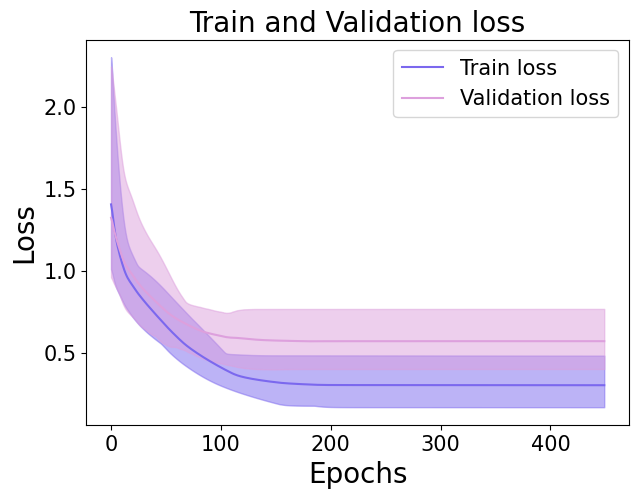

In [25]:
def smooth_curve(points, factor=0.5):
    smoothed_points = []
    for point in points:
        if smoothed_points:
            previous = smoothed_points[-1]
            smoothed_points.append(previous * factor + point * (1 - factor))
        else:
            smoothed_points.append(point)
    return smoothed_points

epochs = range(0,450)

f=plt.figure(figsize=[7,5])
plt.plot(epochs, smooth_curve(train_loss_mean), 'k', color='mediumslateblue',label='Train loss')
plt.fill_between(epochs, smooth_curve(train_loss_min), smooth_curve(train_loss_max),alpha=0.5, edgecolor='mediumslateblue', facecolor='mediumslateblue')
plt.plot(epochs, smooth_curve(val_loss_mean), 'k', color='plum',label='Validation loss')
plt.fill_between(epochs, smooth_curve(val_loss_min), smooth_curve(val_loss_max),alpha=0.5, edgecolor='plum', facecolor='plum')
plt.title('Train and Validation loss',fontsize=20)
plt.xlabel('Epochs',fontsize=20)
plt.ylabel('Loss',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.legend(fontsize=15)
plt.savefig('Trainingloss7-5.png', dpi=600)

In [112]:
import matplotlib.pyplot as plt
train_acc_min=[]
train_acc_max=[]
train_acc_mean =[]
for i in range(0, 450):
    maxv=max(train_acc[0][i],train_acc[1][i],train_acc[2][i] , train_acc[3][i],train_acc[4][i])
    minv=min(train_acc[0][i],train_acc[1][i],train_acc[2][i],train_acc[3][i],train_acc[4][i])
    meanv=(train_acc[0][i]+train_acc[1][i]+train_acc[2][i]+train_acc[3][i]+train_acc[4][i]) /5
    train_acc_min.append(minv)
    train_acc_max.append(maxv)
    train_acc_mean.append(meanv)


val_acc_min=[]
val_acc_max=[]
val_acc_mean=[]
for i in range(0, 400):
        maxv=max(val_acc[0][i],val_acc[1][i],val_acc[2][i] , val_acc[3][i],val_acc[4][i])
        minv=min(val_acc[0][i],val_acc[1][i],val_acc[2][i] , val_acc[3][i],val_acc[4][i])
        meanv=(val_acc[0][i]+val_acc[1][i]+val_acc[2][i]+ val_acc[3][i]+val_acc[4][i]) /5
        val_acc_min.append(minv)
        val_acc_max.append(maxv)
        val_acc_mean.append(meanv)


i=449
w = np.array([val_acc[0][i],val_acc[1][i],val_acc[2][i],val_acc[3][i],val_acc[4][i]])
s=np.std(w)
meanv=np.mean(w)
print(s, meanv)

0.05642875527763533 0.7873188257217407


In [114]:
for x in val_acc:
    print(max(x))

0.75
0.75
0.8695651888847351
0.8260869383811951
0.8260869383811951


/var/folders/_t/wkz76zf10112hkp5k80v9w540000gp/T/ipykernel_1183/1139886704.py:3: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, smooth_curve(train_acc_mean), 'k', color='mediumslateblue',label='Train acc')
/var/folders/_t/wkz76zf10112hkp5k80v9w540000gp/T/ipykernel_1183/1139886704.py:5: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, smooth_curve(val_acc_mean), 'k', color='plum',label='Validation acc')


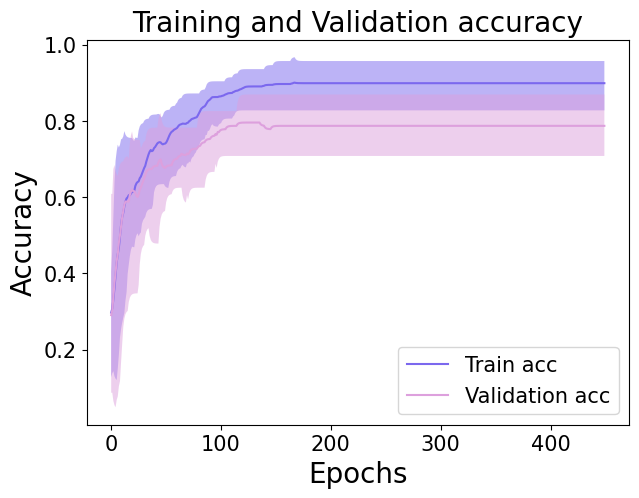

In [27]:
f=plt.figure(figsize=[7,5])
epochs = range(0,450)
plt.plot(epochs, smooth_curve(train_acc_mean), 'k', color='mediumslateblue',label='Train acc')
plt.fill_between(epochs, smooth_curve(train_acc_min), smooth_curve(train_acc_max),alpha=0.5, facecolor='mediumslateblue')
plt.plot(epochs, smooth_curve(val_acc_mean), 'k', color='plum',label='Validation acc')
plt.fill_between(epochs, smooth_curve(val_acc_min), smooth_curve(val_acc_max),alpha=0.5, facecolor='plum')
plt.title('Training and Validation accuracy',fontsize=20)
plt.xlabel('Epochs',fontsize=20)
plt.ylabel('Accuracy',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
#plt.legend(["train","test"],loc="upper left")
plt.legend(loc = 4,fontsize=15)
plt.savefig('Trainingacc2.png', dpi=600)
plt.show()


0.05240616404376989 0.8990175366401673


/var/folders/_t/wkz76zf10112hkp5k80v9w540000gp/T/ipykernel_1183/1707694595.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, smooth_curve(train_auc_mean), 'k', color='mediumslateblue',label='Train AUROC')
/var/folders/_t/wkz76zf10112hkp5k80v9w540000gp/T/ipykernel_1183/1707694595.py:37: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, smooth_curve(val_auc_mean), 'k', color='plum',label='Validation AUROC')


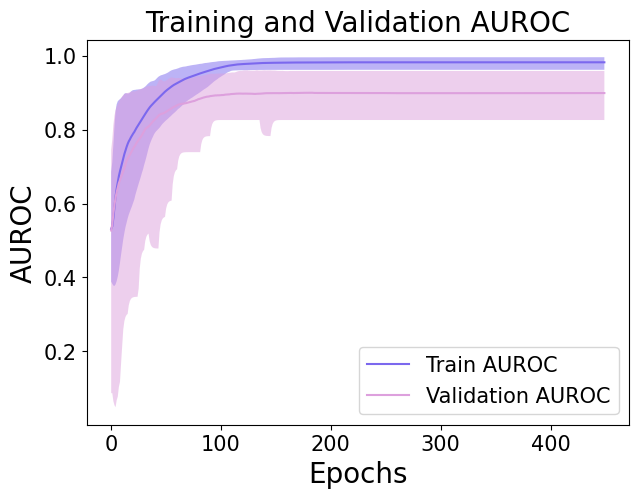

In [ ]:
import matplotlib.pyplot as plt
train_auc_min=[]
train_auc_max=[]
train_auc_mean =[]
for i in range(0, 450):
    maxv=max(train_auc[0][i],train_auc[1][i],train_auc[2][i] , train_auc[3][i],train_auc[4][i])
    minv=min(train_auc[0][i],train_auc[1][i],train_auc[2][i],train_auc[3][i],train_auc[4][i])
    meanv=(train_auc[0][i]+train_auc[1][i]+train_auc[2][i]+train_auc[3][i]+train_auc[4][i]) /5
    train_auc_min.append(minv)
    train_auc_max.append(maxv)
    train_auc_mean.append(meanv)


val_auc_min=[]
val_auc_max=[]
val_auc_mean=[]
for i in range(0, 450):
        maxv=max(val_auc[0][i],val_auc[1][i],val_auc[2][i] , val_auc[3][i],val_auc[4][i])
        minv=min(val_auc[0][i],val_auc[1][i],val_auc[2][i] , val_auc[3][i],val_acc[4][i])
        meanv=(val_auc[0][i]+val_auc[1][i]+val_auc[2][i]+ val_auc[3][i]+val_auc[4][i]) /5
        val_auc_min.append(minv)
        val_auc_max.append(maxv)
        val_auc_mean.append(meanv)


i=449
w = np.array([val_auc[0][i],val_auc[1][i],val_auc[2][i],val_auc[3][i],val_auc[4][i]])
s=np.std(w)
meanv=np.mean(w)
print(s, meanv)


f=plt.figure(figsize=[7,5])
epochs = range(0,450)
plt.plot(epochs, smooth_curve(train_auc_mean), 'k', color='mediumslateblue',label='Train AUROC')
plt.fill_between(epochs, smooth_curve(train_auc_min), smooth_curve(train_auc_max),alpha=0.5, facecolor='mediumslateblue')
plt.plot(epochs, smooth_curve(val_auc_mean), 'k', color='plum',label='Validation AUROC')
plt.fill_between(epochs, smooth_curve(val_auc_min), smooth_curve(val_auc_max),alpha=0.5, facecolor='plum')
plt.title('Training and Validation AUROC',fontsize=20)
plt.xlabel('Epochs',fontsize=20)
plt.ylabel('AUROC',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
#plt.legend(["train","test"],loc="upper left")
plt.legend(loc = 4,fontsize=15)
# plt.savefig('Trainingacc2.png', dpi=600)
plt.show()


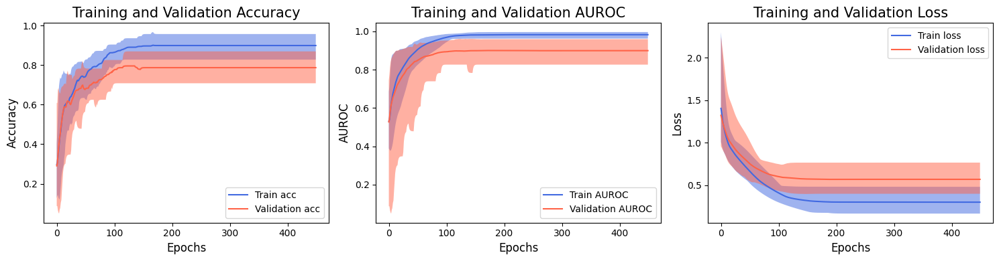

In [39]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns


    




# fig, axes = plt.subplot.s(2, 3, figsize=(15, 4))

# plt.savefig("combined_Dq_Wasserstein_heatmap.png", dpi=300, bbox_inches='tight')
plt.show()


import matplotlib.pyplot as plt

# Set figure size
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

# Plot Training and Validation Accuracy
epochs = range(0, 450)
axes[0].plot(epochs, smooth_curve(train_acc_mean), color='royalblue', label='Train acc')
axes[0].fill_between(epochs, smooth_curve(train_acc_min), smooth_curve(train_acc_max), alpha=0.5, facecolor='royalblue')
axes[0].plot(epochs, smooth_curve(val_acc_mean), color='tomato', label='Validation acc')
axes[0].fill_between(epochs, smooth_curve(val_acc_min), smooth_curve(val_acc_max), alpha=0.5, facecolor='tomato')
axes[0].set_title('Training and Validation Accuracy', fontsize=15)
axes[0].set_xlabel('Epochs', fontsize=12)
axes[0].set_ylabel('Accuracy', fontsize=12)
axes[0].tick_params(axis='both', which='major', labelsize=10)
axes[0].legend(loc=4, fontsize=10)

# Plot Training and Validation AUROC
axes[1].plot(epochs, smooth_curve(train_auc_mean), color='royalblue', label='Train AUROC')
axes[1].fill_between(epochs, smooth_curve(train_auc_min), smooth_curve(train_auc_max), alpha=0.5, facecolor='royalblue')
axes[1].plot(epochs, smooth_curve(val_auc_mean), color='tomato', label='Validation AUROC')
axes[1].fill_between(epochs, smooth_curve(val_auc_min), smooth_curve(val_auc_max), alpha=0.5, facecolor='tomato')
axes[1].set_title('Training and Validation AUROC', fontsize=15)
axes[1].set_xlabel('Epochs', fontsize=12)
axes[1].set_ylabel('AUROC', fontsize=12)
axes[1].tick_params(axis='both', which='major', labelsize=10)
axes[1].legend(loc=4, fontsize=10)


axes[2].plot(epochs, smooth_curve(train_loss_mean), color='royalblue', label='Train loss')
axes[2].fill_between(epochs, smooth_curve(train_loss_min), smooth_curve(train_loss_max), alpha=0.5, facecolor='royalblue')
axes[2].plot(epochs, smooth_curve(val_loss_mean), color='tomato', label='Validation loss')
axes[2].fill_between(epochs, smooth_curve(val_loss_min), smooth_curve(val_loss_max), alpha=0.5, facecolor='tomato')
axes[2].set_title('Training and Validation Loss', fontsize=15)
axes[2].set_xlabel('Epochs', fontsize=12)
axes[2].set_ylabel('Loss', fontsize=12)
axes[2].tick_params(axis='both', which='major', labelsize=10)
axes[2].legend(fontsize=10)

# Adjust layout and save figure
plt.tight_layout(h_pad=0.2)  # Adjusted h_pad to increase row spacing
# axes.legend(fontsize=13, frameon=False, loc='upper left')
plt.savefig("logourmodel.png", dpi=300, bbox_inches='tight')

# plt.savefig('TrainingSummary.png', dpi=600)
plt.show()



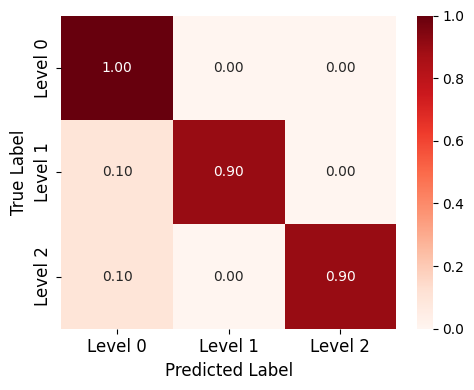

In [55]:
conf_matrix = np.array([[10, 0, 0],
                        [1, 9, 0],
                        [1, 0, 9]])

class_labels = ['Level 0', 'Level 1', 'Level 2']

conf_matrix = conf_matrix.astype('float') / conf_matrix.sum(axis=1, keepdims=True)

plt.figure(figsize=(5 ,4))
sns.heatmap(conf_matrix, annot=True, fmt='.2f', cmap='Reds', xticklabels=class_labels, yticklabels=class_labels)

# Add labels and title
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
# plt.title('Confusion Matrix', fontsize=13)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()  # Adjusted h_pad to increase row spacing

# Save and show plot
plt.savefig('confusion_matrix_test_ourmodel.png', dpi=600, bbox_inches='tight')
plt.show()

In [63]:

len(X_raweeg)

147

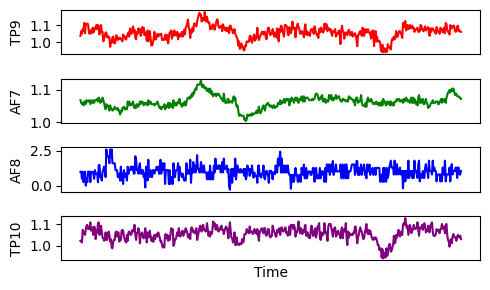

In [104]:
import numpy as np
import matplotlib.pyplot as plt

# Use the first data point (sample)
sample = X_raweeg[67][:500] # shape: (time_steps, 4)

plt.figure(figsize=(5, 3))
colors = ['red', 'green', 'blue', 'purple']
channel_names = ['TP9', 'AF7', 'AF8', 'TP10']

for ch in range(4):
    plt.subplot(4, 1, ch + 1)
    plt.plot(sample[:, ch], color=colors[ch])
    plt.ylabel(channel_names[ch])
    plt.xticks([])
    if ch < 3:
        plt.gca().set_xticklabels([])

plt.xlabel('Time')
plt.tight_layout()
plt.savefig("rawdatasmaple.png", dpi=600, bbox_inches='tight')

plt.show()


# final final

In [3]:

def get_memory_usage():
    process = psutil.Process(os.getpid())
    return process.memory_info().rss / (1024 * 1024)  

In [18]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Flatten, Concatenate, BatchNormalization, Dropout, LSTM, SpatialDropout1D
from tensorflow.keras.models import Model
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import KFold, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.utils import resample
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Attention, GlobalAveragePooling1D

import wandb
df = pd.read_pickle('/Users/athenasaghi/VSProjects/CognitiveFatigueDetection/processed_data_full.pkl')



X_raweeg = np.stack(df['raweeg'].values)
X_features = np.stack(df['features'].values)
Y_labels = df['label'].values

# Remove class 3
mask = Y_labels != 3
X_raweeg = X_raweeg[mask]
X_features = X_features[mask]
Y_labels = Y_labels[mask]

num_classes = len(np.unique(Y_labels))
Y_labels = to_categorical(Y_labels, num_classes=num_classes)

scaler = StandardScaler()
X_raweeg = scaler.fit_transform(X_raweeg.reshape(-1, X_raweeg.shape[-1])).reshape(X_raweeg.shape)
X_features = scaler.fit_transform(X_features.reshape(-1, X_features.shape[-1])).reshape(X_features.shape)

# Replace padding zeros with small noise to avoid learning issues
X_raweeg[X_raweeg == 0] = np.random.normal(loc=0, scale=1e-6, size=np.sum(X_raweeg == 0))

# Oversample minority classes
X_resampled, Y_resampled, Xf_resampled = [], [], []
labels = np.argmax(Y_labels, axis=1)
for cls in np.unique(labels):
    cls_indices = np.where(labels == cls)[0]
    X_cls_raweeg = X_raweeg[cls_indices]
    X_cls_features = X_features[cls_indices]
    Y_cls = Y_labels[cls_indices]
    X_cls_raweeg, Y_cls, X_cls_features = resample(X_cls_raweeg, Y_cls, X_cls_features, n_samples=max([len(np.where(labels == c)[0]) for c in np.unique(labels)]), random_state=42)
    X_resampled.append(X_cls_raweeg)
    Y_resampled.append(Y_cls)
    Xf_resampled.append(X_cls_features)

X_raweeg = np.vstack(X_resampled)
Y_labels = np.vstack(Y_resampled)
X_features = np.vstack(Xf_resampled)

# Split into train and test sets
X_train_raweeg, X_test_raweeg, X_train_features, X_test_features, Y_train, Y_test = train_test_split(
    X_raweeg, X_features, Y_labels, test_size=0.2, random_state=42, stratify=np.argmax(Y_labels, axis=1)
)


In [81]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dropout, Dense, BatchNormalization
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import AdamW
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.optimizers.schedules import ExponentialDecay
import psutil

from tensorflow.keras.layers import Conv1D, MaxPooling1D, GlobalAveragePooling1D

# Set aside a test set before any training

# print("Max raw EEG:", np.max(X_train_raweeg))
# print("Min raw EEG:", np.min(X_train_raweeg))
# print("Max features:", np.max(X_train_features))
# print("Min features:", np.min(X_train_features))


scaler_raweeg = MinMaxScaler()
scaler_features = MinMaxScaler()

X_train_raweeg = scaler_raweeg.fit_transform(X_train_raweeg.reshape(-1, X_train_raweeg.shape[-1])).reshape(X_train_raweeg.shape)
X_test_raweeg = scaler_raweeg.transform(X_test_raweeg.reshape(-1, X_test_raweeg.shape[-1])).reshape(X_test_raweeg.shape)

X_train_features = scaler_features.fit_transform(X_train_features.reshape(-1, X_train_features.shape[-1])).reshape(X_train_features.shape)
X_test_features = scaler_features.transform(X_test_features.reshape(-1, X_test_features.shape[-1])).reshape(X_test_features.shape)

print(X_train_raweeg.shape, X_train_features.shape, Y_train.shape)
print(X_test_raweeg.shape, X_test_features.shape, Y_test.shape)

def add_noise(data, noise_level=0.05):
    return data + noise_level * np.random.randn(*data.shape)

# X_train_raweeg = add_noise(X_train_raweeg, noise_level=0.005)
# X_train_features = add_noise(X_train_features, noise_level=0.01)


# Encoder function with L2 normalization before output
def create_cnn_encoder(input_shape):
    inputs = Input(shape=input_shape)
    x = Conv1D(16, kernel_size=3, activation='relu')(inputs)
    x = MaxPooling1D(pool_size=2)(x)
    x = Conv1D(32, kernel_size=3, activation='relu')(x)
    x = GlobalAveragePooling1D()(x)
    x = Dense(32, activation=None)(x)
    model = Model(inputs=inputs, outputs=x)
    return model


def create_lstm_encoder(input_shape):
    inputs = Input(shape=input_shape)
    x = LSTM(32, return_sequences=False, kernel_regularizer=l2(1e-4))(inputs)
    x = Dropout(0.5)(x)
    x = Dense(32, activation=None, kernel_regularizer=l2(1e-4))(x)
    model = Model(inputs=inputs, outputs=x)
    return model


encoder_raweeg = create_cnn_encoder(X_train_raweeg.shape[1:])
encoder_features = create_cnn_encoder(X_train_features.shape[1:])


def contrastive_loss(z_raweeg, z_features, temperature=0.2):
    epsilon = 1e-6
    z_raweeg = tf.math.l2_normalize(z_raweeg + epsilon, axis=1)
    z_features = tf.math.l2_normalize(z_features + epsilon, axis=1)
    logits = tf.matmul(z_raweeg, z_features, transpose_b=True) / temperature
    batch_size = tf.shape(logits)[0]
    labels = tf.range(batch_size)
    loss = tf.keras.losses.sparse_categorical_crossentropy(labels, logits, from_logits=True)
    return tf.reduce_mean(loss)



lr_schedule = ExponentialDecay(
    initial_learning_rate=1e-4,
    decay_steps=1000,
    decay_rate=0.96,
    staircase=True
)

optimizer = AdamW(learning_rate=lr_schedule, weight_decay=1e-4, clipnorm=0.6)
epochs = 200
batch_size = 32 

start_time = time.time()
initial_ram = get_memory_usage()
for epoch in range(epochs):
    idx = np.random.permutation(len(X_train_raweeg))
    X_raweeg_shuffled = X_train_raweeg[idx]
    X_features_shuffled = X_train_features[idx]
    losses = []

    # print(len(X_train_raweeg) - batch_size + 1, batch_size)
    for i in range(0, len(X_train_raweeg) - batch_size + 1, batch_size):  # Ensure full batches
        x_r_batch = X_raweeg_shuffled[i:i+batch_size]
        x_f_batch = X_features_shuffled[i:i+batch_size]
        with tf.GradientTape() as tape:
            z_r = encoder_raweeg(x_r_batch, training=True)
            z_f = encoder_features(x_f_batch, training=True)
            loss = contrastive_loss(z_r, z_f)

        grads = tape.gradient(loss, encoder_raweeg.trainable_variables + encoder_features.trainable_variables)

        # Check for NaN in gradients
        if any(tf.math.reduce_any(tf.math.is_nan(g)) for g in grads if g is not None):
            print("NaN detected in gradients! Stopping training.")
            break

        optimizer.apply_gradients(zip(grads, encoder_raweeg.trainable_variables + encoder_features.trainable_variables))
        losses.append(loss.numpy())

    print(f"Epoch {epoch+1}/{epochs}, Contrastive Loss: {np.mean(losses):.4f}")

# Check if embeddings are meaningful (should have variance)
z_r_sample = encoder_raweeg.predict(X_train_raweeg[:10])
print("Encoder Output - Mean:", np.mean(z_r_sample), "Std Dev:", np.std(z_r_sample))


(117, 1854, 4) (117, 202, 16) (117, 3)
(30, 1854, 4) (30, 202, 16) (30, 3)
Epoch 1/200, Contrastive Loss: 3.4785
Epoch 2/200, Contrastive Loss: 3.4752
Epoch 3/200, Contrastive Loss: 3.4722
Epoch 4/200, Contrastive Loss: 3.4692
Epoch 5/200, Contrastive Loss: 3.4673
Epoch 6/200, Contrastive Loss: 3.4672
Epoch 7/200, Contrastive Loss: 3.4649
Epoch 8/200, Contrastive Loss: 3.4625
Epoch 9/200, Contrastive Loss: 3.4634
Epoch 10/200, Contrastive Loss: 3.4629
Epoch 11/200, Contrastive Loss: 3.4625
Epoch 12/200, Contrastive Loss: 3.4635
Epoch 13/200, Contrastive Loss: 3.4618
Epoch 14/200, Contrastive Loss: 3.4616
Epoch 15/200, Contrastive Loss: 3.4611
Epoch 16/200, Contrastive Loss: 3.4603
Epoch 17/200, Contrastive Loss: 3.4601
Epoch 18/200, Contrastive Loss: 3.4595
Epoch 19/200, Contrastive Loss: 3.4586
Epoch 20/200, Contrastive Loss: 3.4580
Epoch 21/200, Contrastive Loss: 3.4572
Epoch 22/200, Contrastive Loss: 3.4569
Epoch 23/200, Contrastive Loss: 3.4549
Epoch 24/200, Contrastive Loss: 3.455

In [98]:
from tensorflow.keras.layers import Concatenate
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score

k = 8
epochs = 450
kf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)
num_classes = Y_labels.shape[1]

metrics_all = { 'loss': [], 'val_loss': [], 'accuracy': [], 'val_accuracy': [], 'auc': [], 'val_auc': [],
                'precision': [], 'val_precision': [], 'recall': [], 'val_recall': [],
                'f1': [], 'val_f1': [], 'specificity': [], 'val_specificity': [], 'confusion_matrix': []}

metrics_per_class = { f'{metric}_class_{i}': [] for i in range(num_classes)
                      for metric in ['precision', 'recall', 'f1', 'specificity',
                                     'val_precision', 'val_recall', 'val_f1', 'val_specificity','val_acc'] }

true_labels = []
pred_labels = []
misc1 = 0
misc2 = 0
for fold, (train_idx, val_idx) in enumerate(kf.split(X_train_raweeg, np.argmax(Y_train, axis=1))):
    print(f"\n--------------- Fold {fold + 1}/{k}")

    X_train_raweeg_fold, X_val_raweeg_fold = X_train_raweeg[train_idx], X_train_raweeg[val_idx]
    X_train_features_fold, X_val_features_fold = X_train_features[train_idx], X_train_features[val_idx]
    Y_train_fold, Y_val_fold = Y_train[train_idx], Y_train[val_idx]

    input_raweeg = Input(shape=(X_train_raweeg.shape[1], X_train_raweeg.shape[2]))
    input_features = Input(shape=(X_train_features.shape[1], X_train_features.shape[2]))

    z_raweeg = encoder_raweeg(input_raweeg)
    z_features = encoder_features(input_features)

    combined = Concatenate()([z_raweeg, z_features])
    output = Dense(num_classes, activation='softmax')(combined)

    classifier = Model(inputs=[input_raweeg, input_features], outputs=output)
    classifier.compile(optimizer=AdamW(learning_rate=1e-3, weight_decay=1e-4),
                       loss='categorical_crossentropy',
                       metrics=['accuracy', tf.keras.metrics.AUC(name='auc'),
                                tf.keras.metrics.Precision(name='precision'),
                                tf.keras.metrics.Recall(name='recall'),
                                tf.keras.metrics.SpecificityAtSensitivity(0.5, name='specificity')] +
                                [tf.keras.metrics.Precision(name=f'precision_class_{i}', class_id=i) for i in range(num_classes)] +
                                [tf.keras.metrics.Recall(name=f'recall_class_{i}', class_id=i) for i in range(num_classes)])


    history = classifier.fit([X_train_raweeg_fold, X_train_features_fold], Y_train_fold,
                             validation_data=([X_val_raweeg_fold, X_val_features_fold], Y_val_fold),
                             epochs=epochs, batch_size=128, verbose=1,
                             callbacks=[ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)])


   

    y_pred = classifier.predict([X_val_raweeg_fold, X_val_features_fold])
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(Y_val_fold, axis=1)

    t1 = get_memory_usage()
    t2 = time.time()
    for metric in metrics_all.keys():
        # print(metric)
        if metric in history.history:
            metrics_all[metric].append(history.history[metric])
    true_labels.extend(y_true_classes)
    pred_labels.extend(y_pred_classes)

    cm = confusion_matrix(y_true_classes, y_pred_classes)
    cm_dict = {f"row_{i}": row.tolist() for i, row in enumerate(cm)}

    metrics_all['confusion_matrix'] = cm_dict

    for i in range(num_classes):
            metrics_per_class[f'precision_class_{i}'].append(history.history[f'precision_class_{i}'])
           
            metrics_per_class[f'recall_class_{i}'].append(history.history[f'recall_class_{i}'])
            f1_class = f1_score(y_true_classes, y_pred_classes, average=None)[i]
            metrics_per_class[f'f1_class_{i}'].append(f1_class)
            mask = (y_true_classes == i)
            metrics_per_class[f'val_acc_class_{i}'].append(accuracy_score(y_true_classes[mask], y_pred_classes[mask]))
    misc2 = misc2 + time.time()-t2        
    misc1 = misc1+ get_memory_usage() - t1


total_time = time.time() - start_time - misc2
final_ram_usage = get_memory_usage() - initial_ram - misc1

print("ram usage", final_ram_usage)
print("total time", total_time)


--------------- Fold 1/8
Epoch 1/450
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - accuracy: 0.3039 - auc: 0.5289 - loss: 1.3466 - precision: 0.3944 - precision_class_0: 0.2414 - precision_class_1: 0.6786 - precision_class_2: 0.1429 - recall: 0.2745 - recall_class_0: 0.2059 - recall_class_1: 0.5588 - recall_class_2: 0.0588 - specificity: 0.4804 - val_accuracy: 0.3333 - val_auc: 0.5422 - val_loss: 1.2047 - val_precision: 0.3636 - val_precision_class_0: 0.4000 - val_precision_class_1: 0.6667 - val_precision_class_2: 0.0000e+00 - val_recall: 0.2667 - val_recall_class_0: 0.4000 - val_recall_class_1: 0.4000 - val_recall_class_2: 0.0000e+00 - val_specificity: 0.5000 - learning_rate: 0.0010
Epoch 2/450
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - accuracy: 0.3333 - auc: 0.5568 - loss: 1.2645 - precision: 0.4143 - precision_class_0: 0.2667 - precision_class_1: 0.7308 - precision_class_2: 0.1429 - recall: 0.2843 - recall_class_0: 0.2353 - recall_class_1: 0.5588 - recall_class_2: 0.0588 - specificity: 0.539

In [99]:
train_loss = metrics_all['loss']
val_loss = metrics_all['val_loss']
train_acc = metrics_all['accuracy']
val_acc = metrics_all['val_accuracy']

In [84]:
history.history.keys()

dict_keys(['accuracy', 'auc', 'loss', 'precision', 'precision_class_0', 'precision_class_1', 'precision_class_2', 'recall', 'recall_class_0', 'recall_class_1', 'recall_class_2', 'specificity', 'val_accuracy', 'val_auc', 'val_loss', 'val_precision', 'val_precision_class_0', 'val_precision_class_1', 'val_precision_class_2', 'val_recall', 'val_recall_class_0', 'val_recall_class_1', 'val_recall_class_2', 'val_specificity', 'learning_rate'])

In [ ]:
val_loss

In [102]:
import matplotlib.pyplot as plt
train_loss_min=[]
train_loss_max=[]
train_loss_mean =[]
for i in range(0, 450):
    maxv=max(train_loss[0][i],train_loss[1][i],train_loss[2][i] , train_loss[3][i],train_loss[4][i])
    minv=min(train_loss[0][i],train_loss[1][i],train_loss[2][i],train_loss[3][i],train_loss[4][i])
    meanv=(train_loss[0][i]+train_loss[1][i]+train_loss[2][i]+train_loss[3][i]+train_loss[4][i]) /5
    train_loss_min.append(minv)
    train_loss_max.append(maxv)
    train_loss_mean.append(meanv)

val_loss_min=[]
val_loss_max=[]
val_loss_mean=[]
for i in range(0, 450):
    maxv=max(val_loss[0][i],val_loss[1][i],val_loss[2][i] , val_loss[3][i],val_loss[4][i])
    minv=min(val_loss[0][i],val_loss[1][i],val_loss[2][i] , val_loss[3][i],val_loss[4][i])
    meanv=(val_loss[0][i]+val_loss[1][i]+val_loss[2][i]+ val_loss[3][i]+val_loss[4][i]) /5
    val_loss_min.append(minv)
    val_loss_max.append(maxv)
    val_loss_mean.append(meanv)
    



/var/folders/_t/wkz76zf10112hkp5k80v9w540000gp/T/ipykernel_11502/3720630102.py:14: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, smooth_curve(train_loss_mean), 'k', color='mediumslateblue',label='Train loss')
/var/folders/_t/wkz76zf10112hkp5k80v9w540000gp/T/ipykernel_11502/3720630102.py:16: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, smooth_curve(val_loss_mean), 'k', color='plum',label='Validation loss')


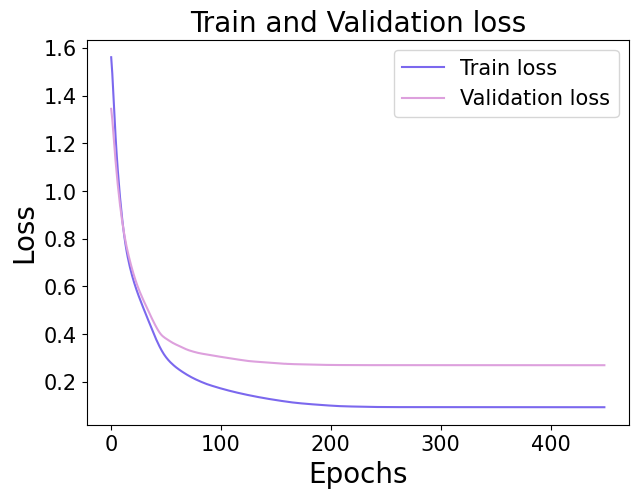

In [103]:
def smooth_curve(points, factor=0.5):
    smoothed_points = []
    for point in points:
        if smoothed_points:
            previous = smoothed_points[-1]
            smoothed_points.append(previous * factor + point * (1 - factor))
        else:
            smoothed_points.append(point)
    return smoothed_points

epochs = range(0,450)

f=plt.figure(figsize=[7,5])
plt.plot(epochs, smooth_curve(train_loss_mean), 'k', color='mediumslateblue',label='Train loss')
# plt.fill_between(epochs, smooth_curve(train_loss_min), smooth_curve(train_loss_max),alpha=0.5, edgecolor='mediumslateblue', facecolor='mediumslateblue')
plt.plot(epochs, smooth_curve(val_loss_mean), 'k', color='plum',label='Validation loss')
# plt.fill_between(epochs, smooth_curve(val_loss_min), smooth_curve(val_loss_max),alpha=0.5, edgecolor='plum', facecolor='plum')
plt.title('Train and Validation loss',fontsize=20)
plt.xlabel('Epochs',fontsize=20)
plt.ylabel('Loss',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.legend(fontsize=15)
plt.savefig('Trainingloss7-5.png', dpi=600)

In [109]:
import matplotlib.pyplot as plt
import numpy as np

train_acc_min = []
train_acc_max = []
train_acc_mean = []

for i in range(0, 450):
    vals = [train_acc[k][i] for k in range(8)]
    train_acc_min.append(min(vals))
    train_acc_max.append(max(vals))
    train_acc_mean.append(sum(vals) / 8)

val_acc_min = []
val_acc_max = []
val_acc_mean = []

for i in range(0, 450):
    vals = [val_acc[k][i] for k in range(8)]
    val_acc_min.append(min(vals))
    val_acc_max.append(max(vals))
    val_acc_mean.append(sum(vals) / 8)

i = 399
# w = np.array([val_acc[k][i] for k in range(8)])
w = val_acc_max
s = np.std(w)
meanv = np.mean(w)
print(s, meanv)


0.04017219212638838 0.986814815600713


/var/folders/_t/wkz76zf10112hkp5k80v9w540000gp/T/ipykernel_11502/2295430981.py:3: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, smooth_curve(train_acc_mean), 'k', color='mediumslateblue',label='Train acc')
/var/folders/_t/wkz76zf10112hkp5k80v9w540000gp/T/ipykernel_11502/2295430981.py:5: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  plt.plot(epochs, smooth_curve(val_acc_mean), 'k', color='plum',label='Validation acc')


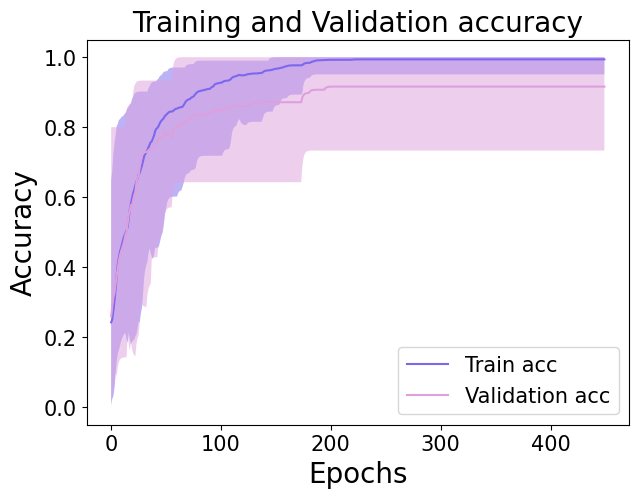

In [108]:
f=plt.figure(figsize=[7,5])
epochs = range(0,450)
plt.plot(epochs, smooth_curve(train_acc_mean), 'k', color='mediumslateblue',label='Train acc')
plt.fill_between(epochs, smooth_curve(train_acc_max), smooth_curve(train_acc_min),alpha=0.5, facecolor='mediumslateblue')
plt.plot(epochs, smooth_curve(val_acc_mean), 'k', color='plum',label='Validation acc')
plt.fill_between(epochs, smooth_curve(val_acc_max), smooth_curve(val_acc_min),alpha=0.5, facecolor='plum')
plt.title('Training and Validation accuracy',fontsize=20)
plt.xlabel('Epochs',fontsize=20)
plt.ylabel('Accuracy',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
#plt.legend(["train","test"],loc="upper left")
plt.legend(loc = 4,fontsize=15)
plt.savefig('Trainingacc2.png', dpi=600)
plt.show()


In [106]:
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix
# with more noise 0.005 + scheduler
y_pred_test = classifier.predict([X_test_raweeg, X_test_features])
y_pred_classes_test = np.argmax(y_pred_test, axis=1)
y_true_classes_test = np.argmax(Y_test, axis=1)

test_accuracy = accuracy_score(y_true_classes_test, y_pred_classes_test)
test_auc = roc_auc_score(Y_test, y_pred_test, multi_class='ovr')
conf_matrix = confusion_matrix(y_true_classes_test, y_pred_classes_test)

print(f"\nTest Accuracy: {test_accuracy:.4f}")
print(f"Test AUC: {test_auc:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step

Test Accuracy: 1.0000
Test AUC: 1.0000


# final final final

In [1]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Flatten, Concatenate, BatchNormalization, Dropout, LSTM, SpatialDropout1D
from tensorflow.keras.models import Model
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import KFold, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.utils import resample
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Attention, GlobalAveragePooling1D

# import wandb
df = pd.read_pickle('/Users/athenasaghi/VSProjects/CognitiveFatigueDetection/processed_data_full.pkl')



X_raweeg = np.stack(df['raweeg'].values)
X_features = np.stack(df['features'].values)
Y_labels = df['label'].values

# Remove class 3
mask = Y_labels != 3
X_raweeg = X_raweeg[mask]
X_features = X_features[mask]
Y_labels = Y_labels[mask]

num_classes = len(np.unique(Y_labels))
Y_labels = to_categorical(Y_labels, num_classes=num_classes)

scaler = StandardScaler()
X_raweeg = scaler.fit_transform(X_raweeg.reshape(-1, X_raweeg.shape[-1])).reshape(X_raweeg.shape)
X_features = scaler.fit_transform(X_features.reshape(-1, X_features.shape[-1])).reshape(X_features.shape)

# Replace padding zeros with small noise to avoid learning issues
X_raweeg[X_raweeg == 0] = np.random.normal(loc=0, scale=1e-6, size=np.sum(X_raweeg == 0))

# Oversample minority classes
X_resampled, Y_resampled, Xf_resampled = [], [], []
labels = np.argmax(Y_labels, axis=1)
for cls in np.unique(labels):
    cls_indices = np.where(labels == cls)[0]
    X_cls_raweeg = X_raweeg[cls_indices]
    X_cls_features = X_features[cls_indices]
    Y_cls = Y_labels[cls_indices]
    X_cls_raweeg, Y_cls, X_cls_features = resample(X_cls_raweeg, Y_cls, X_cls_features, n_samples=max([len(np.where(labels == c)[0]) for c in np.unique(labels)]), random_state=42)
    X_resampled.append(X_cls_raweeg)
    Y_resampled.append(Y_cls)
    Xf_resampled.append(X_cls_features)

X_raweeg = np.vstack(X_resampled)
Y_labels = np.vstack(Y_resampled)
X_features = np.vstack(Xf_resampled)

# Split into train and test sets
X_train_raweeg, X_test_raweeg, X_train_features, X_test_features, Y_train, Y_test = train_test_split(
    X_raweeg, X_features, Y_labels, test_size=0.05, random_state=42, stratify=np.argmax(Y_labels, axis=1)
)


In [3]:
pwd

'/Users/athenasaghi/VSProjects/CognitiveFatigueDetection/Modeling'

In [38]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dropout, Dense, BatchNormalization
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import AdamW
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.optimizers.schedules import ExponentialDecay
import psutil

from tensorflow.keras.layers import Conv1D, MaxPooling1D, GlobalAveragePooling1D

# Set aside a test set before any training

# print("Max raw EEG:", np.max(X_train_raweeg))
# print("Min raw EEG:", np.min(X_train_raweeg))
# print("Max features:", np.max(X_train_features))
# print("Min features:", np.min(X_train_features))


scaler_raweeg = MinMaxScaler()
scaler_features = MinMaxScaler()

X_train_raweeg = scaler_raweeg.fit_transform(X_train_raweeg.reshape(-1, X_train_raweeg.shape[-1])).reshape(X_train_raweeg.shape)
X_test_raweeg = scaler_raweeg.transform(X_test_raweeg.reshape(-1, X_test_raweeg.shape[-1])).reshape(X_test_raweeg.shape)

X_train_features = scaler_features.fit_transform(X_train_features.reshape(-1, X_train_features.shape[-1])).reshape(X_train_features.shape)
X_test_features = scaler_features.transform(X_test_features.reshape(-1, X_test_features.shape[-1])).reshape(X_test_features.shape)

print(X_train_raweeg.shape, X_train_features.shape, Y_train.shape)
print(X_test_raweeg.shape, X_test_features.shape, Y_test.shape)

def add_noise(data, noise_level=0.05):
    return data + noise_level * np.random.randn(*data.shape)

# X_train_raweeg = add_noise(X_train_raweeg, noise_level=0.005)
# X_train_features = add_noise(X_train_features, noise_level=0.01)


# Encoder function with L2 normalization before output
def create_cnn_encoder(input_shape):
    inputs = Input(shape=input_shape)
    x = Conv1D(16, kernel_size=3, activation='relu')(inputs)
    x = MaxPooling1D(pool_size=2)(x)
    x = Conv1D(32, kernel_size=3, activation='relu')(x)
    x = GlobalAveragePooling1D()(x)
    x = Dense(32, activation=None)(x)
    model = Model(inputs=inputs, outputs=x)
    return model


def create_lstm_encoder(input_shape):
    inputs = Input(shape=input_shape)
    x = LSTM(32, return_sequences=False, kernel_regularizer=l2(1e-4))(inputs)
    x = Dropout(0.5)(x)
    x = Dense(32, activation=None, kernel_regularizer=l2(1e-4))(x)
    model = Model(inputs=inputs, outputs=x)
    return model


encoder_raweeg = create_cnn_encoder(X_train_raweeg.shape[1:])
encoder_features = create_cnn_encoder(X_train_features.shape[1:])


def contrastive_loss(z_raweeg, z_features, temperature=0.2):
    epsilon = 1e-6
    z_raweeg = tf.math.l2_normalize(z_raweeg + epsilon, axis=1)
    z_features = tf.math.l2_normalize(z_features + epsilon, axis=1)
    logits = tf.matmul(z_raweeg, z_features, transpose_b=True) / temperature
    batch_size = tf.shape(logits)[0]
    labels = tf.range(batch_size)
    loss = tf.keras.losses.sparse_categorical_crossentropy(labels, logits, from_logits=True)
    return tf.reduce_mean(loss)



lr_schedule = ExponentialDecay(
    initial_learning_rate=1e-3,
    decay_steps=1000,
    decay_rate=0.96,
    staircase=True
)

optimizer = AdamW(learning_rate=lr_schedule, weight_decay=1e-4, clipnorm=0.6)
epochs = 200
batch_size = 32 

start_time = time.time()
initial_ram = get_memory_usage()
for epoch in range(epochs):
    idx = np.random.permutation(len(X_train_raweeg))
    X_raweeg_shuffled = X_train_raweeg[idx]
    X_features_shuffled = X_train_features[idx]
    losses = []

    # print(len(X_train_raweeg) - batch_size + 1, batch_size)
    for i in range(0, len(X_train_raweeg) - batch_size + 1, batch_size):  # Ensure full batches
        x_r_batch = X_raweeg_shuffled[i:i+batch_size]
        x_f_batch = X_features_shuffled[i:i+batch_size]
        with tf.GradientTape() as tape:
            z_r = encoder_raweeg(x_r_batch, training=True)
            z_f = encoder_features(x_f_batch, training=True)
            loss = contrastive_loss(z_r, z_f)

        grads = tape.gradient(loss, encoder_raweeg.trainable_variables + encoder_features.trainable_variables)

        # Check for NaN in gradients
        if any(tf.math.reduce_any(tf.math.is_nan(g)) for g in grads if g is not None):
            print("NaN detected in gradients! Stopping training.")
            break

        optimizer.apply_gradients(zip(grads, encoder_raweeg.trainable_variables + encoder_features.trainable_variables))
        losses.append(loss.numpy())

    print(f"Epoch {epoch+1}/{epochs}, Contrastive Loss: {np.mean(losses):.4f}")

# Check if embeddings are meaningful (should have variance)
z_r_sample = encoder_raweeg.predict(X_train_raweeg[:10])
print("Encoder Output - Mean:", np.mean(z_r_sample), "Std Dev:", np.std(z_r_sample))


(139, 1854, 4) (139, 202, 16) (139, 3)
(8, 1854, 4) (8, 202, 16) (8, 3)
Epoch 1/200, Contrastive Loss: 3.4733
Epoch 2/200, Contrastive Loss: 3.4660
Epoch 3/200, Contrastive Loss: 3.4638
Epoch 4/200, Contrastive Loss: 3.4624
Epoch 5/200, Contrastive Loss: 3.4610
Epoch 6/200, Contrastive Loss: 3.4588
Epoch 7/200, Contrastive Loss: 3.4548
Epoch 8/200, Contrastive Loss: 3.4435
Epoch 9/200, Contrastive Loss: 3.4286
Epoch 10/200, Contrastive Loss: 3.3789
Epoch 11/200, Contrastive Loss: 3.2328
Epoch 12/200, Contrastive Loss: 3.1421
Epoch 13/200, Contrastive Loss: 3.1006
Epoch 14/200, Contrastive Loss: 3.0385
Epoch 15/200, Contrastive Loss: 3.0035
Epoch 16/200, Contrastive Loss: 2.9251
Epoch 17/200, Contrastive Loss: 2.9071
Epoch 18/200, Contrastive Loss: 2.9030
Epoch 19/200, Contrastive Loss: 2.8886
Epoch 20/200, Contrastive Loss: 2.8758
Epoch 21/200, Contrastive Loss: 2.8774
Epoch 22/200, Contrastive Loss: 2.8133
Epoch 23/200, Contrastive Loss: 2.8468
Epoch 24/200, Contrastive Loss: 2.8177
E

In [39]:
from tensorflow.keras.layers import Concatenate
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau


k = 5
epochs = 400
kf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)
num_classes = Y_labels.shape[1]

metrics_all = { 'loss': [], 'val_loss': [], 'accuracy': [], 'val_accuracy': [], 'auc': [], 'val_auc': [],
                'precision': [], 'val_precision': [], 'recall': [], 'val_recall': [],
                'f1': [], 'val_f1': [], 'specificity': [], 'val_specificity': [], 'confusion_matrix': []}

metrics_per_class = { f'{metric}_class_{i}': [] for i in range(num_classes)
                      for metric in ['precision', 'recall', 'f1', 'specificity',
                                     'val_precision', 'val_recall', 'val_f1', 'val_specificity','val_acc'] }

true_labels = []
pred_labels = []
misc1 = 0
misc2 = 0
for fold, (train_idx, val_idx) in enumerate(kf.split(X_train_raweeg, np.argmax(Y_train, axis=1))):
    print(f"\n--------------- Fold {fold + 1}/{k}")

    X_train_raweeg_fold, X_val_raweeg_fold = X_train_raweeg[train_idx], X_train_raweeg[val_idx]
    X_train_features_fold, X_val_features_fold = X_train_features[train_idx], X_train_features[val_idx]
    Y_train_fold, Y_val_fold = Y_train[train_idx], Y_train[val_idx]

    input_raweeg = Input(shape=(X_train_raweeg.shape[1], X_train_raweeg.shape[2]))
    input_features = Input(shape=(X_train_features.shape[1], X_train_features.shape[2]))

    z_raweeg = encoder_raweeg(input_raweeg)
    z_features = encoder_features(input_features)

    combined = Concatenate()([z_raweeg, z_features])
    output = Dense(num_classes, activation='softmax')(combined)

    classifier = Model(inputs=[input_raweeg, input_features], outputs=output)
    classifier.compile(optimizer=AdamW(learning_rate=1e-3, weight_decay=1e-4),
                       loss='categorical_crossentropy',
                       metrics=['accuracy', tf.keras.metrics.AUC(name='auc'),
                                tf.keras.metrics.Precision(name='precision'),
                                tf.keras.metrics.Recall(name='recall'),
                                tf.keras.metrics.SpecificityAtSensitivity(0.5, name='specificity')] +
                                [tf.keras.metrics.Precision(name=f'precision_class_{i}', class_id=i) for i in range(num_classes)] +
                                [tf.keras.metrics.Recall(name=f'recall_class_{i}', class_id=i) for i in range(num_classes)])


    history = classifier.fit([X_train_raweeg_fold, X_train_features_fold], Y_train_fold,
                             validation_data=([X_val_raweeg_fold, X_val_features_fold], Y_val_fold),
                             epochs=epochs, batch_size=128, verbose=1,
                             callbacks=[ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)])


   

    y_pred = classifier.predict([X_val_raweeg_fold, X_val_features_fold])
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true_classes = np.argmax(Y_val_fold, axis=1)

    t1 = get_memory_usage()
    t2 = time.time()
    for metric in metrics_all.keys():
        # print(metric)
        if metric in history.history:
            metrics_all[metric].append(history.history[metric])
    true_labels.extend(y_true_classes)
    pred_labels.extend(y_pred_classes)

    cm = confusion_matrix(y_true_classes, y_pred_classes)
    cm_dict = {f"row_{i}": row.tolist() for i, row in enumerate(cm)}

    metrics_all['confusion_matrix'] = cm_dict

    for i in range(num_classes):
            metrics_per_class[f'precision_class_{i}'].append(history.history[f'precision_class_{i}'])
           
            metrics_per_class[f'recall_class_{i}'].append(history.history[f'recall_class_{i}'])
            f1_class = f1_score(y_true_classes, y_pred_classes, average=None)[i]
            metrics_per_class[f'f1_class_{i}'].append(f1_class)
            mask = (y_true_classes == i)
            metrics_per_class[f'val_acc_class_{i}'].append(accuracy_score(y_true_classes[mask], y_pred_classes[mask]))
    misc2 = misc2 + time.time()-t2        
    misc1 = misc1+ get_memory_usage() - t1


total_time = time.time() - start_time - misc2
final_ram_usage = get_memory_usage() - initial_ram - misc1

print("ram usage", final_ram_usage)
print("total time", total_time)


--------------- Fold 1/5
Epoch 1/400
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - accuracy: 0.4324 - auc: 0.5007 - loss: 1.0972 - precision: 0.0000e+00 - precision_class_0: 0.0000e+00 - precision_class_1: 0.0000e+00 - precision_class_2: 0.0000e+00 - recall: 0.0000e+00 - recall_class_0: 0.0000e+00 - recall_class_1: 0.0000e+00 - recall_class_2: 0.0000e+00 - specificity: 0.2703 - val_accuracy: 0.3214 - val_auc: 0.4908 - val_loss: 1.0993 - val_precision: 0.0000e+00 - val_precision_class_0: 0.0000e+00 - val_precision_class_1: 0.0000e+00 - val_precision_class_2: 0.0000e+00 - val_recall: 0.0000e+00 - val_recall_class_0: 0.0000e+00 - val_recall_class_1: 0.0000e+00 - val_recall_class_2: 0.0000e+00 - val_specificity: 0.3750 - learning_rate: 0.0010
Epoch 2/400
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.4054 - auc: 0.5765 - loss: 1.0942 - precision: 0.0000e+00 - precision_class_0: 0.0000e+00 - precision_class_1: 0.0000e+00 - precision_class_2: 0.0000e+00 - recall: 0.0000e+00 - recall_class_0: 0

In [43]:
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix
# with more noise 0.005 + scheduler
y_pred_test = classifier.predict([X_test_raweeg, X_test_features])
y_pred_classes_test = np.argmax(y_pred_test, axis=1)
y_true_classes_test = np.argmax(Y_test, axis=1)

test_accuracy = accuracy_score(y_true_classes_test, y_pred_classes_test)
test_auc = roc_auc_score(Y_test, y_pred_test, multi_class='ovr')
conf_matrix = confusion_matrix(y_true_classes_test, y_pred_classes_test)

print(f"\nTest Accuracy: {test_accuracy:.4f}")
print(f"Test AUC: {test_auc:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

Test Accuracy: 1.0000
Test AUC: 1.0000


8

# visual model